In [ ]:
import geopandas as gpd
import pandas as pd
import numpy as np

# ── PARÁMETROS ──────────────────────────────────────────────
PATH_ATI = "Atitalaquia_grid_with_indicators_v4.gpkg"
PATH_GTO = "Guanajuato_grid_with_indicators_v4.gpkg"
# ────────────────────────────────────────────────────────────

# Carga como GeoDataFrame (tiene geometría + atributos)
gdf_ati = gpd.read_file(PATH_ATI)
gdf_gto = gpd.read_file(PATH_GTO)

# Para análisis tabular trabajamos con DataFrames normales
# La geometría la guardamos aparte para graficar después
df_ati = pd.DataFrame(gdf_ati.drop(columns='geometry'))
df_gto = pd.DataFrame(gdf_gto.drop(columns='geometry'))

print("=== Atitalaquia ===")
print(f"Shape: {df_ati.shape}")
print(df_ati.describe().round(2))

print("\n=== Guanajuato ===")
print(f"Shape: {df_gto.shape}")
print(df_gto.describe().round(2))

# Checamos distribución de población
for name, df in [("Atitalaquia", df_ati), ("Guanajuato", df_gto)]:
    pop = df['population_count_1_2km']
    print(f"\n{name} — población:")
    print(f"  Celdas con pop = 0:    {(pop == 0).sum()}")
    print(f"  Celdas con pop < 100:  {(pop < 100).sum()}")
    print(f"  Celdas con pop >= 100: {(pop >= 100).sum()}")
    print(f"  Máximo: {pop.max():.0f}  |  Mediana: {pop.median():.0f}")

=== Atitalaquia ===
Shape: (422, 32)
            area      id  dist_to_food  dist_to_food_inegi  \
count     422.00  422.00        422.00              422.00   
mean   162369.04  254.12       3682.12             1052.26   
std       103.61  139.32       2059.94             1055.94   
min    160917.04    1.00         99.36                0.00   
25%    162379.76  147.25       2102.98              280.60   
50%    162379.76  257.50       3294.40              629.98   
75%    162379.76  366.75       5189.26             1433.56   
max    162379.76  519.00       9388.60             5687.09   

       dist_to_healthcare  dist_to_healthcare_inegi  dist_to_educational  \
count              422.00                    422.00               422.00   
mean              2743.24                   2033.87              1922.45   
std               1742.19                   1705.85              1625.82   
min                  0.00                      0.00                 0.00   
25%               1336.7

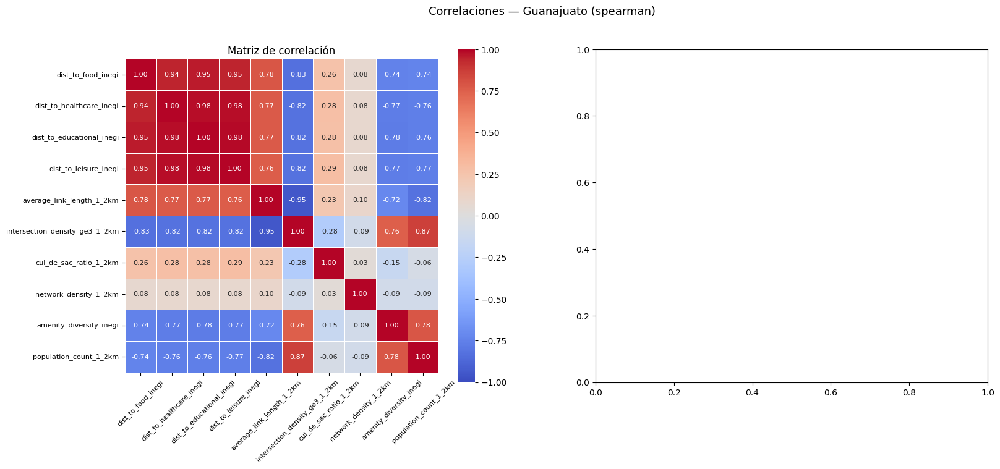

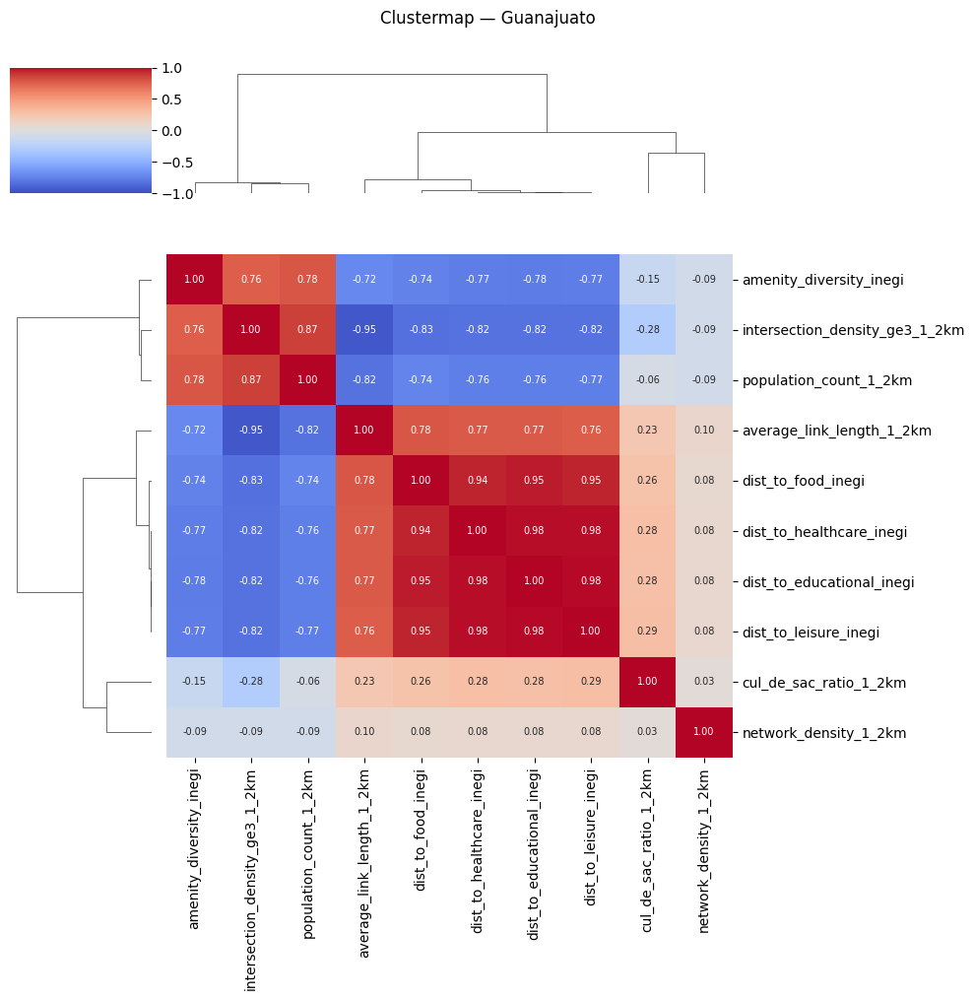


Correlaciones absolutas más altas (> 0.5):
                          var1                           var2      corr  abs_corr
     dist_to_educational_inegi          dist_to_leisure_inegi  0.984736  0.984736
      dist_to_healthcare_inegi      dist_to_educational_inegi  0.980946  0.980946
      dist_to_healthcare_inegi          dist_to_leisure_inegi  0.978418  0.978418
            dist_to_food_inegi      dist_to_educational_inegi  0.953303  0.953303
     average_link_length_1_2km intersection_density_ge3_1_2km -0.951615  0.951615
            dist_to_food_inegi          dist_to_leisure_inegi  0.945073  0.945073
            dist_to_food_inegi       dist_to_healthcare_inegi  0.944436  0.944436
intersection_density_ge3_1_2km         population_count_1_2km  0.865470  0.865470
            dist_to_food_inegi intersection_density_ge3_1_2km -0.834560  0.834560
      dist_to_healthcare_inegi intersection_density_ge3_1_2km -0.824585  0.824585
         dist_to_leisure_inegi intersection_density_ge

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

PATH_ATI = "Atitalaquia_grid_with_indicators_v4.gpkg"
PATH_GTO = "Guanajuato_grid_with_indicators_v4.gpkg"

# ── PARÁMETROS ──────────────────────────────────────────────
# Variables a incluir en el análisis
# Puedes quitar o agregar columnas aquí
FEATURES = [
    'dist_to_food_inegi',
    'dist_to_healthcare_inegi',
    'dist_to_educational_inegi',
    'dist_to_leisure_inegi',
    'average_link_length_1_2km',
    'intersection_density_ge3_1_2km',
    'cul_de_sac_ratio_1_2km',
    'network_density_1_2km',
    'amenity_diversity_inegi',
    'population_count_1_2km',
]

# Método de correlación: 'pearson' | 'spearman' | 'kendall'
# Spearman es más robusto si las distribuciones son sesgadas
METODO_CORR = 'spearman'

# Ciudad a graficar: cambia entre df_ati y df_gto
CIUDAD = 'Guanajuato'
# ────────────────────────────────────────────────────────────

gdf_ati = gpd.read_file(PATH_ATI)
gdf_gto = gpd.read_file(PATH_GTO)
df_ati = pd.DataFrame(gdf_ati.drop(columns='geometry'))
df_gto = pd.DataFrame(gdf_gto.drop(columns='geometry'))

datasets = {'Atitalaquia': df_ati, 'Guanajuato': df_gto}
df = datasets[CIUDAD]

X = df[FEATURES].fillna(df[FEATURES].median())
corr = X.corr(method=METODO_CORR)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle(f'Correlaciones — {CIUDAD} ({METODO_CORR})', fontsize=13)

# Heatmap completo
sns.heatmap(
    corr,
    ax=axes[0],
    annot=True, fmt='.2f',
    cmap='coolwarm', center=0,
    vmin=-1, vmax=1,
    square=True, linewidths=0.5,
    annot_kws={'size': 8}
)
axes[0].set_title('Matriz de correlación')
axes[0].tick_params(axis='x', rotation=45, labelsize=8)
axes[0].tick_params(axis='y', rotation=0, labelsize=8)

# Clustermap (agrupa variables similares)
# Útil para ver qué variables se comportan igual
clustergrid = sns.clustermap(
    corr,
    cmap='coolwarm', center=0,
    vmin=-1, vmax=1,
    annot=True, fmt='.2f',
    annot_kws={'size': 7},
    figsize=(10, 10),
)
clustergrid.fig.suptitle(f'Clustermap — {CIUDAD}', y=1.01, fontsize=12)

plt.tight_layout()
plt.show()

# También imprime las correlaciones más altas
print("\nCorrelaciones absolutas más altas (> 0.5):")
corr_pairs = (
    corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
    .stack()
    .reset_index()
)
corr_pairs.columns = ['var1', 'var2', 'corr']
corr_pairs['abs_corr'] = corr_pairs['corr'].abs()
altas = corr_pairs[corr_pairs['abs_corr'] > 0.5].sort_values('abs_corr', ascending=False)
print(altas.to_string(index=False))

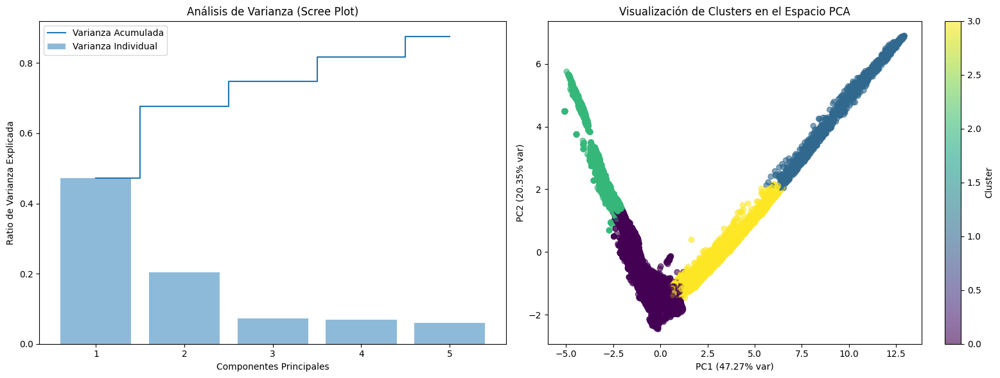


Variables con más peso en el Componente 1 (PC1):
                                PC1_Weight
intersection_density_ge3_1_2km    0.342065
population_count_1_2km            0.340831
educational_count_combined        0.329740
healthcare_count_combined         0.320635
leisure_count_combined            0.318000
food_count_combined               0.282501
amenity_diversity_inegi           0.271976
network_density_1_2km            -0.008965
info_gap                         -0.078349
cul_de_sac_ratio_1_2km           -0.085009
average_link_length_1_2km        -0.162940
dist_leisure_combined            -0.247609
dist_food_combined               -0.253715
dist_healthcare_combined         -0.259225
dist_educational_combined        -0.259836


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# ── 1. CARGA DE DATOS ─────────────────────────────────────────
PATH_ATI = "Atitalaquia_grid_with_indicators_v4.gpkg"
PATH_GTO = "Guanajuato_grid_with_indicators_v4.gpkg"

gdf_ati = gpd.read_file(PATH_ATI)
gdf_gto = gpd.read_file(PATH_GTO)

# Convertir a DataFrame y mantener copia de seguridad para mapeo
df_ati = pd.DataFrame(gdf_ati.drop(columns='geometry'))
df_gto = pd.DataFrame(gdf_gto.drop(columns='geometry'))

# ── 2. FUSIÓN LÓGICA Y FEATURE ENGINEERING (PUNTO 4) ──────────
def process_point_4(df):
    d = df.copy()
    categories = ['food', 'healthcare', 'educational', 'leisure']

    for cat in categories:
        # Distancias: Tomamos la mínima (el acceso más cercano real)
        # Nota: Si el nombre en tu base es dist_to_food y dist_to_food_inegi
        osm_col = f'dist_to_{cat}'
        inegi_col = f'dist_to_{cat}_inegi'
        d[f'dist_{cat}_combined'] = d[[osm_col, inegi_col]].min(axis=1)

        # Conteos: Tomamos el máximo (la fuente que detectó más actividad)
        osm_count = f'{cat}_osm_count_1_2km'
        inegi_count = f'{cat}_inegi_count_1_2km'
        d[f'{cat}_count_combined'] = d[[osm_count, inegi_count]].max(axis=1)

    # Cálculo del Info Gap (Brecha de visibilidad digital)
    dist_osm = [f'dist_to_{c}' for c in categories]
    dist_inegi = [f'dist_to_{c}_inegi' for c in categories]
    d['info_gap'] = (d[dist_osm].mean(axis=1) - d[dist_inegi].mean(axis=1)).abs()

    return d

df_ati_proc = process_point_4(df_ati)
df_gto_proc = process_point_4(df_gto)

# ── 3. SELECCIÓN DE VARIABLES PARA PCA ────────────────────────
# Elegimos las variables combinadas y las de morfología urbana
FEATURES_PCA = [
    'dist_food_combined', 'dist_healthcare_combined',
    'dist_educational_combined', 'dist_leisure_combined',
    'food_count_combined', 'healthcare_count_combined',
    'educational_count_combined', 'leisure_count_combined',
    'average_link_length_1_2km', 'intersection_density_ge3_1_2km',
    'cul_de_sac_ratio_1_2km', 'network_density_1_2km',
    'amenity_diversity_inegi', 'population_count_1_2km',
    'info_gap'
]

# Concatenamos para un análisis global (opcional)
# Si prefieres solo una ciudad, cambia 'df_total' por df_ati_proc o df_gto_proc
df_total = pd.concat([df_ati_proc, df_gto_proc], keys=['Atitalaquia', 'Guanajuato'])
X = df_total[FEATURES_PCA].fillna(df_total[FEATURES_PCA].median())

# ── 4. ESTANDARIZACIÓN Y PCA ──────────────────────────────────
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=0.85) # Conservar el 85% de la varianza
X_pca = pca.fit_transform(X_scaled)

# ── 5. CLUSTERING (K-MEANS) ───────────────────────────────────
# Usaremos 4 clusters como punto de partida (puedes ajustar este número)
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_pca)
df_total['cluster'] = clusters

# ── 6. VISUALIZACIÓN DE RESULTADOS ────────────────────────────
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Scree Plot (Varianza explicada)
exp_var_cum = np.cumsum(pca.explained_variance_ratio_)
ax1.bar(range(1, len(exp_var_cum)+1), pca.explained_variance_ratio_, alpha=0.5, label='Varianza Individual')
ax1.step(range(1, len(exp_var_cum)+1), exp_var_cum, where='mid', label='Varianza Acumulada')
ax1.set_ylabel('Ratio de Varianza Explicada')
ax1.set_xlabel('Componentes Principales')
ax1.set_title('Análisis de Varianza (Scree Plot)')
ax1.legend()

# Scatter Plot de Clusters en Espacio PCA
scatter = ax2.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='viridis', alpha=0.6)
ax2.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%} var)')
ax2.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%} var)')
ax2.set_title('Visualización de Clusters en el Espacio PCA')
plt.colorbar(scatter, ax=ax2, label='Cluster')

plt.tight_layout()
plt.show()

# Imprimir pesos de las variables en PC1
loadings = pd.DataFrame(pca.components_[0], index=FEATURES_PCA, columns=['PC1_Weight'])
print("\nVariables con más peso en el Componente 1 (PC1):")
print(loadings.sort_values(by='PC1_Weight', ascending=False))

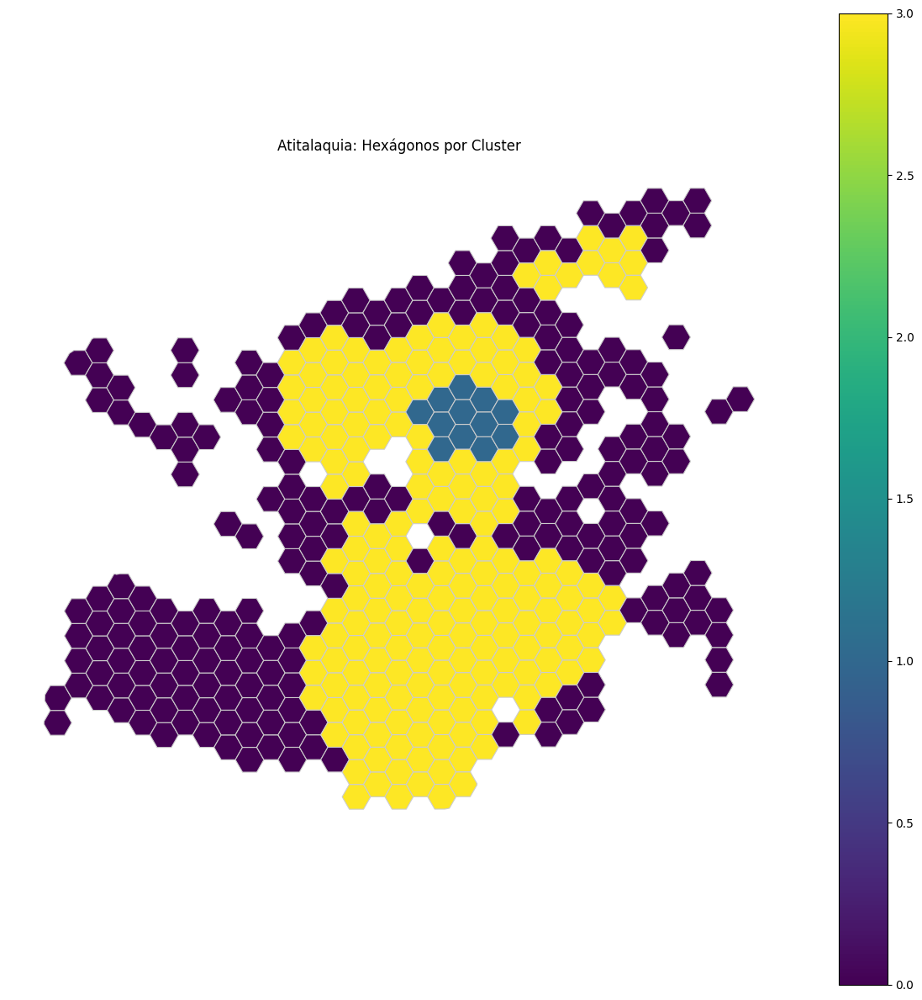

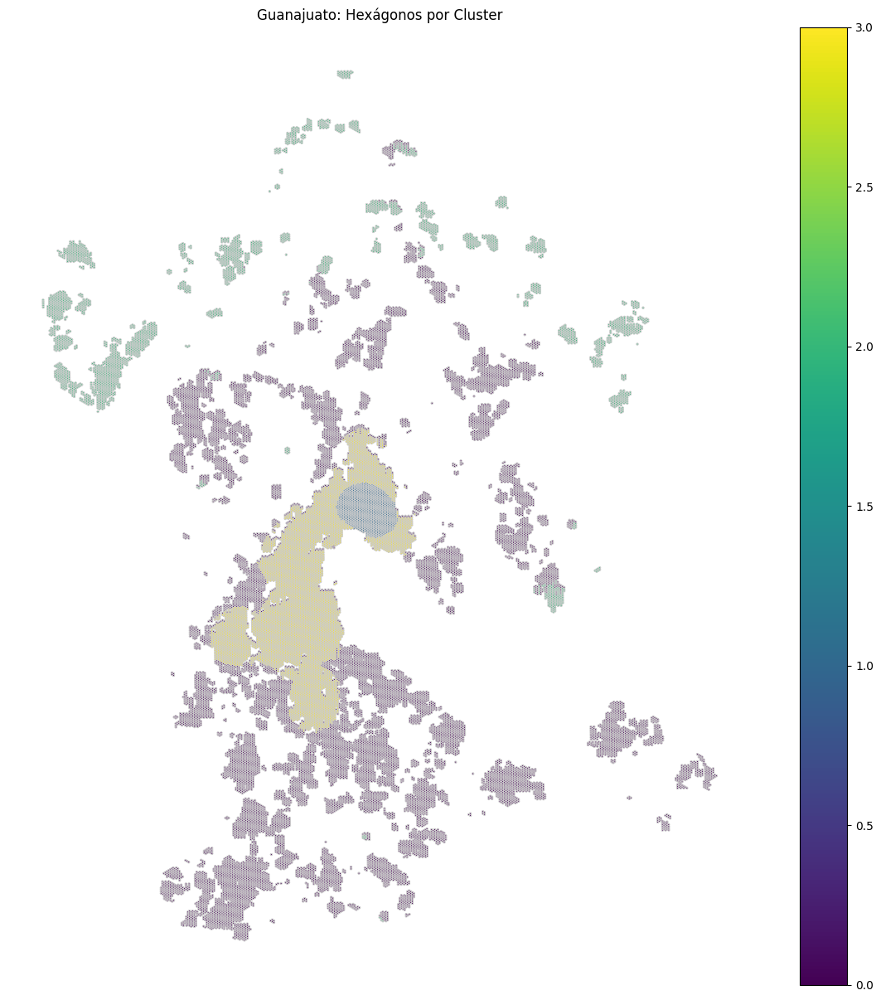

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

# Recuperar los índices originales para cada ciudad
df_ati_clusters = df_total.loc['Atitalaquia', ['cluster']]
df_gto_clusters = df_total.loc['Guanajuato', ['cluster']]

# Fusionar los clusters con los GeoDataFrames originales
gdf_ati_clustered = gdf_ati.merge(df_ati_clusters, left_index=True, right_index=True)
gdf_gto_clustered = gdf_gto.merge(df_gto_clusters, left_index=True, right_index=True)

# Visualización para Atitalaquia
fig, ax = plt.subplots(1, 1, figsize=(15, 15)) # Aumentar el tamaño de la figura
gdf_ati_clustered.plot(column='cluster', cmap='viridis', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Atitalaquia: Hexágonos por Cluster')
ax.set_axis_off()
plt.show()

# Visualización para Guanajuato
fig, ax = plt.subplots(1, 1, figsize=(15, 15)) # Aumentar el tamaño de la figura
gdf_gto_clustered.plot(column='cluster', cmap='viridis', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Guanajuato: Hexágonos por Cluster')
ax.set_axis_off()
plt.show()


--- Resumen Estadístico por Ciudad ---


=== Atitalaquia ===

Estadísticas para Walk Score y componentes:


,walk_score,accessibility_score,connectivity_score,confidence
count,422.0000,422.0000,422.0000,422.0000
mean,0.3802,0.3146,0.6354,0.8904
std,0.1906,0.2666,0.1471,0.0879
min,0.0655,0.0000,0.1992,0.7000
25%,0.2365,0.0265,0.5568,0.8565
50%,0.3584,0.3123,0.6477,0.9218
75%,0.5166,0.5159,0.7421,0.9613
max,0.8767,0.9398,0.8847,0.9995



Distribución de walk_category:


,proportion
walk_category,
Medio,38.15%
Bajo,28.2%
Alto,22.75%
Muy alto,10.9%



Distribución de confidence_flag:


,proportion
confidence_flag,
Alta,52.37%
Media,29.62%
Baja,18.01%



=== Guanajuato ===

Estadísticas para Walk Score y componentes:


,walk_score,accessibility_score,connectivity_score,confidence
count,29023.0000,29023.0000,29023.0000,29023.0000
mean,0.2884,0.1734,0.5609,0.9174
std,0.2202,0.2634,0.1710,0.0912
min,0.0000,0.0000,0.0000,0.7000
25%,0.1495,0.0000,0.4727,0.9127
50%,0.1823,0.0004,0.5447,0.9550
75%,0.3819,0.3301,0.6394,0.9821
max,0.9692,0.9942,0.9812,1.0000



Distribución de walk_category:


,proportion
walk_category,
Bajo,66.23%
Medio,12.3%
Muy alto,11.4%
Alto,10.07%



Distribución de confidence_flag:


,proportion
confidence_flag,
Alta,75.81%
Baja,13.7%
Media,10.5%



--- Visualizaciones --- 


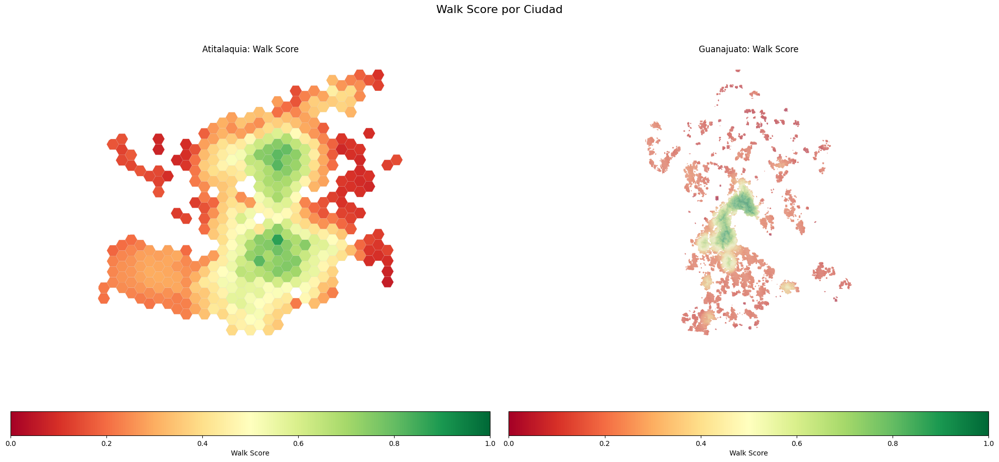

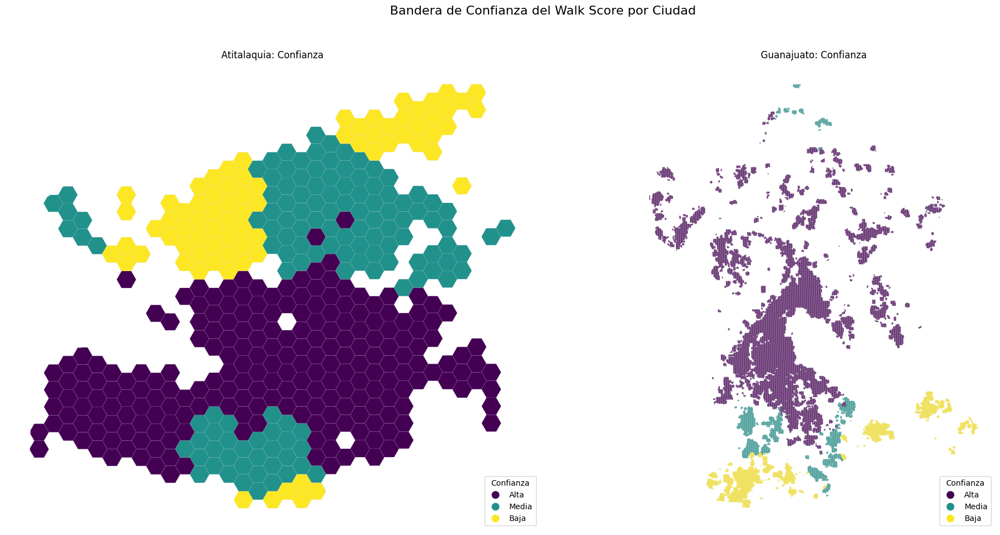

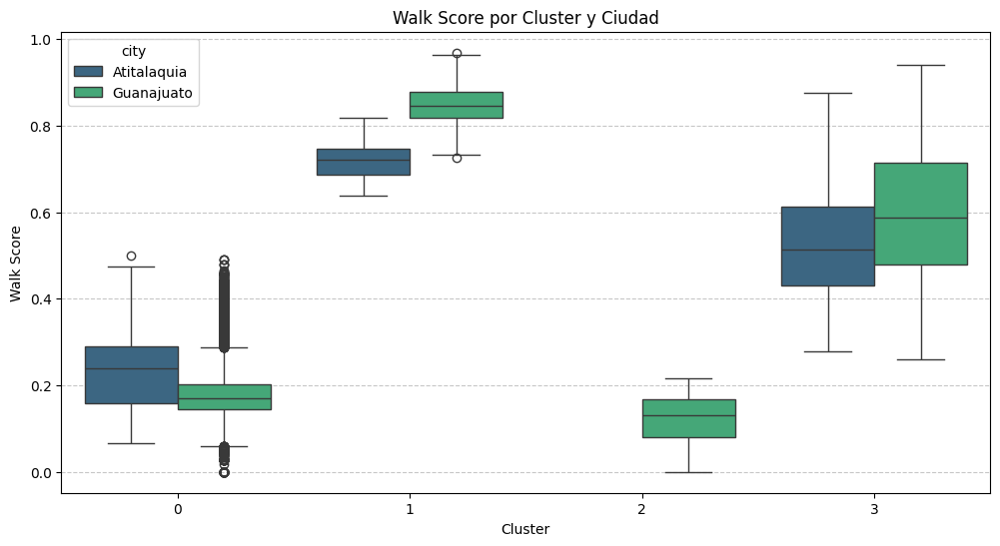

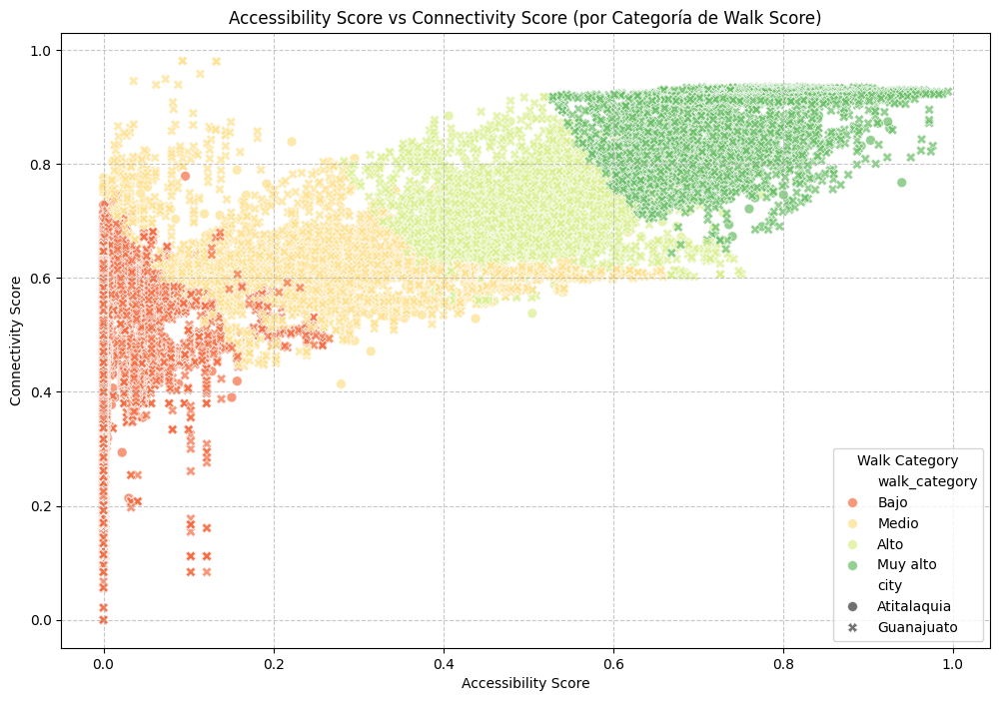


--- Mediana de Scores por Ciudad y Cluster ---



walk_score  accessibility_score  connectivity_score
city        cluster                                                     
Atitalaquia 0            0.2400               0.0337              0.5712
            1            0.7217               0.8141              0.8277
            3            0.5145               0.5132              0.6911
Guanajuato  0            0.1701               0.0000              0.5282
            1            0.8471               0.8122              0.9252
            2            0.1310               0.0000              0.3867
            3            0.5889               0.5355              0.7479

In [ ]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

# Asegurarse de que los GeoDataFrames originales están cargados y tienen la columna 'cluster'
# Se asume que gdf_ati y gdf_gto ya están cargados y df_total existe de pasos anteriores
# Primero, fusionamos los clusters con los GeoDataFrames originales si aún no están allí
if 'cluster' not in gdf_ati.columns:
    df_ati_clusters = df_total.loc['Atitalaquia', ['cluster']]
    gdf_ati = gdf_ati.merge(df_ati_clusters, left_index=True, right_index=True)
if 'cluster' not in gdf_gto.columns:
    df_gto_clusters = df_total.loc['Guanajuato', ['cluster']]
    gdf_gto = gdf_gto.merge(df_gto_clusters, left_index=True, right_index=True)

def compute_walk_score(gdf):
    # Crear una copia para evitar SettingWithCopyWarning y trabajar con un GDF modificado
    d = gdf.copy()

    # PASO 1 — Construir columnas combined si no existen
    categories = ['food', 'healthcare', 'educational', 'leisure']
    for cat in categories:
        osm_dist_col = f'dist_to_{cat}'
        inegi_dist_col = f'dist_to_{cat}_inegi'
        combined_dist_col = f'dist_{cat}_combined'

        osm_count_col = f'{cat}_osm_count_1_2km'
        inegi_count_col = f'{cat}_inegi_count_1_2km'
        combined_count_col = f'{cat}_count_combined'

        if combined_dist_col not in d.columns:
            d[combined_dist_col] = d[[osm_dist_col, inegi_dist_col]].min(axis=1)
        if combined_count_col not in d.columns:
            d[combined_count_col] = d[[osm_count_col, inegi_count_col]].max(axis=1)

    # Calcular info_gap si no existe
    if 'info_gap' not in d.columns:
        dist_osm_cols = [f'dist_to_{c}' for c in categories]
        dist_inegi_cols = [f'dist_to_{c}_inegi' for c in categories]
        d['info_gap'] = (d[dist_osm_cols].mean(axis=1) - d[dist_inegi_cols].mean(axis=1)).abs()

    # PASO 2 — Sub-score de accesibilidad por categoría
    accessibility_scores_per_category = []
    for cat in categories:
        dist_col = f'dist_{cat}_combined'
        count_col = f'{cat}_count_combined'

        # score_dist_X: decaimiento exponencial, umbral sensible ~400m
        d[f'score_dist_{cat}'] = np.exp(-d[dist_col] / 400)

        # score_count_X: saturación logarítmica, normalizada por percentil 95
        p95_count = d[count_col].quantile(0.95)
        d[f'score_count_{cat}'] = np.log1p(d[count_col]) / np.log1p(p95_count) if p95_count > 0 else 0
        d[f'score_count_{cat}'] = d[f'score_count_{cat}'].clip(0, 1) # Asegurar clip a [0,1]

        # score_access_X
        d[f'score_access_{cat}'] = 0.4 * d[f'score_dist_{cat}'] + 0.6 * d[f'score_count_{cat}']
        accessibility_scores_per_category.append(d[f'score_access_{cat}'])

    # Promedia los 4 para obtener accessibility_score
    d['accessibility_score'] = pd.concat(accessibility_scores_per_category, axis=1).mean(axis=1).clip(0, 1)

    # PASO 3 — Sub-score de conectividad de red vial
    # normalizar intersection_density
    p95_intersec = d['intersection_density_ge3_1_2km'].quantile(0.95)
    d['norm_intersec'] = (d['intersection_density_ge3_1_2km'] / p95_intersec).clip(0, 1) if p95_intersec > 0 else 0

    # normalizar average_link_length (link corto = bueno)
    p95_link = d['average_link_length_1_2km'].quantile(0.95)
    d['norm_link'] = (1 - (d['average_link_length_1_2km'] / p95_link)).clip(0, 1) if p95_link > 0 else 1

    # normalizar cul_de_sac_ratio (menos cul-de-sacs = bueno)
    d['norm_cul'] = (1 - d['cul_de_sac_ratio_1_2km']).clip(0, 1)

    d['connectivity_score'] = d[['norm_intersec', 'norm_link', 'norm_cul']].mean(axis=1).clip(0, 1)

    # PASO 4 — Factor de confianza
    p95_info_gap = d['info_gap'].quantile(0.95)
    d['gap_norm'] = (d['info_gap'] / p95_info_gap).clip(0, 1) if p95_info_gap > 0 else 0
    d['confidence'] = (1 - 0.3 * d['gap_norm']).clip(0, 1)

    # PASO 5 — Walk Score final
    d['walk_score_raw'] = 0.65 * d['accessibility_score'] + 0.35 * d['connectivity_score']
    d['walk_score'] = (d['walk_score_raw'] * d['confidence']).clip(0, 1)

    # PASO 6 — Categoría discreta
    d['walk_category'] = pd.cut(d['walk_score'],
                                bins=[0, 0.25, 0.45, 0.65, 1.01],
                                labels=['Bajo', 'Medio', 'Alto', 'Muy alto'],
                                right=False, include_lowest=True)
    d['confidence_flag'] = pd.cut(d['gap_norm'],
                                  bins=[0, 0.33, 0.66, 1.01],
                                  labels=['Alta', 'Media', 'Baja'],
                                  right=False, include_lowest=True)

    return d

# Aplicar la función a ambos GeoDataFrames
gdf_ati_ws = compute_walk_score(gdf_ati)
gdf_gto_ws = compute_walk_score(gdf_gto)

print("\n--- Resumen Estadístico por Ciudad ---\n")

for city_name, gdf_ws in [('Atitalaquia', gdf_ati_ws), ('Guanajuato', gdf_gto_ws)]:
    print(f"\n=== {city_name} ===")
    print("\nEstadísticas para Walk Score y componentes:")
    display(gdf_ws[['walk_score', 'accessibility_score', 'connectivity_score', 'confidence']].describe().round(4))

    print("\nDistribución de walk_category:")
    display(gdf_ws['walk_category'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%')

    print("\nDistribución de confidence_flag:")
    display(gdf_ws['confidence_flag'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%')


# --- Visualizaciones ---
print("\n--- Visualizaciones --- ")

# a) Mapa coroplético de walk_score para cada ciudad
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
fig.suptitle('Walk Score por Ciudad', fontsize=16)

gdf_ati_ws.plot(column='walk_score', cmap='RdYlGn', linewidth=0.1, ax=ax1, edgecolor='0.8', legend=True, vmin=0, vmax=1,
                legend_kwds={'label': "Walk Score", 'orientation': "horizontal"})
ax1.set_title('Atitalaquia: Walk Score')
ax1.set_axis_off()

gdf_gto_ws.plot(column='walk_score', cmap='RdYlGn', linewidth=0.1, ax=ax2, edgecolor='0.8', legend=True, vmin=0, vmax=1,
                legend_kwds={'label': "Walk Score", 'orientation': "horizontal"})
ax2.set_title('Guanajuato: Walk Score')
ax2.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# b) Mapa de confidence_flag para cada ciudad
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
fig.suptitle('Bandera de Confianza del Walk Score por Ciudad', fontsize=16)

gdf_ati_ws.plot(column='confidence_flag', cmap='viridis', categorical=True, linewidth=0.1, ax=ax1, edgecolor='0.8', legend=True,
                legend_kwds={'title': "Confianza", 'loc': 'lower right'})
ax1.set_title('Atitalaquia: Confianza')
ax1.set_axis_off()

gdf_gto_ws.plot(column='confidence_flag', cmap='viridis', categorical=True, linewidth=0.1, ax=ax2, edgecolor='0.8', legend=True,
                legend_kwds={'title': "Confianza", 'loc': 'lower right'})
ax2.set_title('Guanajuato: Confianza')
ax2.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# c) Boxplot de walk_score por cluster
# Se asume que la columna 'cluster' existe en gdf_ati_ws y gdf_gto_ws
df_combined_ws = pd.concat([gdf_ati_ws.assign(city='Atitalaquia'), gdf_gto_ws.assign(city='Guanajuato')])

if 'cluster' in df_combined_ws.columns:
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=df_combined_ws, x='cluster', y='walk_score', hue='city', palette='viridis')
    plt.title('Walk Score por Cluster y Ciudad')
    plt.xlabel('Cluster')
    plt.ylabel('Walk Score')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()
else:
    print("La columna 'cluster' no se encontró en los GeoDataFrames, se omite el boxplot por cluster.")

# d) Scatter plot: accessibility_score vs connectivity_score, coloreado por walk_category
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df_combined_ws, x='accessibility_score', y='connectivity_score', hue='walk_category',
                palette='RdYlGn', alpha=0.7, s=50, style='city') # s para tamaño de puntos
plt.title('Accessibility Score vs Connectivity Score (por Categoría de Walk Score)')
plt.xlabel('Accessibility Score')
plt.ylabel('Connectivity Score')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Walk Category')
plt.show()

# --- Tabla resumen con la mediana de walk_score, accessibility_score y connectivity_score agrupado por ciudad y cluster ---
print("\n--- Mediana de Scores por Ciudad y Cluster ---\n")
summary_table = df_combined_ws.groupby(['city', 'cluster'])[['walk_score', 'accessibility_score', 'connectivity_score']].median().round(4)
display(summary_table)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# --- Asegurar que los GeoDataFrames con el walk score existen y combinarlos ---
# Asumimos que gdf_ati_ws y gdf_gto_ws ya fueron creados en la ejecución anterior (celda 236d0162).
# Creamos una copia para no modificar los originales directamente para este paso.
gdf_ati_sub = gdf_ati_ws.copy()
gdf_gto_sub = gdf_gto_ws.copy()

# Combinar ambos GeoDataFrames para el análisis global, incluyendo la geometría
df_combined_geo = pd.concat([
    gdf_ati_sub.assign(city='Atitalaquia'),
    gdf_gto_sub.assign(city='Guanajuato')
])

print("Shape del GeoDataFrame combinado:", df_combined_geo.shape)

Shape del GeoDataFrame combinado: (29445, 67)


### PASO 1 — Sub-clasificar el Cluster 0

Vamos a filtrar los hexágonos pertenecientes al Cluster 0 de ambas ciudades, seleccionar las variables especificadas, normalizarlas y aplicar K-Means con k=2. Luego, asignaremos las etiquetas interpretativas '0A' y '0B' basadas en el `connectivity_score`.

In [ ]:
# 1. Filtrar hexágonos del Cluster 0
cluster_0_data = df_combined_geo[df_combined_geo['cluster'] == 0].copy()

# 2. Seleccionar características para la sub-clasificación
FEATURES_SUB_CLUSTER = [
    'connectivity_score',
    'accessibility_score',
    'average_link_length_1_2km',
    'intersection_density_ge3_1_2km',
    'population_count_1_2km'
]
X_sub = cluster_0_data[FEATURES_SUB_CLUSTER].copy()

# Imputar medianas para NaN si hubiera (aunque se procesó antes, por seguridad)
X_sub = X_sub.fillna(X_sub.median())

# 3. Normalizar las características
scaler_sub = StandardScaler()
X_sub_scaled = scaler_sub.fit_transform(X_sub)

# 4. Aplicar K-Means con k=2
kmeans_sub = KMeans(n_clusters=2, random_state=42, n_init=10) # n_init=10 para evitar warnings
sub_clusters = kmeans_sub.fit_predict(X_sub_scaled)

# Asignar los sub-clusters temporalmente al DataFrame original del Cluster 0
cluster_0_data['sub_cluster_id'] = sub_clusters

# 5. Etiquetar los sub-clusters (0A y 0B) basados en connectivity_score
# Determinamos qué sub-cluster tiene mayor mediana de connectivity_score
median_connectivity = cluster_0_data.groupby('sub_cluster_id')['connectivity_score'].median()

if median_connectivity.loc[0] > median_connectivity.loc[1]:
    # Sub-cluster 0 tiene mayor connectivity_score, es 0A
    cluster_0_data['subcluster'] = cluster_0_data['sub_cluster_id'].map({
        0: '0A — Red conectada sin servicios',
        1: '0B — Periferia desarticulada'
    })
else:
    # Sub-cluster 1 tiene mayor connectivity_score, es 0A
    cluster_0_data['subcluster'] = cluster_0_data['sub_cluster_id'].map({
        0: '0B — Periferia desarticulada',
        1: '0A — Red conectada sin servicios'
    })

# 6. Validar con silhouette score
silhouette_avg_sub = silhouette_score(X_sub_scaled, sub_clusters)
print(f"Silhouette score para la sub-clasificación del Cluster 0: {silhouette_avg_sub:.4f}")

# Almacenar la sub-clasificación en el df_combined_geo
df_combined_geo.loc[cluster_0_data.index, 'subcluster'] = cluster_0_data['subcluster']

Silhouette score para la sub-clasificación del Cluster 0: 0.5341


### PASO 2 — Evaluar si otros clusters necesitan sub-clasificación

Calculamos el coeficiente de variación (CV = std/mean) del `walk_score` para los clusters 1, 2 y 3. Si el CV es mayor a 0.35, se reporta que podría beneficiarse de una sub-clasificación.

In [ ]:
print("\n--- Evaluación de Clusters 1, 2, 3 para sub-clasificación ---")
for c_id in [1, 2, 3]:
    cluster_data = df_combined_geo[df_combined_geo['cluster'] == c_id]
    if not cluster_data.empty:
        mean_ws = cluster_data['walk_score'].mean()
        std_ws = cluster_data['walk_score'].std()
        if mean_ws > 0: # Evitar división por cero si la media es 0
            cv = std_ws / mean_ws
            print(f"  - Cluster {c_id}: CV(walk_score) = {cv:.4f}")
            if cv > 0.35:
                print(f"    → ¡Atención! El Cluster {c_id} tiene un CV alto y podría beneficiarse de sub-clasificación.")
        else:
            print(f"  - Cluster {c_id}: Media de walk_score es 0, CV no aplicable.")
    else:
        print(f"  - Cluster {c_id}: No hay datos para este cluster.")


--- Evaluación de Clusters 1, 2, 3 para sub-clasificación ---
  - Cluster 1: CV(walk_score) = 0.0597
  - Cluster 2: CV(walk_score) = 0.3952
    → ¡Atención! El Cluster 2 tiene un CV alto y podría beneficiarse de sub-clasificación.
  - Cluster 3: CV(walk_score) = 0.2412


### PASO 3 — Agregar columna 'subcluster' a los GeoDataFrames

Ahora vamos a asignar las etiquetas interpretativas a todos los clusters, incluyendo los sub-clusters de Cluster 0, y actualizaremos los GeoDataFrames originales de Atitalaquia y Guanajuato.

In [ ]:
# Asignar etiquetas a los clusters originales (1, 2, 3)
cluster_labels = {
    1: '1 — Núcleo urbano denso',
    2: '2 — Periferia rural extrema',
    3: '3 — Zona periurbana'
}

# Rellenar la columna 'subcluster' para los clusters 1, 2, 3
for c_id, label in cluster_labels.items():
    df_combined_geo.loc[df_combined_geo['cluster'] == c_id, 'subcluster'] = label

# Verificar que todos los 'subcluster' estén asignados
print("Conteo de valores en la nueva columna 'subcluster':")
display(df_combined_geo['subcluster'].value_counts())

# Actualizar los GeoDataFrames específicos de cada ciudad
gdf_ati_sub['subcluster'] = df_combined_geo.loc[df_combined_geo['city'] == 'Atitalaquia', 'subcluster']
gdf_gto_sub['subcluster'] = df_combined_geo.loc[df_combined_geo['city'] == 'Guanajuato', 'subcluster']

Conteo de valores en la nueva columna 'subcluster':


,count
subcluster,
0B — Periferia desarticulada,15302
3 — Zona periurbana,6749
2 — Periferia rural extrema,3480
0A — Red conectada sin servicios,3039
1 — Núcleo urbano denso,875


### PASO 4 — Visualizaciones

Se generarán las cuatro visualizaciones solicitadas: boxplot de walk_score por subcluster, scatter plot de connectivity vs accessibility, mapas coropléticos de subclusters para cada ciudad, y una tabla resumen.

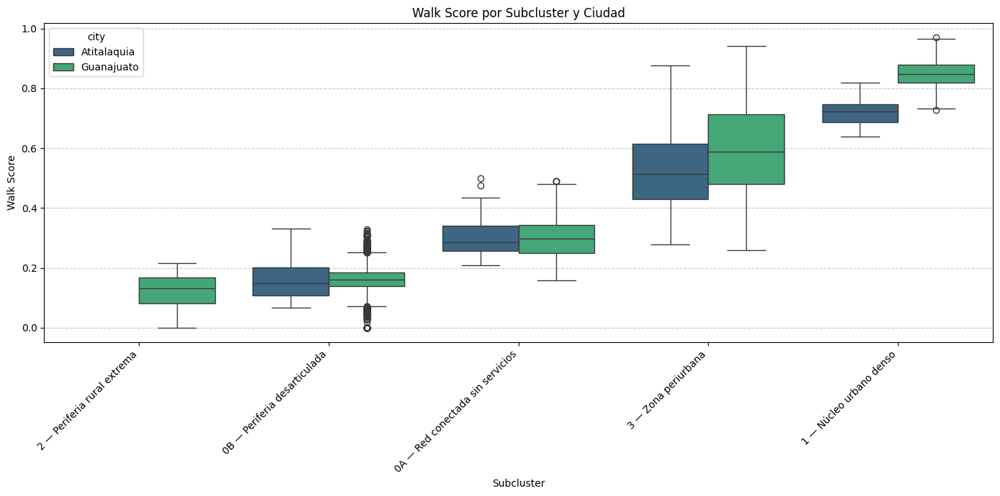

In [ ]:
# a) Boxplot de walk_score por subcluster (ambas ciudades en el mismo plot, hue=ciudad)
plt.figure(figsize=(14, 7))

# Ordenar los subclusters por la mediana del walk_score
order = df_combined_geo.groupby('subcluster')['walk_score'].median().sort_values().index

sns.boxplot(data=df_combined_geo, x='subcluster', y='walk_score', hue='city', palette='viridis', order=order)
plt.title('Walk Score por Subcluster y Ciudad')
plt.xlabel('Subcluster')
plt.ylabel('Walk Score')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

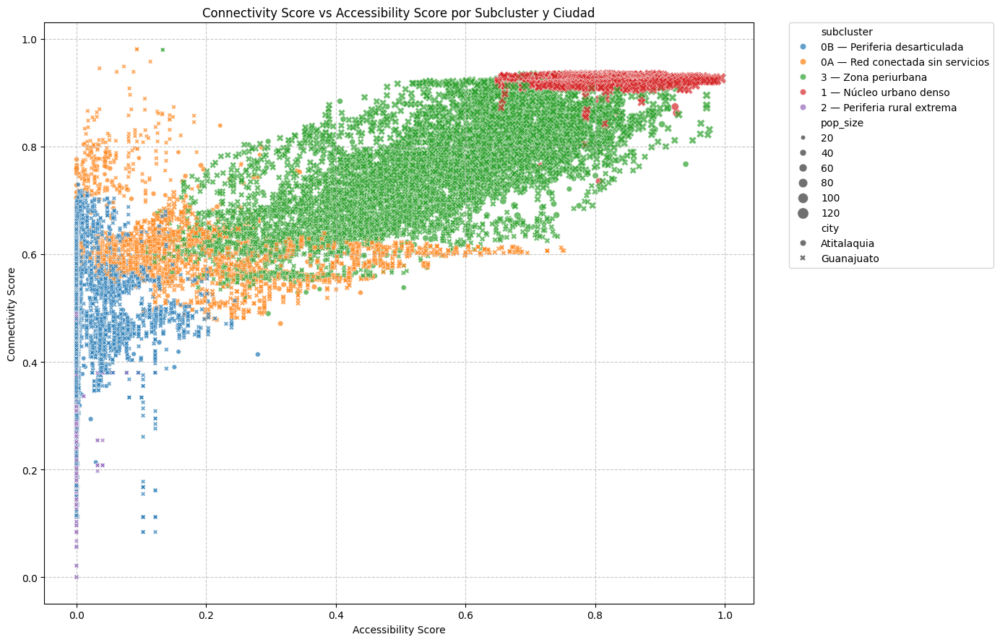

In [ ]:
# b) Scatter plot: connectivity_score vs accessibility_score
plt.figure(figsize=(14, 9))

# Normalizar population_count_1_2km para el tamaño de los puntos
min_pop = df_combined_geo['population_count_1_2km'].min()
max_pop = df_combined_geo['population_count_1_2km'].max()
df_combined_geo['pop_size'] = 20 + 100 * ((df_combined_geo['population_count_1_2km'] - min_pop) / (max_pop - min_pop))

sns.scatterplot(
    data=df_combined_geo,
    x='accessibility_score',
    y='connectivity_score',
    hue='subcluster',
    style='city',
    size='pop_size',
    sizes=(20, 120), # Rango de tamaño para los puntos
    alpha=0.7,
    palette='tab10' # Usar una paleta de colores discreta
)
plt.title('Connectivity Score vs Accessibility Score por Subcluster y Ciudad')
plt.xlabel('Accessibility Score')
plt.ylabel('Connectivity Score')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()
plt.show()

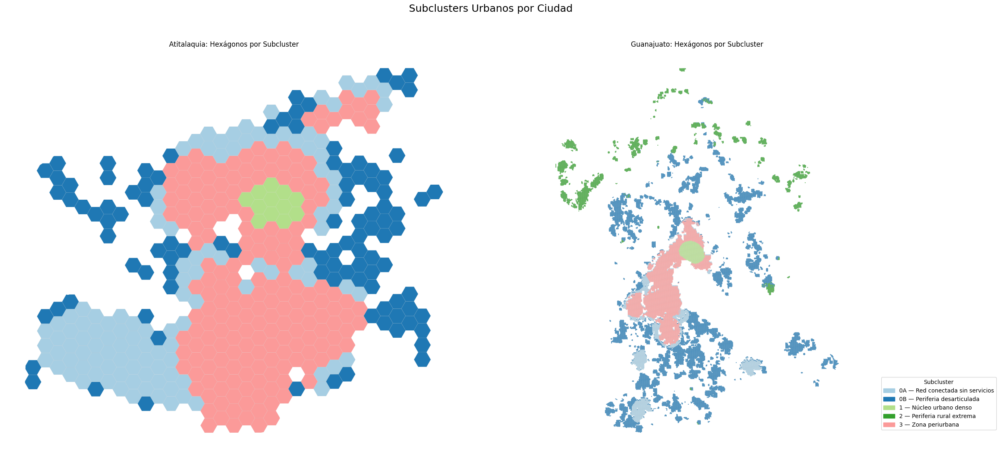

In [ ]:
# c) Mapa coroplético de subclusters para cada ciudad
# Definir una paleta de colores para los 5 subclusters
# Asegurarse de que el orden de los colores es consistente con el orden de las etiquetas
subcluster_labels_ordered = list(df_combined_geo['subcluster'].dropna().unique())
subcluster_labels_ordered.sort() # Ordenar alfabéticamente para consistencia o definir un orden manual si se prefiere

# Crear un mapeo de etiquetas a valores numéricos para el cmap discreto
label_to_int = {label: i for i, label in enumerate(subcluster_labels_ordered)}
df_combined_geo['subcluster_numeric'] = df_combined_geo['subcluster'].map(label_to_int)

# *** CORRECCIÓN: Propagar la columna 'subcluster_numeric' a los GeoDataFrames específicos de la ciudad ***
gdf_ati_sub['subcluster_numeric'] = df_combined_geo.loc[df_combined_geo['city'] == 'Atitalaquia', 'subcluster_numeric']
gdf_gto_sub['subcluster_numeric'] = df_combined_geo.loc[df_combined_geo['city'] == 'Guanajuato', 'subcluster_numeric']

# Asegurarse de que la leyenda se genere correctamente
from matplotlib.colors import ListedColormap
# Utilizar una paleta de 5 colores.
# 'tab10' tiene 10, podemos tomar los primeros 5 o definir una customizada.
cmap = ListedColormap(sns.color_palette("Paired", n_colors=5))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 12))
fig.suptitle('Subclusters Urbanos por Ciudad', fontsize=18)

# Atitalaquia
gdf_ati_sub.plot(column='subcluster_numeric', cmap=cmap, linewidth=0.1, ax=ax1, edgecolor='0.8', legend=False)
ax1.set_title('Atitalaquia: Hexágonos por Subcluster')
ax1.set_axis_off()

# Guanajuato
gdf_gto_sub.plot(column='subcluster_numeric', cmap=cmap, linewidth=0.1, ax=ax2, edgecolor='0.8', legend=False)
ax2.set_title('Guanajuato: Hexágonos por Subcluster')
ax2.set_axis_off()

# Crear una leyenda personalizada
handles = [plt.Rectangle((0,0),1,1, color=cmap(label_to_int[label])) for label in subcluster_labels_ordered]
fig.legend(handles, subcluster_labels_ordered, title="Subcluster", loc='lower right', bbox_to_anchor=(1, 0.1))

plt.tight_layout(rect=[0, 0.05, 0.95, 0.95]) # Ajustar layout para la leyenda
plt.show()

In [ ]:
# d) Tabla resumen: mediana de walk_score, accessibility_score, connectivity_score y population_count_1_2km
print("\n--- Mediana de Scores y Población por Ciudad y Subcluster ---")
summary_table_subcluster = df_combined_geo.groupby(['city', 'subcluster'])[
    ['walk_score', 'accessibility_score', 'connectivity_score', 'population_count_1_2km'] # *** CORRECCIÓN: Usar una lista de listas para seleccionar columnas ***
].median().round(4)
display(summary_table_subcluster)


--- Mediana de Scores y Población por Ciudad y Subcluster ---


walk_score  accessibility_score  \
city        subcluster                                                          
Atitalaquia 0A — Red conectada sin servicios      0.2862               0.1572   
            0B — Periferia desarticulada          0.1487               0.0028   
            1 — Núcleo urbano denso               0.7217               0.8141   
            3 — Zona periurbana                   0.5145               0.5132   
Guanajuato  0A — Red conectada sin servicios      0.2980               0.2103   
            0B — Periferia desarticulada          0.1611               0.0000   
            1 — Núcleo urbano denso               0.8471               0.8122   
            2 — Periferia rural extrema           0.1310               0.0000   
            3 — Zona periurbana                   0.5889               0.5355   

                                              connectivity_score  \
city        subcluster                                             
Atitalaquia 0A — Red conectada sin servicios              0.6793   
            0B — Periferia desarticulada                  0.4544   
            1 — Núcleo urbano denso                       0.8277   
            3 — Zona periurbana                           0.6911   
Guanajuato  0A — Red conectada sin servicios              0.6025   
            0B — Periferia desarticulada                  0.5161   
            1 — Núcleo urbano denso                       0.9252   
            2 — Periferia rural extrema                   0.3867   
            3 — Zona periurbana                           0.7479   

                                              population_count_1_2km  
city        subcluster                                                
Atitalaquia 0A — Red conectada sin servicios                  1790.0  
            0B — Periferia desarticulada                        49.5  
            1 — Núcleo urbano denso                          12343.0  
            3 — Zona periurbana                               4783.0  
Guanajuato  0A — Red conectada sin servicios                  2247.5  
            0B — Periferia desarticulada                       315.0  
            1 — Núcleo urbano denso                          27322.0  
            2 — Periferia rural extrema                         74.0  
            3 — Zona periurbana                               9523.0

### PASO 5 — Reporte textual

Aquí se presenta la información detallada sobre la sub-clasificación del Cluster 0 y su interpretación.

In [ ]:
report_text = "\n--- Reporte de Sub-clasificación del Cluster 0 ---\n"
report_text += f"Silhouette score de la sub-clasificación del Cluster 0: {silhouette_avg_sub:.4f}\n\n"

# Calcular tamaños y porcentajes
total_cluster_0 = len(cluster_0_data)
sub_cluster_counts = cluster_0_data['subcluster'].value_counts()

report_text += "Tamaño de cada sub-cluster (n y % del Cluster 0 total):\n"
for label, count in sub_cluster_counts.items():
    percentage = (count / total_cluster_0) * 100
    report_text += f"  - {label}: {count} celdas ({percentage:.2f}%)\n"

# Mediana de connectivity_score y accessibility_score por sub-cluster
median_scores_sub = cluster_0_data.groupby('subcluster')[['connectivity_score', 'accessibility_score']].median().round(4)
report_text += "\nMediana de connectivity_score y accessibility_score por sub-cluster:\n"
report_text += median_scores_sub.to_string()

# Interpretación
report_text += "\n\nInterpretación urbanística de los arquetipos del Cluster 0:\n"
report_text += "  - 0A — Red conectada sin servicios:\n"
report_text += "    Representa áreas con una buena estructura vial (alta conectividad) que facilita la movilidad interna, pero con una marcada escasez de servicios básicos (baja accesibilidad). A menudo son zonas residenciales con calles densas y cortas que, a pesar de su morfología eficiente, carecen de equipamiento urbano cercano.\n"
report_text += "  - 0B — Periferia desarticulada:\n"
report_text += "    Estas áreas se caracterizan por una infraestructura vial deficiente y dispersa (baja conectividad) y una ausencia casi total de servicios (baja accesibilidad). Son típicamente zonas periféricas o rurales con baja densidad poblacional, donde el acceso a cualquier tipo de equipamiento requiere grandes desplazamientos.\n"

print(report_text)


--- Reporte de Sub-clasificación del Cluster 0 ---
Silhouette score de la sub-clasificación del Cluster 0: 0.5341

Tamaño de cada sub-cluster (n y % del Cluster 0 total):
  - 0B — Periferia desarticulada: 15302 celdas (83.43%)
  - 0A — Red conectada sin servicios: 3039 celdas (16.57%)

Mediana de connectivity_score y accessibility_score por sub-cluster:
                                  connectivity_score  accessibility_score
subcluster                                                               
0A — Red conectada sin servicios              0.6032               0.2079
0B — Periferia desarticulada                  0.5159               0.0000

Interpretación urbanística de los arquetipos del Cluster 0:
  - 0A — Red conectada sin servicios:
    Representa áreas con una buena estructura vial (alta conectividad) que facilita la movilidad interna, pero con una marcada escasez de servicios básicos (baja accesibilidad). A menudo son zonas residenciales con calles densas y cortas que, a pes

### PASO 1 — Calcular tiempos de caminata por categoría

In [ ]:
# Velocidad peatonal estándar: 4.5 km/h = 75 metros/minuto.
PEDESTRIAN_SPEED_MPM = 75  # Metros por minuto

categories = ['food', 'healthcare', 'educational', 'leisure']

# Calcular tiempos de caminata para cada categoría
for cat in categories:
    dist_col = f'dist_{cat}_combined'
    walk_time_col = f'walk_time_{cat}'
    # Redondeado a 1 decimal
    df_combined_geo[walk_time_col] = (df_combined_geo[dist_col] / PEDESTRIAN_SPEED_MPM).round(1)

# walk_time_nearest: mínimo entre las 4 categorías
df_combined_geo['walk_time_nearest'] = df_combined_geo[[f'walk_time_{cat}' for cat in categories]].min(axis=1).round(1)

# walk_time_mean: promedio de las 4 categorías
df_combined_geo['walk_time_mean'] = df_combined_geo[[f'walk_time_{cat}' for cat in categories]].mean(axis=1).round(1)

print("Columnas de tiempo de caminata calculadas:")
display(df_combined_geo[[f'walk_time_{cat}' for cat in categories] + ['walk_time_nearest', 'walk_time_mean']].head())

Columnas de tiempo de caminata calculadas:


,walk_time_food,walk_time_healthcare,walk_time_educational,walk_time_leisure,walk_time_nearest,walk_time_mean
0,67.1,104.4,102.0,100.4,67.1,93.5
1,60.7,97.9,95.6,94.0,60.7,87.1
2,49.0,86.2,83.9,82.3,49.0,75.4
3,43.5,80.8,78.4,76.8,43.5,69.9
4,39.5,76.9,74.6,73.0,39.5,66.0


### PASO 2 — Categorías de accesibilidad temporal

In [ ]:
# Umbrales de accesibilidad temporal
def assign_time_category(walk_time):
    if walk_time < 5:       return "Muy accesible"
    elif walk_time < 10:    return "Accesible"
    elif walk_time < 20:    return "Moderado"
    elif walk_time < 45:    return "Poco accesible"
    else:                   return "No caminable"

# Orden para las categorías (para visualizaciones)
time_category_order = [
    "Muy accesible",
    "Accesible",
    "Moderado",
    "Poco accesible",
    "No caminable"
]

# Aplicar la categorización a todas las columnas de tiempo de caminata
walk_time_cols = [f'walk_time_{cat}' for cat in categories] + ['walk_time_nearest']

for col in walk_time_cols:
    timecat_col = col.replace('walk_time_', 'timecat_')
    df_combined_geo[timecat_col] = df_combined_geo[col].apply(assign_time_category)
    # Convertir a tipo categórico con el orden definido
    df_combined_geo[timecat_col] = pd.Categorical(df_combined_geo[timecat_col], categories=time_category_order, ordered=True)

print("Columnas de categoría de tiempo de caminata calculadas:")
display(df_combined_geo[[f'timecat_{cat}' for cat in categories] + ['timecat_nearest']].head())

Columnas de categoría de tiempo de caminata calculadas:


,timecat_food,timecat_healthcare,timecat_educational,timecat_leisure,timecat_nearest
0,No caminable,No caminable,No caminable,No caminable,No caminable
1,No caminable,No caminable,No caminable,No caminable,No caminable
2,No caminable,No caminable,No caminable,No caminable,No caminable
3,Poco accesible,No caminable,No caminable,No caminable,Poco accesible
4,Poco accesible,No caminable,No caminable,No caminable,Poco accesible


### PASO 3 — Índice de cobertura temporal (ICT)

In [ ]:
# Calcular ICT: número de categorías con walk_time_X <= 20 min

df_combined_geo['ICT'] = 0
for cat in categories:
    df_combined_geo['ICT'] += (df_combined_geo[f'walk_time_{cat}'] <= 20).astype(int)

# ICT_label
ict_label_map = {
    0: "Sin cobertura",
    1: "Cobertura baja",
    2: "Cobertura media",
    3: "Cobertura alta",
    4: "Cobertura total"
}

ict_label_order = [
    "Sin cobertura",
    "Cobertura baja",
    "Cobertura media",
    "Cobertura alta",
    "Cobertura total"
]

df_combined_geo['ICT_label'] = df_combined_geo['ICT'].map(ict_label_map)
# Convertir a tipo categórico con el orden definido
df_combined_geo['ICT_label'] = pd.Categorical(df_combined_geo['ICT_label'], categories=ict_label_order, ordered=True)

print("Columnas ICT e ICT_label calculadas:")
display(df_combined_geo[['ICT', 'ICT_label']].head())

Columnas ICT e ICT_label calculadas:


,ICT,ICT_label
0,0,Sin cobertura
1,0,Sin cobertura
2,0,Sin cobertura
3,0,Sin cobertura
4,0,Sin cobertura


### PASO 4 — Visualizaciones

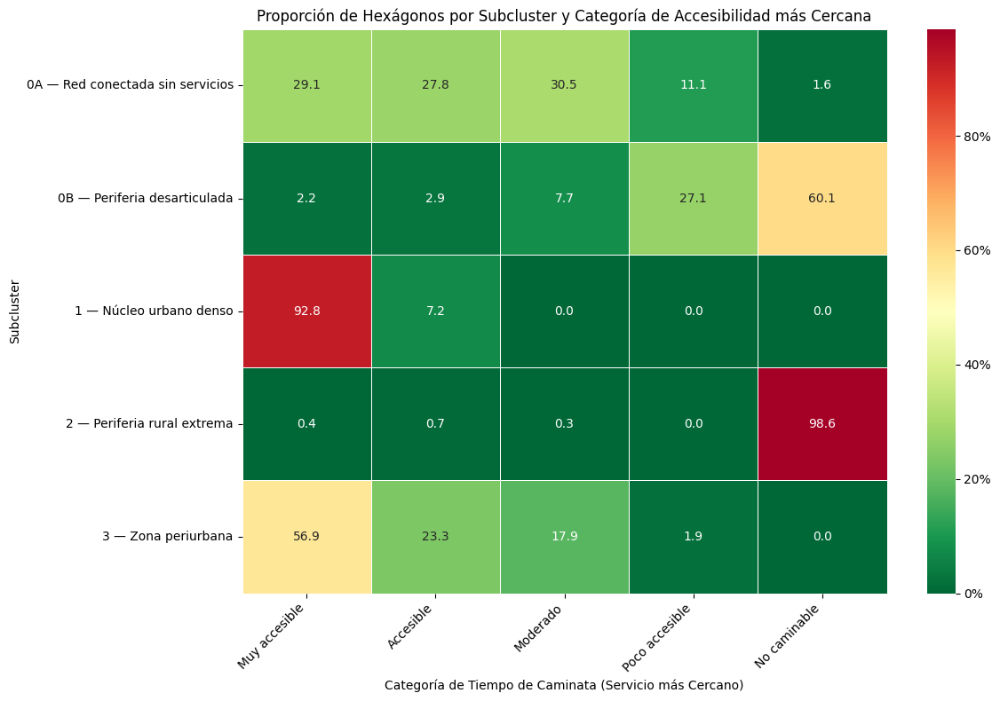

In [ ]:
# a) Heatmap de proporciones: filas = subcluster, columnas = timecat_nearest

# Calcular la tabla de contingencia y normalizar por fila
heatmap_data = pd.crosstab(df_combined_geo['subcluster'], df_combined_geo['timecat_nearest'], normalize='index')

# Asegurar que todas las columnas de time_category_order estén presentes, rellenando con 0 si es necesario
heatmap_data = heatmap_data.reindex(columns=time_category_order, fill_value=0)

plt.figure(figsize=(12, 8))
sns.heatmap(
    heatmap_data * 100, # Multiplicar por 100 para mostrar porcentajes
    annot=True,
    fmt=".1f", # Formato de una cifra decimal
    cmap='RdYlGn_r', # Invertir el cmap para que 'verde' sea 'Muy accesible'
    linewidths=.5,
    cbar_kws={'format': '%.0f%%'}
)
plt.title('Proporción de Hexágonos por Subcluster y Categoría de Accesibilidad más Cercana')
plt.xlabel('Categoría de Tiempo de Caminata (Servicio más Cercano)')
plt.ylabel('Subcluster')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

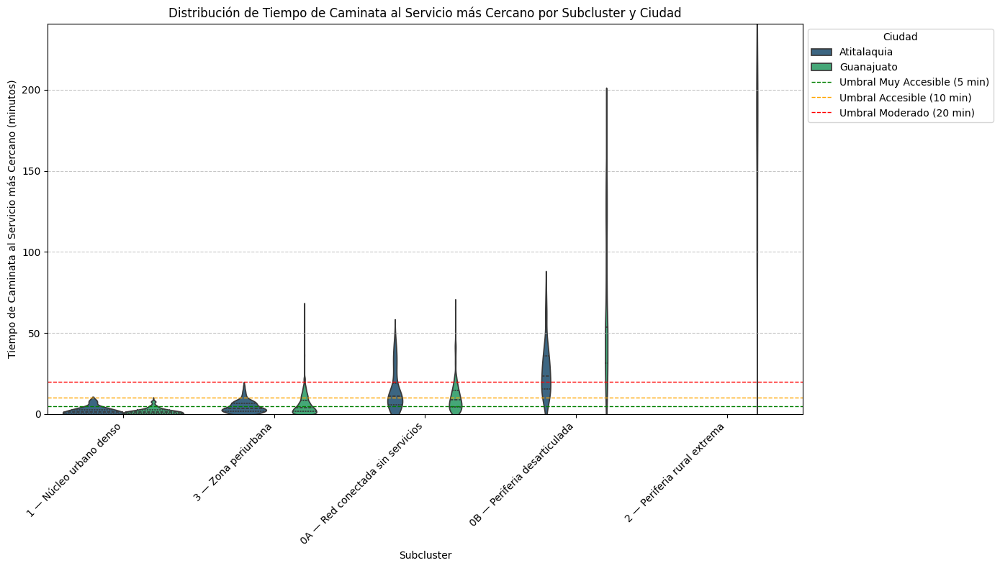

In [ ]:
# b) Violin plot de walk_time_nearest por subcluster (ambas ciudades, hue=ciudad).

plt.figure(figsize=(14, 8))

# Obtener el percentil 95 para el límite del eje Y
p95_walk_time_nearest = df_combined_geo['walk_time_nearest'].quantile(0.95)

# Ordenar los subclusters por la mediana de walk_time_nearest
order_violin = df_combined_geo.groupby('subcluster')['walk_time_nearest'].median().sort_values().index

sns.violinplot(
    data=df_combined_geo,
    x='subcluster',
    y='walk_time_nearest',
    hue='city',
    palette='viridis',
    inner='quartile', # Muestra cuartiles dentro del violin
    order=order_violin
)

plt.axhline(5, color='green', linestyle='--', linewidth=1, label='Umbral Muy Accesible (5 min)')
plt.axhline(10, color='orange', linestyle='--', linewidth=1, label='Umbral Accesible (10 min)')
plt.axhline(20, color='red', linestyle='--', linewidth=1, label='Umbral Moderado (20 min)')

plt.ylim(0, p95_walk_time_nearest * 1.05) # Limitar eje Y al p95 para mejor visualización
plt.title('Distribución de Tiempo de Caminata al Servicio más Cercano por Subcluster y Ciudad')
plt.xlabel('Subcluster')
plt.ylabel('Tiempo de Caminata al Servicio más Cercano (minutos)')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Ciudad', loc='upper left', bbox_to_anchor=(1,1))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

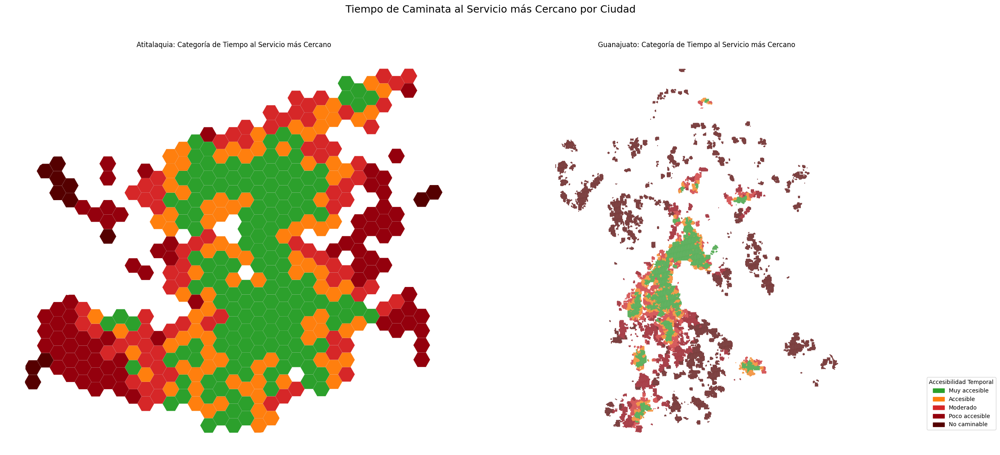

In [ ]:
# c) Para cada ciudad por separado: mapa coroplético de walk_time_nearest.

# Asegurarse de que los GeoDataFrames tienen la columna 'timecat_nearest'
gdf_ati_sub['timecat_nearest'] = df_combined_geo.loc[df_combined_geo['city'] == 'Atitalaquia', 'timecat_nearest']
gdf_gto_sub['timecat_nearest'] = df_combined_geo.loc[df_combined_geo['city'] == 'Guanajuato', 'timecat_nearest']

# Paleta de colores para las categorías (verde oscuro -> rojo oscuro)
cmap_categories = ['#2ca02c', '#ff7f0e', '#d62728', '#94000d', '#550000'] # Verde a rojo oscuro

# Mapeo de categorías a colores
category_colors = {cat: color for cat, color in zip(time_category_order, cmap_categories)}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 12))
fig.suptitle('Tiempo de Caminata al Servicio más Cercano por Ciudad', fontsize=18)

# Atitalaquia
gdf_ati_sub.plot(column='timecat_nearest', cmap=ListedColormap(cmap_categories), linewidth=0.1, ax=ax1, edgecolor='0.8', legend=False)
ax1.set_title('Atitalaquia: Categoría de Tiempo al Servicio más Cercano')
ax1.set_axis_off()

# Guanajuato
gdf_gto_sub.plot(column='timecat_nearest', cmap=ListedColormap(cmap_categories), linewidth=0.1, ax=ax2, edgecolor='0.8', legend=False)
ax2.set_title('Guanajuato: Categoría de Tiempo al Servicio más Cercano')
ax2.set_axis_off()

# Crear una leyenda personalizada
handles_categories = [plt.Rectangle((0,0),1,1, color=category_colors[label]) for label in time_category_order]
fig.legend(handles_categories, time_category_order, title="Accesibilidad Temporal", loc='lower right', bbox_to_anchor=(1, 0.1))

plt.tight_layout(rect=[0, 0.05, 0.95, 0.95])
plt.show()

<Figure size 1400x800 with 0 Axes>

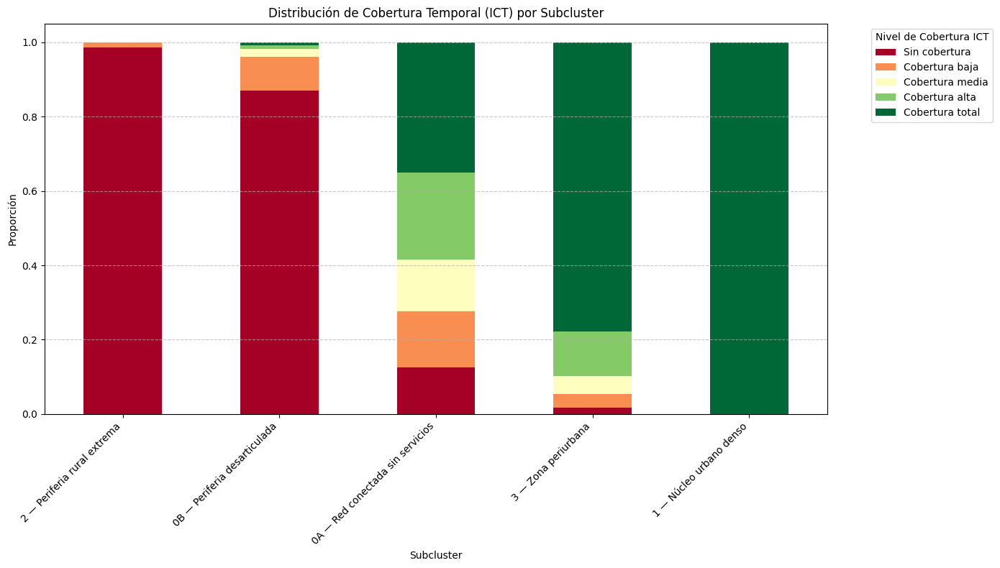

In [ ]:
# d) Stacked bar chart: distribución de ICT_label por subcluster.

# Calcular las proporciones de ICT_label por subcluster
ict_proportions = df_combined_geo.groupby('subcluster')['ICT_label'].value_counts(normalize=True).unstack(fill_value=0)

# Asegurar el orden de las columnas (ICT_label)
ict_proportions = ict_proportions[ict_label_order]

# Ordenar subclusters por ICT promedio (o ICT_label_numeric para una aproximación)
# Crear una versión numérica del ICT_label para ordenar y asegurar que sea numérica
df_combined_geo['ICT_label_numeric'] = df_combined_geo['ICT_label'].map({label: i for i, label in enumerate(ict_label_order)}).astype(int)
order_ict = df_combined_geo.groupby('subcluster')['ICT_label_numeric'].mean().sort_values().index

ict_proportions_ordered = ict_proportions.loc[order_ict]

plt.figure(figsize=(14, 8))
ict_proportions_ordered.plot(kind='bar', stacked=True, cmap='RdYlGn', figsize=(14,8))

plt.title('Distribución de Cobertura Temporal (ICT) por Subcluster')
plt.xlabel('Subcluster')
plt.ylabel('Proporción')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Nivel de Cobertura ICT', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### PASO 5 — Tabla resumen por subcluster y ciudad

In [ ]:
print("\n--- Mediana de Tiempos de Caminata y Distribución de ICT por Ciudad y Subcluster ---")

# Mediana de tiempos de caminata
median_walk_times = df_combined_geo.groupby(['city', 'subcluster'])[
    ['walk_time_food', 'walk_time_healthcare', 'walk_time_educational', 'walk_time_leisure', 'walk_time_nearest']
].median().round(1)

# Distribución porcentual de ICT_label
ict_dist_perc = df_combined_geo.groupby(['city', 'subcluster'])['ICT_label'].value_counts(normalize=True).unstack(fill_value=0)
ict_dist_perc = ict_dist_perc[ict_label_order] * 100 # Multiplicar por 100 para porcentajes
ict_dist_perc = ict_dist_perc.round(1)

# Unir ambas tablas para el resumen
summary_table_final = pd.concat([median_walk_times, ict_dist_perc], axis=1)

display(summary_table_final)


--- Mediana de Tiempos de Caminata y Distribución de ICT por Ciudad y Subcluster ---


walk_time_food  \
city        subcluster                                         
Atitalaquia 0A — Red conectada sin servicios            11.6   
            0B — Periferia desarticulada                24.6   
            1 — Núcleo urbano denso                      2.0   
            3 — Zona periurbana                          4.6   
Guanajuato  0A — Red conectada sin servicios            20.3   
            0B — Periferia desarticulada                76.4   
            1 — Núcleo urbano denso                      3.7   
            2 — Periferia rural extrema                244.4   
            3 — Zona periurbana                          8.9   
Atitalaquia 2 — Periferia rural extrema                  NaN   

                                              walk_time_healthcare  \
city        subcluster                                               
Atitalaquia 0A — Red conectada sin servicios                  26.2   
            0B — Periferia desarticulada                      33.5   
            1 — Núcleo urbano denso                            3.9   
            3 — Zona periurbana                                9.6   
Guanajuato  0A — Red conectada sin servicios                  19.9   
            0B — Periferia desarticulada                      77.1   
            1 — Núcleo urbano denso                            6.2   
            2 — Periferia rural extrema                      339.1   
            3 — Zona periurbana                               12.1   
Atitalaquia 2 — Periferia rural extrema                        NaN   

                                              walk_time_educational  \
city        subcluster                                                
Atitalaquia 0A — Red conectada sin servicios                   21.4   
            0B — Periferia desarticulada                       29.2   
            1 — Núcleo urbano denso                             3.8   
            3 — Zona periurbana                                 7.0   
Guanajuato  0A — Red conectada sin servicios                   12.4   
            0B — Periferia desarticulada                       68.3   
            1 — Núcleo urbano denso                             3.0   
            2 — Periferia rural extrema                       304.9   
            3 — Zona periurbana                                 7.7   
Atitalaquia 2 — Periferia rural extrema                         NaN   

                                              walk_time_leisure  \
city        subcluster                                            
Atitalaquia 0A — Red conectada sin servicios               25.4   
            0B — Periferia desarticulada                   28.2   
            1 — Núcleo urbano denso                         5.4   
            3 — Zona periurbana                             7.4   
Guanajuato  0A — Red conectada sin servicios                9.5   
            0B — Periferia desarticulada                   60.3   
            1 — Núcleo urbano denso                         1.8   
            2 — Periferia rural extrema                   296.1   
            3 — Zona periurbana                             5.3   
Atitalaquia 2 — Periferia rural extrema                     NaN   

                                              walk_time_nearest  \
city        subcluster                                            
Atitalaquia 0A — Red conectada sin servicios               10.9   
            0B — Periferia desarticulada                   23.4   
            1 — Núcleo urbano denso                         1.1   
            3 — Zona periurbana                             3.5   
Guanajuato  0A — Red conectada sin servicios                8.7   
            0B — Periferia desarticulada                   53.6   
            1 — Núcleo urbano denso                         1.4   
            2 — Periferia rural extrema                   204.7   
            3 — Zona periurbana                             4.0   
Atitalaquia 2 — Periferia rural extrema  

### PASO 0 — Configuración inicial y aseguramiento de modelos PCA y K-Means

Aquí nos aseguramos de que `scaler`, `pca` y `kmeans` estén disponibles en el entorno. Si no lo están, se volverán a entrenar con los datos combinados de ambas ciudades y las `FEATURES` especificadas.

In [ ]:
import pandas as pd
import numpy as np
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import euclidean_distances
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap

# --- Definición de FEATURES (debe coincidir con el entrenamiento original del PCA) ---
FEATURES = [
    'dist_food_combined', 'dist_healthcare_combined', 'dist_educational_combined',
    'dist_leisure_combined', 'food_count_combined', 'healthcare_count_combined',
    'educational_count_combined', 'leisure_count_combined',
    'average_link_length_1_2km', 'intersection_density_ge3_1_2km',
    'cul_de_sac_ratio_1_2km', 'network_density_1_2km',
    'amenity_diversity_inegi', 'population_count_1_2km', 'info_gap'
]

# --- Funciones para asegurar modelos ---
def train_pca_kmeans(df, features_list, n_components_ratio=0.85, n_clusters_kmeans=4, random_state=42):
    # Imputación de medianas para nulos
    X_data = df[features_list].fillna(df[features_list].median())

    # Estandarización
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_data)

    # PCA
    pca = PCA(n_components=n_components_ratio, random_state=random_state)
    X_pca = pca.fit_transform(X_scaled)

    # K-Means
    kmeans = KMeans(n_clusters=n_clusters_kmeans, random_state=random_state, n_init=10)
    clusters = kmeans.fit_predict(X_pca)

    df['cluster'] = clusters
    return scaler, pca, kmeans, X_data, X_scaled, X_pca, clusters

# --- Re-entrenar si los modelos no existen o están vacíos ---
# Asumiendo que df_combined_geo ya existe y contiene los datos necesarios
# Si df_combined_geo no tiene 'cluster', o si las variables de modelo no existen,
# re-entrenamos.

# Crear una copia combinada para el entrenamiento si df_total no es df_combined_geo
# Para evitar problemas con el MultiIndex, es mejor trabajar con una copia plana si se re-entrena.
# Check if key global variables (scaler, pca, kmeans, X_pca, clusters) exist and are not None
# `clusters` here refers to the global variable, not necessarily df_combined_geo['cluster'] directly
if 'cluster' not in df_combined_geo.columns or \
   'scaler' not in globals() or globals().get('scaler') is None or \
   'pca' not in globals() or globals().get('pca') is None or \
   'kmeans' not in globals() or globals().get('kmeans') is None or \
   'X_pca' not in globals() or globals().get('X_pca') is None or \
   'clusters' not in globals() or globals().get('clusters') is None:

    print("Modelos PCA/K-Means no encontrados o incompletos. Re-entrenando...")
    # Asegurar que el dataframe para el entrenamiento sea solo numérico y sin índice multi-nivel temporalmente
    temp_df_for_training = pd.DataFrame(df_combined_geo[FEATURES].copy())
    # These variables will be assigned if retraining happens
    scaler, pca, kmeans, X_data_trained, X_scaled_trained, X_pca, clusters = train_pca_kmeans(temp_df_for_training, FEATURES)
    df_combined_geo['cluster'] = clusters # Actualizar la columna 'cluster' en el GDF combinado
    print("Re-entrenamiento completado.")
else:
    print("Modelos PCA/K-Means ya existen y están listos.")
    # If models already exist globally, ensure df_combined_geo['cluster'] is consistent
    if 'cluster' not in df_combined_geo.columns and 'clusters' in globals():
        df_combined_geo['cluster'] = globals()['clusters']

# Calculate centroides de clusters en espacio PCA
# Use the globally available X_pca and the cluster assignments from df_combined_geo
cluster_pca_centroids = pd.DataFrame(X_pca).groupby(df_combined_geo['cluster'].values).mean().values


Modelos PCA/K-Means ya existen y están listos.


### PASO 1 — Definir hexágonos candidatos

In [ ]:
# Filtrar candidatos
candidatos_primarios = df_combined_geo[df_combined_geo['subcluster'] == "0A — Red conectada sin servicios"]
candidatos_secundarios = df_combined_geo[(df_combined_geo['subcluster'] == "0B — Periferia desarticulada") & (df_combined_geo['ICT'] >= 1)]

df_candidatos = pd.concat([candidatos_primarios, candidatos_secundarios])
print(f"Total de hexágonos candidatos: {len(df_candidatos)}")

Total de hexágonos candidatos: 5019


### PASO 2 — Calcular distancia al cluster objetivo en espacio PCA

In [ ]:
def calculate_pca_distances(df_subset, scaler_model, pca_model, pca_centroids, original_clusters):
    # Preprocesar los datos del subset
    X_subset = df_subset[FEATURES].fillna(df_subset[FEATURES].median())
    X_subset_scaled = scaler_model.transform(X_subset)
    X_subset_pca = pca_model.transform(X_subset_scaled)

    # Encontrar los centroides correctos para los clusters objetivo (1 y 3)
    # Asumimos que `pca_centroids` es un array donde el índice corresponde al cluster ID
    # (esto requiere que los cluster IDs sean 0, 1, 2, 3)
    centroid_cluster1 = pca_centroids[1]
    centroid_cluster3 = pca_centroids[3]

    # Calcular distancias
    dist_to_cluster1 = euclidean_distances(X_subset_pca, centroid_cluster1.reshape(1, -1)).flatten()
    dist_to_cluster3 = euclidean_distances(X_subset_pca, centroid_cluster3.reshape(1, -1)).flatten()

    # Determinar el cluster objetivo más cercano
    cluster_objetivo = np.where(dist_to_cluster1 < dist_to_cluster3, 1, 3)
    dist_to_cluster_objetivo = np.where(dist_to_cluster1 < dist_to_cluster3, dist_to_cluster1, dist_to_cluster3)

    df_subset = df_subset.copy()
    df_subset['dist_to_cluster1'] = dist_to_cluster1
    df_subset['dist_to_cluster3'] = dist_to_cluster3
    df_subset['cluster_objetivo'] = cluster_objetivo
    df_subset['dist_to_cluster_objetivo'] = dist_to_cluster_objetivo

    return df_subset

df_candidatos = calculate_pca_distances(df_candidatos, scaler, pca, cluster_pca_centroids, df_combined_geo['cluster'])

### PASO 3 — Análisis de sensibilidad por variable y PASO 4 — Clasificar tipo de intervención

In [ ]:
def get_top_interventions(row, scaler_model, pca_model, pca_centroids, features_list):
    original_features = row[features_list].fillna(row[features_list].median()).values.reshape(1, -1)
    original_pca = pca_model.transform(scaler_model.transform(original_features))

    target_cluster_id = row['cluster_objetivo']
    target_centroid = pca_centroids[target_cluster_id]

    original_distance = euclidean_distances(original_pca, target_centroid.reshape(1, -1)).flatten()[0]

    deltas = {}
    modified_data_points = [] # Para almacenar las features modificadas

    for feature in features_list:
        modified_features = original_features.copy()
        feature_idx = features_list.index(feature)

        # Aplicar modificación según el tipo de variable
        if 'dist_' in feature and '_combined' in feature:
            # Reducir distancia en un 30%
            modified_features[0, feature_idx] *= 0.7
        elif '_count_combined' in feature and 'count' in feature:
            # Aumentar en +5 unidades
            modified_features[0, feature_idx] += 5
        elif feature == 'amenity_diversity_inegi':
            # Aumentar en +0.2
            modified_features[0, feature_idx] += 0.2
        else:
            # Variables de red vial, población, info_gap no se modifican
            continue

        modified_pca = pca_model.transform(scaler_model.transform(modified_features))
        new_distance = euclidean_distances(modified_pca, target_centroid.reshape(1, -1)).flatten()[0]
        deltas[feature] = original_distance - new_distance

    # Ordenar por delta y obtener el top-3
    top_deltas = sorted(deltas.items(), key=lambda item: item[1], reverse=True)[:3]

    interventions = []
    for feat, delta_val in top_deltas:
        intervention_type = ""
        if 'dist_food_combined' == feat: intervention_type = "Añadir servicio de alimentación"
        elif 'dist_healthcare_combined' == feat: intervention_type = "Añadir servicio de salud"
        elif 'dist_educational_combined' == feat: intervention_type = "Añadir equipamiento educativo"
        elif 'dist_leisure_combined' == feat: intervention_type = "Añadir espacio de ocio/recreación"
        elif '_count_combined' in feat: intervention_type = f"Incrementar densidad de {feat.replace('_count_combined', '').replace('_', ' ')}"
        elif 'amenity_diversity_inegi' == feat: intervention_type = "Diversificar tipos de amenidades"
        else: intervention_type = "No identificada"
        interventions.append({'variable': feat, 'delta': delta_val, 'type': intervention_type})

    return interventions

# Aplicar a cada candidato
# Esto puede tardar, se recomienda probar con un subset si hay muchos hexágonos
# df_candidatos['interventions'] = df_candidatos.apply(lambda row: get_top_interventions(row, scaler, pca, cluster_pca_centroids, FEATURES), axis=1)

# Optimización para evitar aplicar .apply() en un DataFrame grande directamente
# Se puede paralelizar o vectorizar si es posible, pero para la demostración, aplicaremos así.
# Podríamos pre-calcular X_scaled y X_pca para los candidatos y pasarlos.

# Nota: para evitar re-calcular scaler.transform y pca.transform en cada iteración,
# podríamos pre-calcular X_scaled_candidatos y X_pca_candidatos una vez y luego usarlo.
# Sin embargo, get_top_interventions necesita transformar `modified_features` que son diferentes para cada simulación.
# La solución actual es más directa, aunque más lenta para DataFrames muy grandes.

# Vamos a ejecutarlo y almacenar los resultados en una lista de diccionarios
results = []
for index, row in df_candidatos.iterrows():
    interventions = get_top_interventions(row, scaler, pca, cluster_pca_centroids, FEATURES)
    results.append({
        'index': index,
        'interv_top1_var': interventions[0]['variable'] if interventions else None,
        'interv_top1_delta': interventions[0]['delta'] if interventions else None,
        'interv_top1_type': interventions[0]['type'] if interventions else None,
        'interv_top2_var': interventions[1]['variable'] if len(interventions) > 1 else None,
        'interv_top2_delta': interventions[1]['delta'] if len(interventions) > 1 else None,
        'interv_top2_type': interventions[1]['type'] if len(interventions) > 1 else None,
        'interv_top3_var': interventions[2]['variable'] if len(interventions) > 2 else None,
        'interv_top3_delta': interventions[2]['delta'] if len(interventions) > 2 else None,
        'interv_top3_type': interventions[2]['type'] if len(interventions) > 2 else None,
    })

interventions_df = pd.DataFrame(results).set_index('index')
df_candidatos = df_candidatos.merge(interventions_df, left_index=True, right_index=True)

Se truncaron las últimas líneas 5000 del resultado de transmisión.
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/tmp/ipykernel_947/1047725470.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  original_features = row[features_list].fillna(row[features_li

### PASO 5 — Score de viabilidad de salto de cluster

In [ ]:
# Calcular dist_max_en_candidatos
dist_max_en_candidatos = df_candidatos['dist_to_cluster_objetivo'].max()

df_candidatos['viability_score'] = 1 - (df_candidatos['dist_to_cluster_objetivo'] / dist_max_en_candidatos)

def assign_viability_label(score):
    if score >= 0.7: return "Alto potencial"
    elif score >= 0.4: return "Potencial medio"
    else: return "Requiere intervención mayor"

df_candidatos['viability_label'] = df_candidatos['viability_score'].apply(assign_viability_label)

print("Primeros hexágonos candidatos con scores de viabilidad:")
display(df_candidatos[['subcluster', 'cluster_objetivo', 'dist_to_cluster_objetivo', 'viability_score', 'viability_label', 'interv_top1_type']].head())

Primeros hexágonos candidatos con scores de viabilidad:


,subcluster,cluster_objetivo,dist_to_cluster_objetivo,viability_score,viability_label,interv_top1_type
2,0A — Red conectada sin servicios,3,4.599286,0.342713,Requiere intervención mayor,Incrementar densidad de healthcare
3,0A — Red conectada sin servicios,3,4.772594,0.317946,Requiere intervención mayor,Incrementar densidad de healthcare
4,0A — Red conectada sin servicios,3,4.659073,0.334169,Requiere intervención mayor,Incrementar densidad de healthcare
7,0A — Red conectada sin servicios,3,4.803890,0.313473,Requiere intervención mayor,Incrementar densidad de healthcare
8,0A — Red conectada sin servicios,3,5.350726,0.235324,Requiere intervención mayor,Incrementar densidad de healthcare


### PASO 6 — Visualizaciones

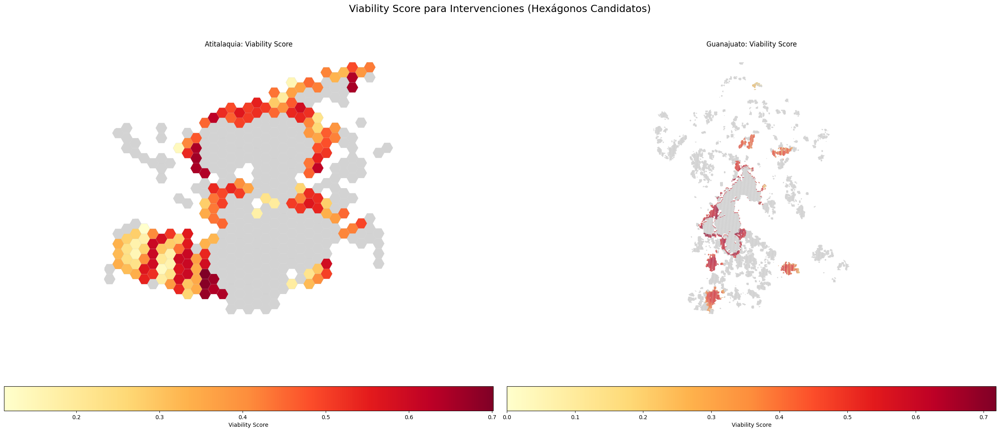

In [ ]:
# a) Mapa coroplético de viability_score para cada ciudad.

# Crear un GeoDataFrame combinado para facilitar el trazado del fondo
df_combined_geo_base = df_combined_geo[['geometry', 'city']].copy()
df_combined_geo_base['is_candidate'] = df_combined_geo_base.index.isin(df_candidatos.index)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 12))
fig.suptitle('Viability Score para Intervenciones (Hexágonos Candidatos)', fontsize=18)

# Atitalaquia
ax1.set_title('Atitalaquia: Viability Score')
df_combined_geo_base.loc[df_combined_geo_base['city'] == 'Atitalaquia'].plot(
    ax=ax1, color='lightgrey', edgecolor='0.8', linewidth=0.1, legend=False
)
df_candidatos.loc[df_candidatos['city'] == 'Atitalaquia'].plot(
    column='viability_score', cmap='YlOrRd', linewidth=0.1, ax=ax1, edgecolor='0.8', legend=True,
    legend_kwds={'label': "Viability Score", 'orientation': "horizontal"}
)
ax1.set_axis_off()

# Guanajuato
ax2.set_title('Guanajuato: Viability Score')
df_combined_geo_base.loc[df_combined_geo_base['city'] == 'Guanajuato'].plot(
    ax=ax2, color='lightgrey', edgecolor='0.8', linewidth=0.1, legend=False
)
df_candidatos.loc[df_candidatos['city'] == 'Guanajuato'].plot(
    column='viability_score', cmap='YlOrRd', linewidth=0.1, ax=ax2, edgecolor='0.8', legend=True,
    legend_kwds={'label': "Viability Score", 'orientation': "horizontal"}
)
ax2.set_axis_off()

plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

/tmp/ipykernel_947/3363737342.py:53: UserWarning: Legend does not support handles for Annotation instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc='lower left', bbox_to_anchor=(1, 0))


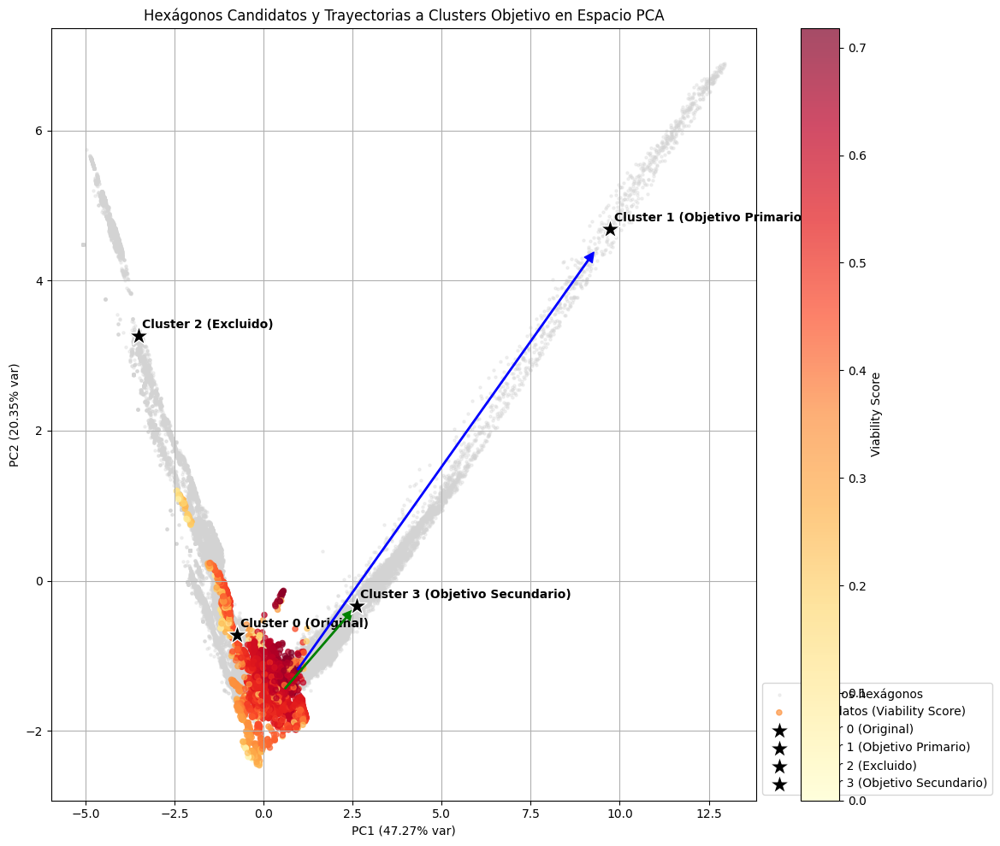

In [ ]:
# b) Scatter plot en espacio PCA (PC1 vs PC2)

plt.figure(figsize=(12, 10))

# Todos los hexágonos en gris claro (fondo)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c='lightgrey', s=5, alpha=0.3, label='Todos los hexágonos')

# Candidatos coloreados por viability_score
# Proyectar solo los candidatos al espacio PCA para la visualización
X_candidatos_scaled = scaler.transform(df_candidatos[FEATURES].fillna(df_candidatos[FEATURES].median()))
X_candidatos_pca = pca.transform(X_candidatos_scaled)

scatter = plt.scatter(
    X_candidatos_pca[:, 0], X_candidatos_pca[:, 1],
    c=df_candidatos['viability_score'], cmap='YlOrRd', s=20, alpha=0.7,
    label='Candidatos (Viability Score)'
)
plt.colorbar(scatter, label='Viability Score')

# Centroides de clusters marcados con estrella negra y etiquetados
# Asumiendo que `cluster_pca_centroids` es una lista/array de centroides en el orden 0, 1, 2, 3
cluster_labels_map = {
    0: 'Cluster 0 (Original)',
    1: 'Cluster 1 (Objetivo Primario)',
    2: 'Cluster 2 (Excluido)',
    3: 'Cluster 3 (Objetivo Secundario)'
}

for i, centroid in enumerate(cluster_pca_centroids):
    plt.scatter(centroid[0], centroid[1], marker='*', s=300, color='black', edgecolor='white', linewidth=1, zorder=10, label=cluster_labels_map.get(i, f'Cluster {i}'))
    plt.text(centroid[0] + 0.1, centroid[1] + 0.1, cluster_labels_map.get(i, f'C{i}'), fontsize=10, weight='bold')

# Flechas desde el centroide del 0A hacia el centroide del cluster objetivo
# Necesitamos obtener el centroide de 0A (que es parte del Cluster 0 original)
# Para ello, filtramos los datos originales que son 0A y calculamos su centroide en PCA
subcluster_0A_data = df_combined_geo[df_combined_geo['subcluster'] == "0A — Red conectada sin servicios"]
if not subcluster_0A_data.empty:
    X_0A_scaled = scaler.transform(subcluster_0A_data[FEATURES].fillna(subcluster_0A_data[FEATURES].median()))
    X_0A_pca = pca.transform(X_0A_scaled)
    centroid_0A = X_0A_pca.mean(axis=0)

    # Dibujar flechas desde centroid_0A a los centroides de Cluster 1 y Cluster 3
    plt.annotate('', xy=(cluster_pca_centroids[1][0], cluster_pca_centroids[1][1]), xytext=(centroid_0A[0], centroid_0A[1]),
                 arrowprops=dict(facecolor='blue', edgecolor='blue', shrink=0.05, width=1, headwidth=8, headlength=8),
                 label='0A -> C1' if cluster_pca_centroids[1][0] > centroid_0A[0] else None)
    plt.annotate('', xy=(cluster_pca_centroids[3][0], cluster_pca_centroids[3][1]), xytext=(centroid_0A[0], centroid_0A[1]),
                 arrowprops=dict(facecolor='green', edgecolor='green', shrink=0.05, width=1, headwidth=8, headlength=8),
                 label='0A -> C3' if cluster_pca_centroids[3][0] > centroid_0A[0] else None)

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%} var)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%} var)')
plt.title('Hexágonos Candidatos y Trayectorias a Clusters Objetivo en Espacio PCA')
plt.legend(loc='lower left', bbox_to_anchor=(1, 0))
plt.grid(True)
plt.tight_layout()
plt.show()

<Figure size 1500x700 with 0 Axes>

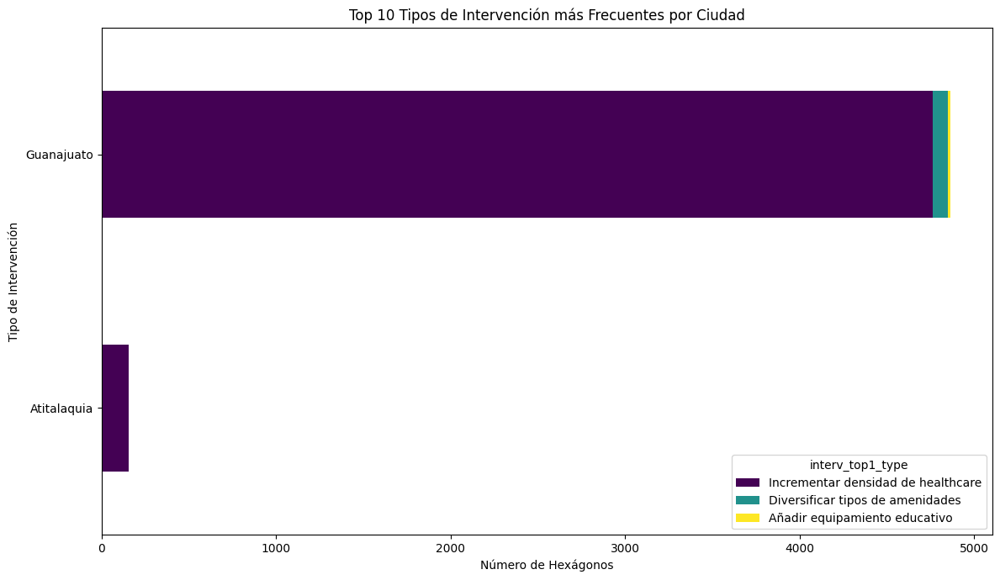

In [ ]:
# c) Bar chart horizontal: top-10 tipos de intervención más frecuentes entre candidatos.

plt.figure(figsize=(15, 7))

# Contar la frecuencia de intervenciones por ciudad
interv_counts = df_candidatos.groupby('city')['interv_top1_type'].value_counts().unstack(fill_value=0)

# Sumar las frecuencias para obtener el top general
total_interv_counts = interv_counts.sum(axis=1)

# Ordenar por frecuencia total y seleccionar el top-10
# Solo si hay datos de intervención
if not interv_counts.empty:
    top10_interventions = interv_counts.sum(axis=0).nlargest(10).index
    interv_counts_plot = interv_counts[top10_interventions]

    interv_counts_plot.plot(kind='barh', stacked=True, cmap='viridis', figsize=(12, 7))
    plt.title('Top 10 Tipos de Intervención más Frecuentes por Ciudad')
    plt.xlabel('Número de Hexágonos')
    plt.ylabel('Tipo de Intervención')
    plt.tight_layout()
    plt.show()
else:
    print("No hay datos de intervención para generar el gráfico.")

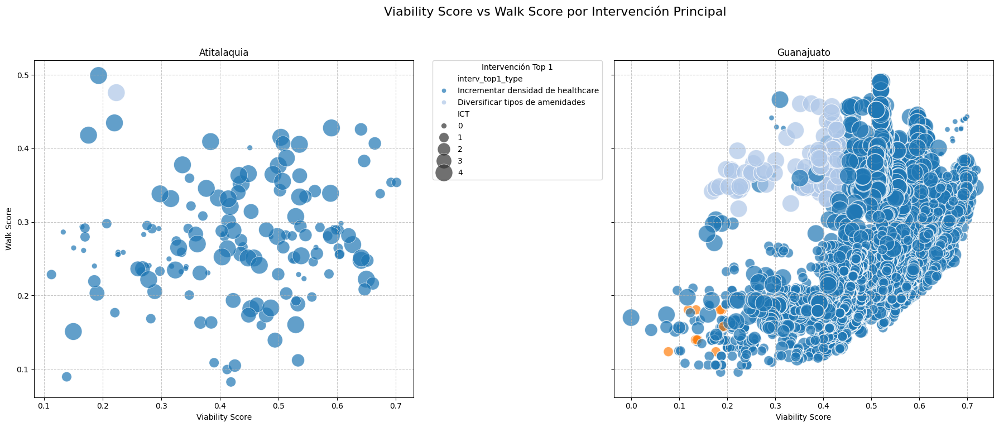

In [ ]:
# d) Scatter plot: viability_score vs walk_score, coloreado por intervención_top1.

fig, axes = plt.subplots(1, 2, figsize=(20, 8), sharey=True)
fig.suptitle('Viability Score vs Walk Score por Intervención Principal', fontsize=16)

# Obtener una paleta de colores para los tipos de intervención
intervention_types = df_candidatos['interv_top1_type'].dropna().unique()
palette = sns.color_palette('tab20', n_colors=len(intervention_types))
color_map = {int_type: color for int_type, color in zip(intervention_types, palette)}

for i, city in enumerate(df_candidatos['city'].unique()):
    city_df = df_candidatos[df_candidatos['city'] == city]

    sns.scatterplot(
        data=city_df,
        x='viability_score',
        y='walk_score',
        hue='interv_top1_type',
        size='ICT', # Tamaño del punto proporcional a ICT
        sizes=(50, 500), # Rango de tamaño de los puntos
        alpha=0.7,
        palette=color_map, # Usar el mapeo de colores
        ax=axes[i],
        legend='full' if i == 0 else False # Leyenda solo en el primer subplot
    )
    axes[i].set_title(f'{city}')
    axes[i].set_xlabel('Viability Score')
    axes[i].set_ylabel('Walk Score' if i == 0 else '')
    axes[i].grid(True, linestyle='--', alpha=0.7)

# Mover la leyenda fuera de los subplots si solo hay una
if len(df_candidatos['city'].unique()) == 1 or len(intervention_types) < 20:
    axes[0].legend(title='Intervención Top 1', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
else:
    # Para muchas categorías, puede ser mejor una leyenda compartida o separada
    pass # Se omite para no sobrecargar el gráfico

plt.tight_layout(rect=[0, 0.03, 0.9, 0.95]) # Ajustar para la leyenda
plt.show()

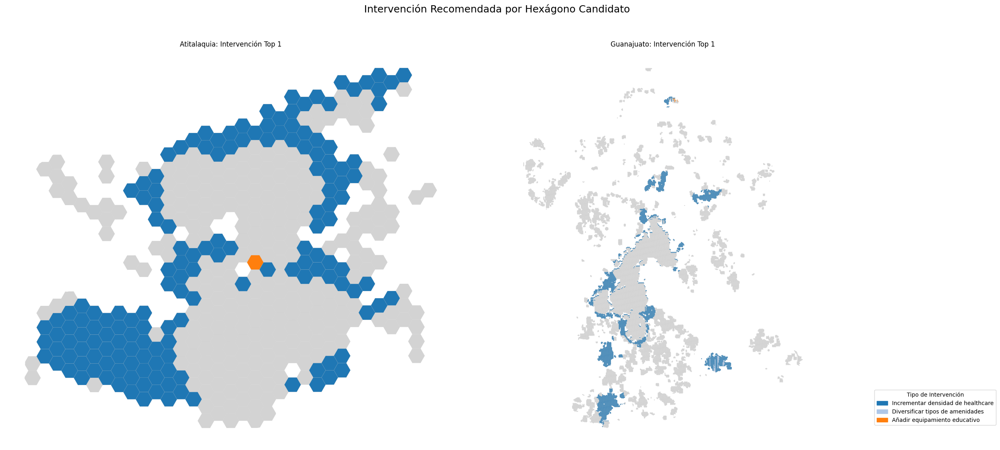

In [ ]:
# e) Mapa de intervención recomendada por hexágono para cada ciudad.

# Crear un GeoDataFrame combinado para facilitar el trazado del fondo
df_combined_geo_base = df_combined_geo[['geometry', 'city']].copy()
df_combined_geo_base['is_candidate'] = df_combined_geo_base.index.isin(df_candidatos.index)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 12))
fig.suptitle('Intervención Recomendada por Hexágono Candidato', fontsize=18)

# Obtener los tipos de intervención únicos para la paleta
intervention_types = df_candidatos['interv_top1_type'].dropna().unique()
# Generar una paleta de colores discreta (ej. 'tab20' tiene 20 colores, 'Paired' tiene 12)
num_colors = len(intervention_types)
palette_int = sns.color_palette('tab20', n_colors=num_colors)

# Mapear tipos de intervención a valores numéricos para el cmap discreto
int_to_numeric = {label: i for i, label in enumerate(intervention_types)}

# Atitalaquia
ax1.set_title('Atitalaquia: Intervención Top 1')
df_combined_geo_base.loc[df_combined_geo_base['city'] == 'Atitalaquia'].plot(
    ax=ax1, color='lightgrey', edgecolor='0.8', linewidth=0.1, legend=False
)
df_candidatos_ati = df_candidatos.loc[df_candidatos['city'] == 'Atitalaquia'].copy()
df_candidatos_ati['interv_numeric'] = df_candidatos_ati['interv_top1_type'].map(int_to_numeric)
df_candidatos_ati.plot(
    column='interv_numeric', cmap=ListedColormap(palette_int), linewidth=0.1, ax=ax1, edgecolor='0.8', legend=False
)
ax1.set_axis_off()

# Guanajuato
ax2.set_title('Guanajuato: Intervención Top 1')
df_combined_geo_base.loc[df_combined_geo_base['city'] == 'Guanajuato'].plot(
    ax=ax2, color='lightgrey', edgecolor='0.8', linewidth=0.1, legend=False
)
df_candidatos_gto = df_candidatos.loc[df_candidatos['city'] == 'Guanajuato'].copy()
df_candidatos_gto['interv_numeric'] = df_candidatos_gto['interv_top1_type'].map(int_to_numeric)
df_candidatos_gto.plot(
    column='interv_numeric', cmap=ListedColormap(palette_int), linewidth=0.1, ax=ax2, edgecolor='0.8', legend=False
)
ax2.set_axis_off()

# Crear leyenda personalizada
handles_int = [plt.Rectangle((0,0),1,1, color=palette_int[int_to_numeric[label]]) for label in intervention_types]
fig.legend(handles_int, intervention_types, title="Tipo de Intervención", loc='lower right', bbox_to_anchor=(1, 0.1))

plt.tight_layout(rect=[0, 0.05, 0.9, 0.95])
plt.show()

### PASO 7 — Tabla de los 20 hexágonos con mayor viability_score por ciudad

In [ ]:
print("\n--- Top 20 Hexágonos con Mayor Viability Score por Ciudad ---")

top20_ati = df_candidatos[df_candidatos['city'] == 'Atitalaquia'].nlargest(20, 'viability_score')
top20_gto = df_candidatos[df_candidatos['city'] == 'Guanajuato'].nlargest(20, 'viability_score')

columns_to_show = [
    'subcluster', 'walk_score', 'ICT', 'dist_to_cluster_objetivo',
    'viability_score', 'viability_label', 'interv_top1_type', 'interv_top2_type',
    'interv_top3_type', 'city'
]

print("\n=== Atitalaquia ===")
display(top20_ati[columns_to_show])

print("\n=== Guanajuato ===")
display(top20_gto[columns_to_show])


--- Top 20 Hexágonos con Mayor Viability Score por Ciudad ---

=== Atitalaquia ===


,subcluster,walk_score,ICT,dist_to_cluster_objetivo,viability_score,viability_label,interv_top1_type,interv_top2_type,interv_top3_type,city
85,0A — Red conectada sin servicios,0.353704,1,2.088886,0.701476,Alto potencial,Incrementar densidad de healthcare,Incrementar densidad de educational,Incrementar densidad de food,Atitalaquia
84,0A — Red conectada sin servicios,0.353738,1,2.154755,0.692063,Potencial medio,Incrementar densidad de healthcare,Incrementar densidad de educational,Incrementar densidad de food,Atitalaquia
83,0A — Red conectada sin servicios,0.338350,1,2.284146,0.673571,Potencial medio,Incrementar densidad de healthcare,Incrementar densidad de educational,Incrementar densidad de food,Atitalaquia
100,0A — Red conectada sin servicios,0.406792,2,2.348344,0.664397,Potencial medio,Incrementar densidad de healthcare,Diversificar tipos de amenidades,Incrementar densidad de educational,Atitalaquia
80,0A — Red conectada sin servicios,0.216314,2,2.372337,0.660968,Potencial medio,Incrementar densidad de healthcare,Diversificar tipos de amenidades,Incrementar densidad de educational,Atitalaquia
401,0A — Red conectada sin servicios,0.247571,2,2.437499,0.651655,Potencial medio,Incrementar densidad de healthcare,Diversificar tipos de amenidades,Incrementar densidad de educational,Atitalaquia
79,0A — Red conectada sin servicios,0.222086,4,2.449216,0.649981,Potencial medio,Incrementar densidad de healthcare,Incrementar densidad de educational,Diversificar tipos de amenidades,Atitalaquia
81,0A — Red conectada sin servicios,0.208270,2,2.469481,0.647085,Potencial medio,Incrementar densidad de healthcare,Incrementar densidad de educational,Diversificar tipos de amenidades,Atitalaquia
115,0A — Red conectada sin servicios,0.382888,2,2.475386,0.646241,Potencial medio,Incrementar densidad de healthcare,Diversificar tipos de amenidades,Incrementar densidad de educational,Atitalaquia
402,0A — Red conectada sin servicios,0.250907,4,2.508340,0.641532,Potencial medio,Incrementar densidad de healthcare,Diversificar tipos de amenidades,Incrementar densidad de educational,Atitalaquia



=== Guanajuato ===


,subcluster,walk_score,ICT,dist_to_cluster_objetivo,viability_score,viability_label,interv_top1_type,interv_top2_type,interv_top3_type,city
15474,0A — Red conectada sin servicios,0.370431,1,1.972081,0.718169,Alto potencial,Incrementar densidad de healthcare,Incrementar densidad de educational,Diversificar tipos de amenidades,Guanajuato
16122,0A — Red conectada sin servicios,0.365533,0,1.981785,0.716782,Alto potencial,Incrementar densidad de healthcare,Incrementar densidad de educational,Diversificar tipos de amenidades,Guanajuato
3317,0A — Red conectada sin servicios,0.346839,4,1.983807,0.716493,Alto potencial,Incrementar densidad de healthcare,Incrementar densidad de educational,Diversificar tipos de amenidades,Guanajuato
3312,0A — Red conectada sin servicios,0.343750,1,2.003776,0.713639,Alto potencial,Incrementar densidad de healthcare,Incrementar densidad de educational,Diversificar tipos de amenidades,Guanajuato
15701,0A — Red conectada sin servicios,0.357654,1,2.031911,0.709618,Alto potencial,Incrementar densidad de healthcare,Incrementar densidad de educational,Diversificar tipos de amenidades,Guanajuato
16134,0A — Red conectada sin servicios,0.365075,0,2.034761,0.709211,Alto potencial,Incrementar densidad de healthcare,Incrementar densidad de educational,Diversificar tipos de amenidades,Guanajuato
3238,0A — Red conectada sin servicios,0.333698,1,2.047690,0.707363,Alto potencial,Incrementar densidad de healthcare,Incrementar densidad de educational,Diversificar tipos de amenidades,Guanajuato
15271,0A — Red conectada sin servicios,0.337918,2,2.054304,0.706418,Alto potencial,Incrementar densidad de healthcare,Incrementar densidad de educational,Incrementar densidad de food,Guanajuato
16511,0A — Red conectada sin servicios,0.359225,3,2.054954,0.706325,Alto potencial,Incrementar densidad de healthcare,Incrementar densidad de educational,Incrementar densidad de food,Guanajuato
7016,0A — Red conectada sin servicios,0.321850,1,2.059640,0.705655,Alto potencial,Incrementar densidad de healthcare,Incrementar densidad de educational,Incrementar densidad de food,Guanajuato


### PASO 8 — Reporte estadístico

In [ ]:
print("\n--- Reporte Estadístico del Recomendador de Intervenciones Mínimas (RIM) ---")

for city_name in df_candidatos['city'].unique():
    city_candidatos = df_candidatos[df_candidatos['city'] == city_name]

    print(f"\n=== {city_name} ===")

    # Total de candidatos primarios (0A) y secundarios (0B con ICT>=1)
    num_0A = len(city_candidatos[city_candidatos['subcluster'] == "0A — Red conectada sin servicios"])
    num_0B_ict1 = len(city_candidatos[city_candidatos['subcluster'] == "0B — Periferia desarticulada"])
    print(f"  - Candidatos primarios (0A): {num_0A}")
    print(f"  - Candidatos secundarios (0B con ICT>=1): {num_0B_ict1}")

    # Distribución de viability_label entre candidatos
    print("\n  - Distribución de Viability Label:")
    display(city_candidatos['viability_label'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%')

    # Intervención más frecuente por ciudad
    if not city_candidatos['interv_top1_type'].empty:
        most_frequent_interv = city_candidatos['interv_top1_type'].mode()[0]
        print(f"\n  - Intervención más frecuente: {most_frequent_interv}")
    else:
        print("\n  - No hay intervenciones para mostrar.")

    # Hexágono con mayor viability_score
    if not city_candidatos.empty:
        best_hexagon = city_candidatos.nlargest(1, 'viability_score').iloc[0]
        print(f"\n  - Hexágono con mayor Viability Score (ID: {best_hexagon.name}):")
        print(f"    - Walk Score: {best_hexagon['walk_score']:.2f}")
        print(f"    - ICT: {best_hexagon['ICT']}")
        print(f"    - Viability Score: {best_hexagon['viability_score']:.2f}")
        print(f"    - Intervenciones recomendadas:")
        print(f"      1. {best_hexagon['interv_top1_type']} (Impacto: {best_hexagon['interv_top1_delta']:.2f})")
        if pd.notna(best_hexagon['interv_top2_type']):
            print(f"      2. {best_hexagon['interv_top2_type']} (Impacto: {best_hexagon['interv_top2_delta']:.2f})")
        if pd.notna(best_hexagon['interv_top3_type']):
            print(f"      3. {best_hexagon['interv_top3_type']} (Impacto: {best_hexagon['interv_top3_delta']:.2f})")
    else:
        print("\n  - No hay hexágonos candidatos para analizar.")


--- Reporte Estadístico del Recomendador de Intervenciones Mínimas (RIM) ---

=== Atitalaquia ===
  - Candidatos primarios (0A): 115
  - Candidatos secundarios (0B con ICT>=1): 42

  - Distribución de Viability Label:


,proportion
viability_label,
Potencial medio,59.87%
Requiere intervención mayor,39.49%
Alto potencial,0.64%



  - Intervención más frecuente: Incrementar densidad de healthcare

  - Hexágono con mayor Viability Score (ID: 85):
    - Walk Score: 0.35
    - ICT: 1
    - Viability Score: 0.70
    - Intervenciones recomendadas:
      1. Incrementar densidad de healthcare (Impacto: 0.51)
      2. Incrementar densidad de educational (Impacto: 0.16)
      3. Incrementar densidad de food (Impacto: 0.10)

=== Guanajuato ===
  - Candidatos primarios (0A): 2924
  - Candidatos secundarios (0B con ICT>=1): 1938

  - Distribución de Viability Label:


,proportion
viability_label,
Potencial medio,85.95%
Requiere intervención mayor,13.51%
Alto potencial,0.53%



  - Intervención más frecuente: Incrementar densidad de healthcare

  - Hexágono con mayor Viability Score (ID: 15474):
    - Walk Score: 0.37
    - ICT: 1
    - Viability Score: 0.72
    - Intervenciones recomendadas:
      1. Incrementar densidad de healthcare (Impacto: 0.47)
      2. Incrementar densidad de educational (Impacto: 0.15)
      3. Diversificar tipos de amenidades (Impacto: 0.13)


In [ ]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import euclidean_distances
from matplotlib.colors import ListedColormap

# --- PASO 0: ESTRATIFICACIÓN DE VARIABLES ---
VARIABLES_RED_VIAL = {
    'intersection_density_ge3_1_2km': {'tipo': 'aumentar', 'delta': 10.0, 'etiqueta': 'Mejorar conectividad vial', 'prioridad': 1},
    'average_link_length_1_2km':      {'tipo': 'reducir',  'delta': 0.15, 'etiqueta': 'Reducir longitud de segmentos', 'prioridad': 1},
    'cul_de_sac_ratio_1_2km':         {'tipo': 'reducir',  'delta': 0.10, 'etiqueta': 'Reducir calles sin salida', 'prioridad': 1},
}

VARIABLES_ACTIVACION_COMERCIAL = {
    'dist_food_combined':      {'tipo': 'reducir_pct', 'delta': 0.30, 'etiqueta': 'Añadir servicio alimentación', 'prioridad': 2},
    'food_count_combined':     {'tipo': 'aumentar',    'delta': 5.0,  'etiqueta': 'Incrementar oferta alimentaria', 'prioridad': 2},
    'dist_leisure_combined':   {'tipo': 'reducir_pct', 'delta': 0.30, 'etiqueta': 'Añadir espacio ocio', 'prioridad': 2},
    'leisure_count_combined':  {'tipo': 'aumentar',    'delta': 5.0,  'etiqueta': 'Incrementar oferta recreativa', 'prioridad': 2},
    'amenity_diversity_inegi': {'tipo': 'aumentar',    'delta': 0.20, 'etiqueta': 'Diversificar amenidades', 'prioridad': 2},
}

VARIABLES_INSTITUCIONAL = {
    'dist_healthcare_combined':    {'tipo': 'reducir_pct', 'delta': 0.30, 'etiqueta': 'Añadir servicio salud', 'prioridad': 3},
    'healthcare_count_combined':   {'tipo': 'aumentar',    'delta': 3.0,  'etiqueta': 'Incrementar cobertura salud', 'prioridad': 3},
    'dist_educational_combined':   {'tipo': 'reducir_pct', 'delta': 0.30, 'etiqueta': 'Añadir equipamiento educativo', 'prioridad': 3},
    'educational_count_combined':  {'tipo': 'aumentar',    'delta': 3.0,  'etiqueta': 'Incrementar cobertura educativa', 'prioridad': 3},
}

NON_INTERVENTIONAL = ['population_count_1_2km', 'network_density_1_2km', 'info_gap']
ALL_STRATIFIED = {**VARIABLES_RED_VIAL, **VARIABLES_ACTIVACION_COMERCIAL, **VARIABLES_INSTITUCIONAL}

# Obtener máximos observados para clippeo
MAX_VALS = df_combined_geo[FEATURES].max()

# --- PASO 1: FILTRADO DE CANDIDATOS ---
def get_candidates(df):
    primarios = df[df['subcluster'] == "0A — Red conectada sin servicios"]
    secundarios = df[(df['subcluster'] == "0B — Periferia desarticulada") & (df['ICT'] >= 1)]
    return pd.concat([primarios, secundarios]).copy()

df_cands = get_candidates(df_combined_geo)

# --- PASO 2: DISTANCIAS AL OBJETIVO ---
def assign_target_distances(df_subset, scaler_m, pca_m, centroids):
    X_sub = df_subset[FEATURES].fillna(df_combined_geo[FEATURES].median())
    X_pca_sub = pca_m.transform(scaler_m.transform(X_sub))

    d1 = euclidean_distances(X_pca_sub, centroids[1].reshape(1, -1)).flatten()
    d3 = euclidean_distances(X_pca_sub, centroids[3].reshape(1, -1)).flatten()

    df_subset['dist_to_c1'] = d1
    df_subset['dist_to_c3'] = d3
    df_subset['cluster_objetivo'] = np.where(d1 < d3, 1, 3)
    df_subset['dist_orig_pca'] = np.where(d1 < d3, d1, d3)
    return df_subset, X_sub

df_cands, X_orig_vals = assign_target_distances(df_cands, scaler, pca, cluster_pca_centroids)

# --- PASO 3 & 5: SENSIBILIDAD ESTRATIFICADA Y PRIORIZACIÓN ---
def run_rim_v2(df_subset, x_vals, scaler_m, pca_m, centroids):
    results = []
    for idx, row in df_subset.iterrows():
        orig_f = x_vals.loc[[idx]].values
        target_id = int(row['cluster_objetivo'])
        target_centroid = centroids[target_id].reshape(1, -1)
        dist_orig = row['dist_orig_pca']

        impacts = {}
        for feat, config in ALL_STRATIFIED.items():
            f_idx = FEATURES.index(feat)
            mod_f = orig_f.copy()

            if config['tipo'] == 'aumentar': mod_f[0, f_idx] += config['delta']
            elif config['tipo'] == 'reducir': mod_f[0, f_idx] -= config['delta']
            elif config['tipo'] == 'reducir_pct': mod_f[0, f_idx] *= (1 - config['delta'])

            mod_f[0, f_idx] = np.clip(mod_f[0, f_idx], 0, MAX_VALS[feat])
            new_pca = pca_m.transform(scaler_m.transform(mod_f))
            impacts[feat] = dist_orig - euclidean_distances(new_pca, target_centroid)[0][0]

        # Agregación por grupos
        imp_vial = {k: v for k, v in impacts.items() if k in VARIABLES_RED_VIAL}
        imp_com  = {k: v for k, v in impacts.items() if k in VARIABLES_ACTIVACION_COMERCIAL}
        imp_inst = {k: v for k, v in impacts.items() if k in VARIABLES_INSTITUCIONAL}

        total_vial = sum(imp_vial.values())
        total_com  = sum(imp_com.values())
        total_inst = sum(imp_inst.values())

        top_vial = max(imp_vial, key=imp_vial.get)
        top_com  = max(imp_com, key=imp_com.get)
        top_inst = max(imp_inst, key=imp_inst.get)

        # Grupo recomendado
        grupos = {'Red vial': total_vial, 'Activación comercial': total_com, 'Institucional': total_inst}
        best_grp = max(grupos, key=grupos.get)

        # Lógica Priorizada (Paso 5)
        if impacts[top_vial] > (0.5 * total_com):
            interv_prio = ALL_STRATIFIED[top_vial]['etiqueta']
        else:
            interv_prio = ALL_STRATIFIED[top_com]['etiqueta']

        results.append({
            'index': idx,
            'impacto_red_vial_total': total_vial, 'impacto_comercial_total': total_com, 'impacto_institucional_total': total_inst,
            'grupo_recomendado': best_grp,
            'intervencion_prioritaria': interv_prio,
            'intervencion_secundaria': ALL_STRATIFIED[top_com]['etiqueta'] if interv_prio != ALL_STRATIFIED[top_com]['etiqueta'] else ALL_STRATIFIED[top_vial]['etiqueta'],
            'intervencion_contexto': ALL_STRATIFIED[top_inst]['etiqueta']
        })

    return df_subset.merge(pd.DataFrame(results).set_index('index'), left_index=True, right_index=True)

df_cands = run_rim_v2(df_cands, X_orig_vals, scaler, pca, cluster_pca_centroids)

# --- PASO 4: VIABILIDAD ---
dist_max = df_cands['dist_orig_pca'].max()
df_cands['viability_score'] = 1 - (df_cands['dist_orig_pca'] / dist_max)
df_cands['viability_label'] = pd.cut(df_cands['viability_score'], bins=[0, 0.4, 0.7, 1.1], labels=['Requiere intervención mayor', 'Potencial medio', 'Alto potencial'])

print("RIM v2 procesado correctamente.")

Se truncaron las últimas líneas 5000 del resultado de transmisión.
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names


RIM v2 procesado correctamente.


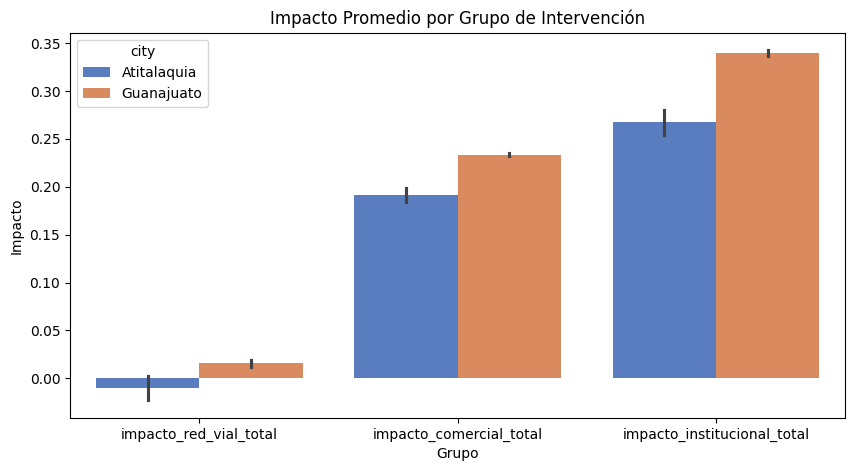

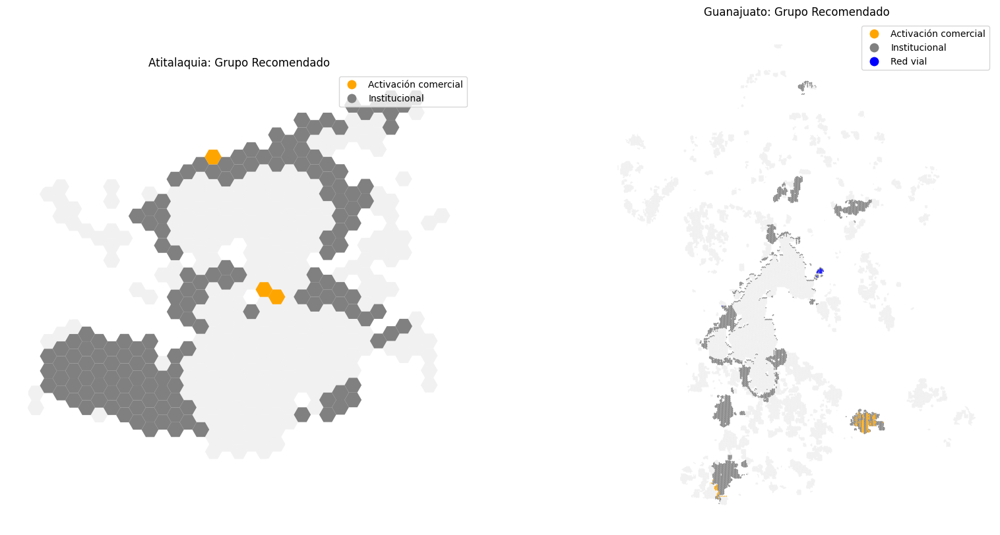

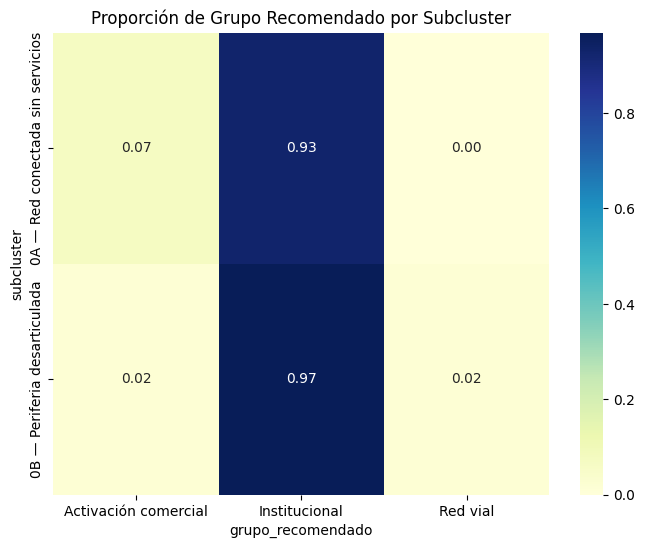

In [ ]:
import seaborn as sns
# a) Bar chart impacto promedio
plt.figure(figsize=(10, 5))
impact_cols = ['impacto_red_vial_total', 'impacto_comercial_total', 'impacto_institucional_total']
df_melt = df_cands.melt(id_vars=['city'], value_vars=impact_cols, var_name='Grupo', value_name='Impacto')
sns.barplot(data=df_melt, x='Grupo', y='Impacto', hue='city', palette='muted')
plt.title("Impacto Promedio por Grupo de Intervención")
plt.show()

# b) Mapa grupo_recomendado
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
colors = {'Red vial': 'blue', 'Activación comercial': 'orange', 'Institucional': 'grey'}
for i, city in enumerate(['Atitalaquia', 'Guanajuato']):
    base = df_combined_geo[df_combined_geo['city'] == city]
    base.plot(ax=axes[i], color='lightgrey', alpha=0.3)
    city_cands = df_cands[df_cands['city'] == city]
    city_cands.plot(ax=axes[i], column='grupo_recomendado', categorical=True, legend=True,
                    cmap=ListedColormap([colors[x] for x in sorted(city_cands['grupo_recomendado'].unique())]))
    axes[i].set_title(f"{city}: Grupo Recomendado")
    axes[i].axis('off')
plt.show()

# e) Heatmap Subcluster vs Grupo
plt.figure(figsize=(8, 6))
ct = pd.crosstab(df_cands['subcluster'], df_cands['grupo_recomendado'], normalize='index')
sns.heatmap(ct, annot=True, cmap='YlGnBu', fmt='.2f')
plt.title("Proporción de Grupo Recomendado por Subcluster")
plt.show()

In [ ]:
cols_rep = ['subcluster', 'walk_score', 'ICT', 'viability_score', 'viability_label', 'grupo_recomendado', 'intervencion_prioritaria', 'intervencion_secundaria', 'intervencion_contexto']
print("\n--- TOP 20 ATITALAQUIA ---")
display(df_cands[df_cands['city'] == 'Atitalaquia'].nlargest(20, 'viability_score')[cols_rep])

print("\n--- TOP 20 GUANAJUATO ---")
display(df_cands[df_cands['city'] == 'Guanajuato'].nlargest(20, 'viability_score')[cols_rep])

# Reporte Estadístico
for city in df_cands['city'].unique():
    sub = df_cands[df_cands['city'] == city]
    print(f"\nESTADÍSTICAS {city.upper()}:")
    print(sub['grupo_recomendado'].value_counts(normalize=True).mul(100).round(1).astype(str) + '%')
    print(f"Impacto Vial Medio: {sub['impacto_red_vial_total'].mean():.3f}")
    print(f"Impacto Comercial Medio: {sub['impacto_comercial_total'].mean():.3f}")
    best = sub.loc[sub['viability_score'].idxmax()]
    print(f"Mejor candidato (ID {best.name}): {best['intervencion_prioritaria']} | Viability: {best['viability_score']:.2f}")


--- TOP 20 ATITALAQUIA ---


,subcluster,walk_score,ICT,viability_score,viability_label,grupo_recomendado,intervencion_prioritaria,intervencion_secundaria,intervencion_contexto
85,0A — Red conectada sin servicios,0.353704,1,0.701476,Alto potencial,Institucional,Incrementar oferta alimentaria,Mejorar conectividad vial,Incrementar cobertura salud
84,0A — Red conectada sin servicios,0.353738,1,0.692063,Potencial medio,Institucional,Incrementar oferta alimentaria,Mejorar conectividad vial,Incrementar cobertura salud
83,0A — Red conectada sin servicios,0.338350,1,0.673571,Potencial medio,Institucional,Incrementar oferta alimentaria,Mejorar conectividad vial,Incrementar cobertura salud
100,0A — Red conectada sin servicios,0.406792,2,0.664397,Potencial medio,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud
80,0A — Red conectada sin servicios,0.216314,2,0.660968,Potencial medio,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud
401,0A — Red conectada sin servicios,0.247571,2,0.651655,Potencial medio,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud
79,0A — Red conectada sin servicios,0.222086,4,0.649981,Potencial medio,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud
81,0A — Red conectada sin servicios,0.208270,2,0.647085,Potencial medio,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud
115,0A — Red conectada sin servicios,0.382888,2,0.646241,Potencial medio,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud
402,0A — Red conectada sin servicios,0.250907,4,0.641532,Potencial medio,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud



--- TOP 20 GUANAJUATO ---


,subcluster,walk_score,ICT,viability_score,viability_label,grupo_recomendado,intervencion_prioritaria,intervencion_secundaria,intervencion_contexto
15474,0A — Red conectada sin servicios,0.370431,1,0.718169,Alto potencial,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud
16122,0A — Red conectada sin servicios,0.365533,0,0.716782,Alto potencial,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud
3317,0A — Red conectada sin servicios,0.346839,4,0.716493,Alto potencial,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud
3312,0A — Red conectada sin servicios,0.343750,1,0.713639,Alto potencial,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud
15701,0A — Red conectada sin servicios,0.357654,1,0.709618,Alto potencial,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud
16134,0A — Red conectada sin servicios,0.365075,0,0.709211,Alto potencial,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud
3238,0A — Red conectada sin servicios,0.333698,1,0.707363,Alto potencial,Institucional,Diversificar amenidades,Mejorar conectividad vial,Incrementar cobertura salud
15271,0A — Red conectada sin servicios,0.337918,2,0.706418,Alto potencial,Institucional,Incrementar oferta alimentaria,Mejorar conectividad vial,Incrementar cobertura salud
16511,0A — Red conectada sin servicios,0.359225,3,0.706325,Alto potencial,Institucional,Incrementar oferta alimentaria,Mejorar conectividad vial,Incrementar cobertura salud
7016,0A — Red conectada sin servicios,0.321850,1,0.705655,Alto potencial,Institucional,Incrementar oferta alimentaria,Mejorar conectividad vial,Incrementar cobertura salud



ESTADÍSTICAS ATITALAQUIA:
grupo_recomendado
Institucional           98.1%
Activación comercial     1.9%
Name: proportion, dtype: object
Impacto Vial Medio: -0.010
Impacto Comercial Medio: 0.191
Mejor candidato (ID 85): Incrementar oferta alimentaria | Viability: 0.70

ESTADÍSTICAS GUANAJUATO:
grupo_recomendado
Institucional           94.4%
Activación comercial     4.9%
Red vial                 0.7%
Name: proportion, dtype: object
Impacto Vial Medio: 0.016
Impacto Comercial Medio: 0.233
Mejor candidato (ID 15474): Diversificar amenidades | Viability: 0.72


In [ ]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples

# --- PASO 0: RECONSTRUCCIÓN DE COLUMNAS COMBINED ---
def process_v2(gdf):
    d = gdf.copy()
    categories = ['food', 'leisure']
    for cat in categories:
        # Distancias combinadas (Min OSM/INEGI)
        osm_dist = f'dist_to_{cat}'
        inegi_dist = f'dist_to_{cat}_inegi'
        d[f'dist_{cat}_combined'] = d[[osm_dist, inegi_dist]].min(axis=1)

        # Conteos combinados (Max OSM/INEGI)
        osm_count = f'{cat}_osm_count_1_2km'
        inegi_count = f'{cat}_inegi_count_1_2km'
        d[f'{cat}_count_combined'] = d[[osm_count, inegi_count]].max(axis=1)

    # Info Gap (usa todas las originales para medir brecha de datos)
    cats_all = ['food', 'healthcare', 'educational', 'leisure']
    dist_osm = [f'dist_to_{c}' for c in cats_all]
    dist_inegi = [f'dist_to_{c}_inegi' for c in cats_all]
    d['info_gap'] = (d[dist_osm].mean(axis=1) - d[dist_inegi].mean(axis=1)).abs()
    return d

# Aplicar a GDFs originales
gdf_ati_v2 = process_v2(gdf_ati)
gdf_gto_v2 = process_v2(gdf_gto)

# PASO 1: DEFINIR FEATURES V2 (11 variables)
FEATURES_V2 = [
    'dist_food_combined', 'dist_leisure_combined',
    'food_count_combined', 'leisure_count_combined',
    'average_link_length_1_2km', 'intersection_density_ge3_1_2km',
    'cul_de_sac_ratio_1_2km', 'network_density_1_2km',
    'amenity_diversity_inegi', 'population_count_1_2km', 'info_gap'
]

# PASO 2: PREPARAR DATOS COMBINADOS
df_total_v2 = pd.concat([
    pd.DataFrame(gdf_ati_v2.drop(columns='geometry')).assign(ciudad='Atitalaquia'),
    pd.DataFrame(gdf_gto_v2.drop(columns='geometry')).assign(ciudad='Guanajuato')
], keys=['Atitalaquia', 'Guanajuato'])

# Imputación de medianas y normalización
X_v2 = df_total_v2[FEATURES_V2].fillna(df_total_v2[FEATURES_V2].median())
scaler_v2 = StandardScaler()
X_scaled_v2 = scaler_v2.fit_transform(X_v2)

print(f"DataFrame V2 preparado: {X_v2.shape[0]} filas, {X_v2.shape[1]} variables.")

DataFrame V2 preparado: 29445 filas, 11 variables.


In [ ]:
# PASO 3: PCA V2
pca_v2 = PCA(n_components=0.85, random_state=42)
X_pca_v2 = pca_v2.fit_transform(X_scaled_v2)

print(f"--- REPORTE PCA V2 ---")
print(f"Componentes seleccionados para 85% varianza: {pca_v2.n_components_}")
print(f"Varianza explicada por componente: {pca_v2.explained_variance_ratio_.round(4)}")
print(f"Varianza acumulada: {np.cumsum(pca_v2.explained_variance_ratio_).round(4)}")

# Loadings PC1
loadings_v2 = pd.DataFrame(pca_v2.components_.T, index=FEATURES_V2, columns=[f'PC{i+1}' for i in range(pca_v2.n_components_)])
print("\nTop Loadings PC1 (V2):")
print(loadings_v2['PC1'].sort_values(ascending=False).to_string())

# Comparación rápida con V1 (asumiendo reporte previo)
# En V1 (15 vars) PC1 estaba liderado por variables institucionales/población.
# Aquí observamos el peso de la red vial e infraestructura comercial.


--- REPORTE PCA V2 ---
Componentes seleccionados para 85% varianza: 5
Varianza explicada por componente: [0.4271 0.1616 0.0969 0.0918 0.078 ]
Varianza acumulada: [0.4271 0.5887 0.6856 0.7774 0.8554]

Top Loadings PC1 (V2):
intersection_density_ge3_1_2km    0.436111
population_count_1_2km            0.433318
leisure_count_combined            0.404209
food_count_combined               0.357820
amenity_diversity_inegi           0.337106
network_density_1_2km            -0.016055
cul_de_sac_ratio_1_2km           -0.104483
info_gap                         -0.126124
average_link_length_1_2km        -0.203520
dist_leisure_combined            -0.266821
dist_food_combined               -0.278005


In [ ]:
# PASO 4: K-MEANS V2 (Prueba de k=3, 4, 5)
results_k = []
for k in [3, 4, 5]:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(X_pca_v2)
    score = silhouette_score(X_pca_v2, labels)
    counts = pd.Series(labels).value_counts(normalize=True)
    min_size = counts.min()
    results_k.append({'k': k, 'inertia': km.inertia_, 'silhouette': score, 'min_cluster_pct': min_size})

display(pd.DataFrame(results_k))

# Seleccionamos k=4 para mantener consistencia con arquetipos si el silhouette es similar
k_opt = 4
kmeans_v2 = KMeans(n_clusters=k_opt, random_state=42, n_init=10)
clusters_v2 = kmeans_v2.fit_predict(X_pca_v2)
df_total_v2['cluster_v2'] = clusters_v2

print(f"\nSeleccionado k={k_opt} por balance entre silhouette y consistencia estructural.")

,k,inertia,silhouette,min_cluster_pct
0,3,143788.712872,0.321620,0.030192
1,4,108499.353557,0.356533,0.029954
2,5,91918.052320,0.355529,0.029750



Seleccionado k=4 por balance entre silhouette y consistencia estructural.


--- Perfiles de Clusters V2 (Mediana Original) ---


,dist_food_combined,dist_leisure_combined,food_count_combined,leisure_count_combined,average_link_length_1_2km,intersection_density_ge3_1_2km,cul_de_sac_ratio_1_2km,network_density_1_2km,amenity_diversity_inegi,population_count_1_2km,info_gap
cluster_v2,,,,,,,,,,,
0,695.727,431.689,6.0,46.0,85.466,72.510,0.240,0.0,0.857,8670.0,725.565
1,5051.971,3794.027,0.0,0.0,238.785,8.635,0.246,0.0,0.000,443.0,3456.649
2,16773.617,16913.830,0.0,0.0,626.483,1.771,0.375,0.0,0.000,69.0,1400.121
3,277.053,141.560,107.0,417.0,57.052,245.980,0.169,0.0,0.752,27076.0,171.808



--- Matriz de correspondencia normalizada (Filas=V1, Col=V2) ---


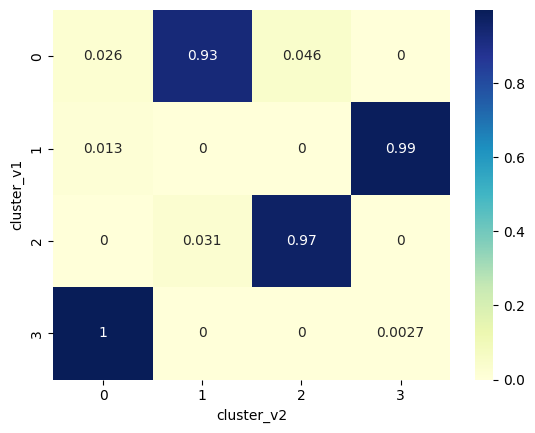

In [ ]:
# PASO 5: PERFILES DE CLUSTERS V2
profiles_v2 = df_total_v2.groupby('cluster_v2')[FEATURES_V2].median()
print("--- Perfiles de Clusters V2 (Mediana Original) ---")
display(profiles_v2.round(3))

# PASO 6: COMPARACIÓN DIRECTA V1 VS V2
# Recuperar clusters v1 de df_total original si está disponible
if 'cluster' in df_total.columns:
    df_total_v2['cluster_v1'] = df_total['cluster']
    comparison = pd.crosstab(df_total_v2['cluster_v1'], df_total_v2['cluster_v2'], normalize='index')
    print("\n--- Matriz de correspondencia normalizada (Filas=V1, Col=V2) ---")
    sns.heatmap(comparison, annot=True, cmap='YlGnBu')
    plt.show()
else:
    print("\nNo se encontró 'cluster' (V1) en df_total para realizar la comparación directa.")

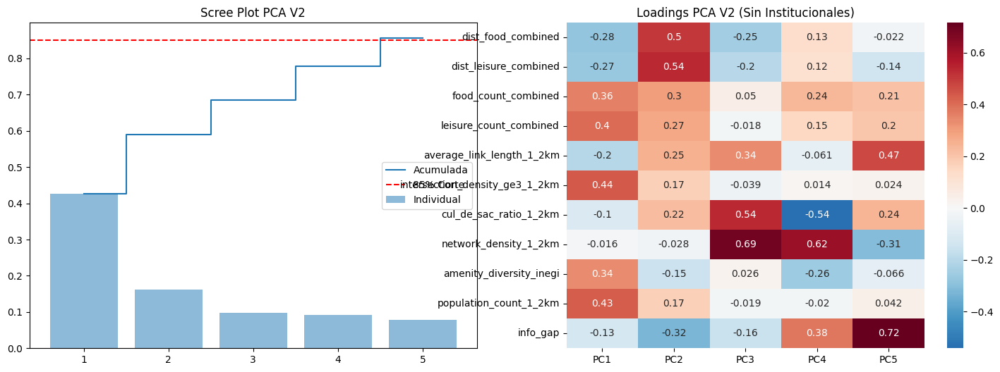

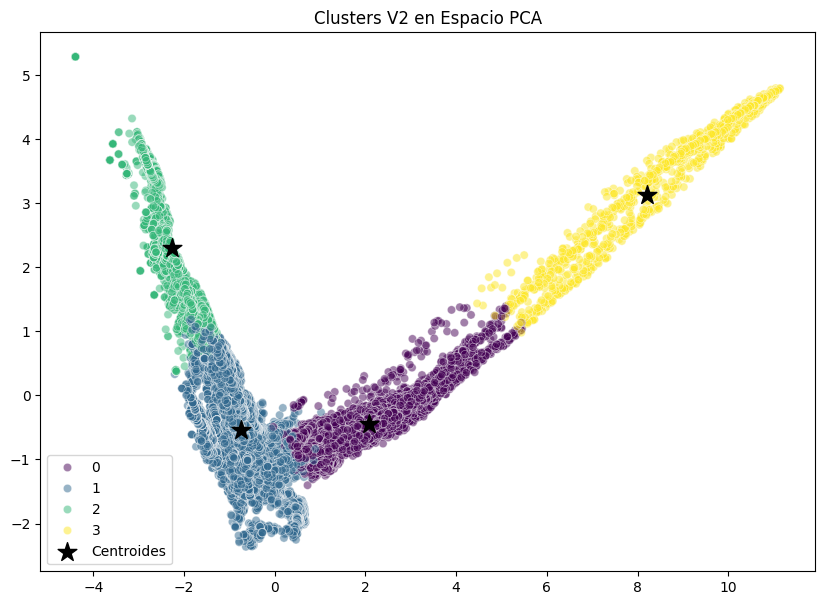

In [ ]:
# PASO 7: VISUALIZACIONES
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# a) Scree Plot
exp_var = pca_v2.explained_variance_ratio_
cum_var = np.cumsum(exp_var)
axes[0].bar(range(1, len(exp_var)+1), exp_var, alpha=0.5, label='Individual')
axes[0].step(range(1, len(cum_var)+1), cum_var, where='mid', label='Acumulada')
axes[0].axhline(y=0.85, color='r', linestyle='--', label='85% Corte')
axes[0].set_title('Scree Plot PCA V2')
axes[0].legend()

# b) Heatmap Loadings
sns.heatmap(loadings_v2, annot=True, cmap='RdBu_r', center=0, ax=axes[1])
axes[1].set_title('Loadings PCA V2 (Sin Institucionales)')
plt.show()

# c) Scatter PCA
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_pca_v2[:,0], y=X_pca_v2[:,1], hue=clusters_v2, palette='viridis', alpha=0.5)
plt.scatter(kmeans_v2.cluster_centers_[:,0], kmeans_v2.cluster_centers_[:,1], marker='*', s=200, c='black', label='Centroides')
plt.title('Clusters V2 en Espacio PCA')
plt.legend()
plt.show()

In [ ]:
# PASO 9: EVALUACIÓN RÁPIDA RIM V2
# Muestra de 50 hexágonos
sample_idx = np.random.choice(range(len(df_total_v2)), size=50, replace=False)
X_sample = X_scaled_v2[sample_idx]

# Calculamos sensibilidad simple: impacto de mejorar dist_food_combined vs intersection_density
# Solo para verificar si el espacio PCA responde a estas variables ahora
def check_impact(idx_feat):
    modified = X_sample.copy()
    modified[:, idx_feat] -= 0.5 # Mejorar (reducir distancia o longitud)
    dist_orig = np.linalg.norm(X_pca_v2[sample_idx] - kmeans_v2.cluster_centers_[1], axis=1)
    dist_new = np.linalg.norm(pca_v2.transform(modified) - kmeans_v2.cluster_centers_[1], axis=1)
    return (dist_orig - dist_new).mean()

print("--- Evaluación de Impacto Promedio (Muestra n=50) ---")
print(f"Impacto mejora Distancia a Comida: {check_impact(FEATURES_V2.index('dist_food_combined')):.4f}")
print(f"Impacto mejora Densidad Intersecciones: {check_impact(FEATURES_V2.index('intersection_density_ge3_1_2km')):.4f}")

--- Evaluación de Impacto Promedio (Muestra n=50) ---
Impacto mejora Distancia a Comida: 0.0022
Impacto mejora Densidad Intersecciones: 0.0095


In [ ]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import euclidean_distances
from matplotlib.colors import ListedColormap

# --- PASO PREVIO: MAPEADO DE INDICADORES ---
cols_to_map = ['walk_score', 'ICT', 'subcluster', 'walk_category']
for col in cols_to_map:
    if col in df_combined_geo.columns:
        df_total_v2[col] = df_combined_geo[col].values

# --- PASO 0: ESTRATIFICACIÓN DE VARIABLES ---
VARIABLES_RED_VIAL = {
    'intersection_density_ge3_1_2km': {'tipo': 'aumentar', 'delta': 10.0, 'etiqueta': 'Mejorar conectividad vial', 'prioridad': 1},
    'average_link_length_1_2km':      {'tipo': 'reducir_pct', 'delta': 0.15, 'etiqueta': 'Reducir longitud de segmentos viales', 'prioridad': 1},
    'cul_de_sac_ratio_1_2km':         {'tipo': 'reducir', 'delta': 0.10, 'etiqueta': 'Reducir calles sin salida', 'prioridad': 1},
}

VARIABLES_ACTIVACION_COMERCIAL = {
    'dist_food_combined':      {'tipo': 'reducir_pct', 'delta': 0.30, 'etiqueta': 'Añadir servicio de alimentación', 'prioridad': 2},
    'food_count_combined':     {'tipo': 'aumentar', 'delta': 5.0,  'etiqueta': 'Incrementar oferta alimentaria', 'prioridad': 2},
    'dist_leisure_combined':   {'tipo': 'reducir_pct', 'delta': 0.30, 'etiqueta': 'Añadir espacio de ocio/recreación', 'prioridad': 2},
    'leisure_count_combined':  {'tipo': 'aumentar', 'delta': 5.0,  'etiqueta': 'Incrementar oferta recreativa', 'prioridad': 2},
    'amenity_diversity_inegi': {'tipo': 'aumentar', 'delta': 0.20, 'etiqueta': 'Diversificar tipos de amenidades', 'prioridad': 2},
}

ALL_INTERVENTIONS = {**VARIABLES_RED_VIAL, **VARIABLES_ACTIVACION_COMERCIAL}
MAX_VALS_V2 = df_total_v2[FEATURES_V2].max()

# --- PASO 1: IDENTIFICACIÓN DINÁMICA DE CLUSTERS ---
roles = {}
for i, row in profiles_v2.iterrows():
    if row['intersection_density_ge3_1_2km'] > 150: roles[i] = 'Núcleo Urbano Denso'
    elif row['dist_food_combined'] < 500: roles[i] = 'Zona Periurbana'
    elif row['dist_food_combined'] < 7000: roles[i] = 'Periferia Semi-urbana'
    else: roles[i] = 'Periferia Rural Extrema'

inv_roles = {v: k for k, v in roles.items()}
print(f"Roles asignados en PCA v2: {roles}")

def identify_cands(df):
    if 'Periferia Semi-urbana' not in inv_roles: return pd.DataFrame()

    prim = df[df['cluster_v2'] == inv_roles['Periferia Semi-urbana']].copy()
    med_ws = df['walk_score'].median()

    exclude_ids = [inv_roles.get('Núcleo Urbano Denso'), inv_roles.get('Periferia Rural Extrema'), inv_roles.get('Periferia Semi-urbana')]
    exclude_ids = [x for x in exclude_ids if x is not None]

    sec = df[(~df['cluster_v2'].isin(exclude_ids)) &
             (df['ICT'] >= 1) & (df['walk_score'] < med_ws)].copy()
    return pd.concat([prim.assign(cand_type='Primario'), sec.assign(cand_type='Secundario')])

df_rim_v3 = identify_cands(df_total_v2)
print(f"Candidatos identificados para RIM v3: {len(df_rim_v3)}")

# --- PASO 2, 3 & 4: SENSIBILIDAD E IMPACTO ---
def calculate_rim_v3_impacts(df_subset, pca_model, scaler_model, kmeans_model):
    target_ids = [inv_roles.get('Núcleo Urbano Denso'), inv_roles.get('Zona Periurbana')]
    target_ids = [x for x in target_ids if x is not None]
    target_centroids = [kmeans_model.cluster_centers_[tid] for tid in target_ids]

    results = []
    X_vals = df_total_v2.loc[df_subset.index, FEATURES_V2].fillna(df_total_v2[FEATURES_V2].median())

    for idx, row in df_subset.iterrows():
        orig_pca = X_pca_v2[df_total_v2.index.get_loc(idx)]

        dists = [np.linalg.norm(orig_pca - tc) for tc in target_centroids]
        dist_orig = min(dists)
        target_centroid = target_centroids[np.argmin(dists)]

        impacts = {}
        orig_feat_vals = X_vals.loc[idx].values.reshape(1, -1)

        for feat, cfg in ALL_INTERVENTIONS.items():
            f_idx = FEATURES_V2.index(feat)
            mod = orig_feat_vals.copy()
            if cfg['tipo'] == 'aumentar': mod[0, f_idx] += cfg['delta']
            elif cfg['tipo'] == 'reducir': mod[0, f_idx] -= cfg['delta']
            elif cfg['tipo'] == 'reducir_pct': mod[0, f_idx] *= (1 - cfg['delta'])
            mod[0, f_idx] = np.clip(mod[0, f_idx], 0, MAX_VALS_V2[feat])

            new_pca = pca_model.transform(scaler_model.transform(pd.DataFrame(mod, columns=FEATURES_V2)))[0]
            impacts[feat] = dist_orig - np.linalg.norm(new_pca - target_centroid)

        sum_vial = sum(impacts[k] for k in VARIABLES_RED_VIAL)
        sum_com = sum(impacts[k] for k in VARIABLES_ACTIVACION_COMERCIAL)

        sorted_imps = sorted(impacts.items(), key=lambda x: x[1], reverse=True)
        top1_var = sorted_imps[0][0]
        other_grp = VARIABLES_ACTIVACION_COMERCIAL if top1_var in VARIABLES_RED_VIAL else VARIABLES_RED_VIAL
        top_other_var = max({k: v for k, v in impacts.items() if k in other_grp}, key=lambda k: impacts[k])

        results.append({
            'dist_to_obj': dist_orig,
            'intervencion_1': ALL_INTERVENTIONS[top1_var]['etiqueta'], 'delta_1': impacts[top1_var],
            'intervencion_2': ALL_INTERVENTIONS[top_other_var]['etiqueta'], 'delta_2': impacts[top_other_var],
            'impacto_red_vial_total': sum_vial, 'impacto_comercial_total': sum_com,
            'grupo_dominante': 'Red vial' if sum_vial > sum_com else 'Activación comercial'
        })

    # Convertir resultados a DataFrame asegurando que herede el índice del subset
    res_df = pd.DataFrame(results, index=df_subset.index)
    return pd.concat([df_subset, res_df], axis=1)

df_rim_v3 = calculate_rim_v3_impacts(df_rim_v3, pca_v2, scaler_v2, kmeans_v2)

# --- PASO 5: SCORE DE VIABILIDAD ---
d_max = df_rim_v3['dist_to_obj'].max()
df_rim_v3['viability_score'] = 1 - (df_rim_v3['dist_to_obj'] / d_max)
df_rim_v3['viability_label'] = pd.cut(df_rim_v3['viability_score'], bins=[0, 0.4, 0.7, 1.1],
                                      labels=['Requiere intervención mayor', 'Potencial medio', 'Alto potencial'])

print("RIM v3 completado sobre espacio PCA v2 con objetivos dinámicos.")

Roles asignados en PCA v2: {0: 'Periferia Semi-urbana', 1: 'Periferia Semi-urbana', 2: 'Periferia Rural Extrema', 3: 'Núcleo Urbano Denso'}
Candidatos identificados para RIM v3: 17134
RIM v3 completado sobre espacio PCA v2 con objetivos dinámicos.


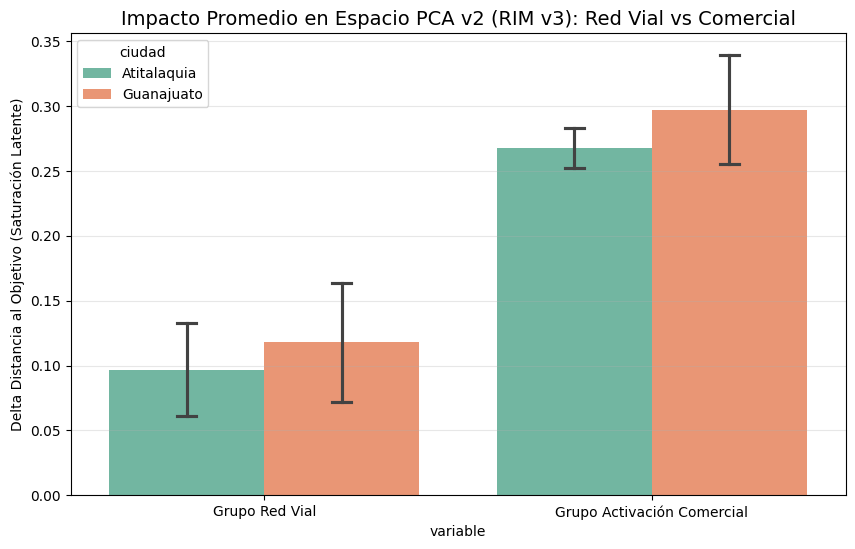

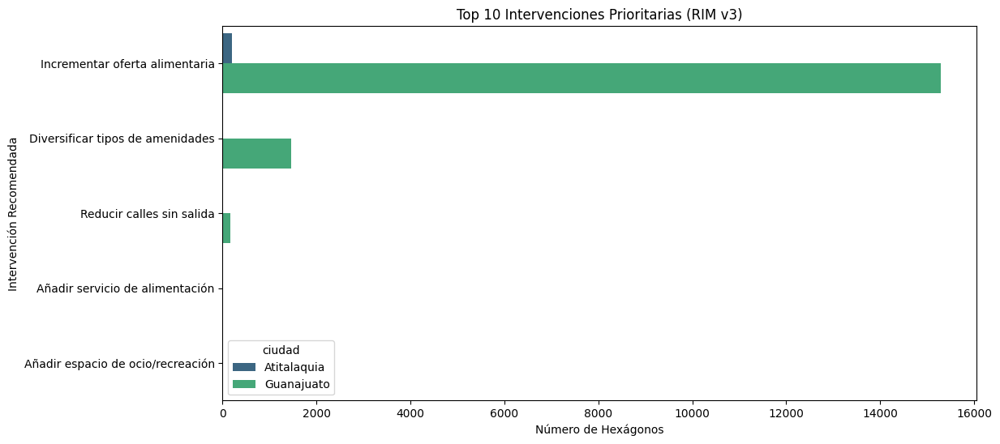

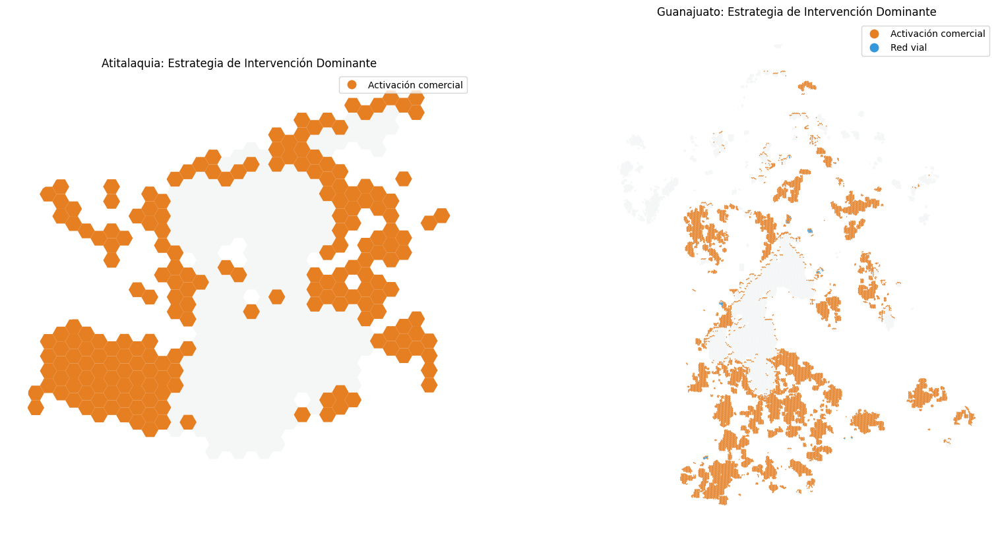

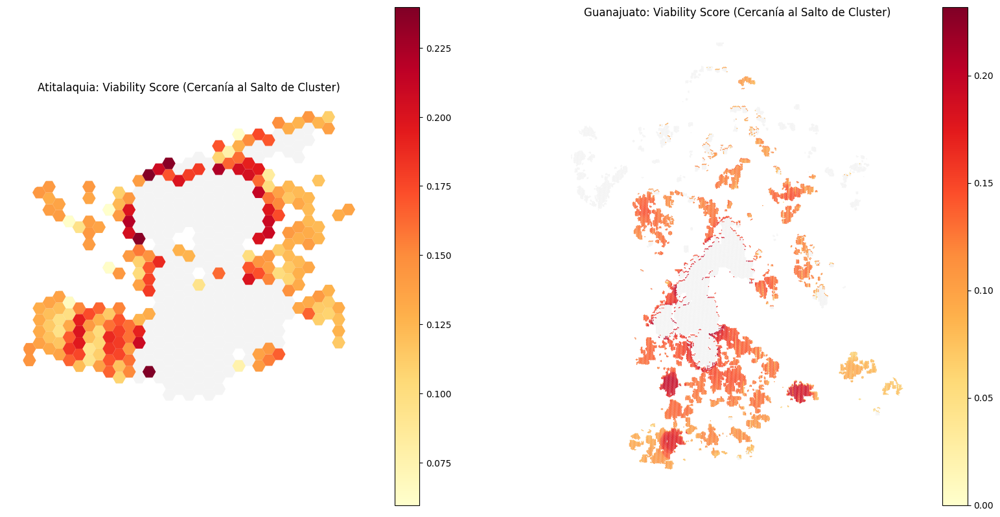

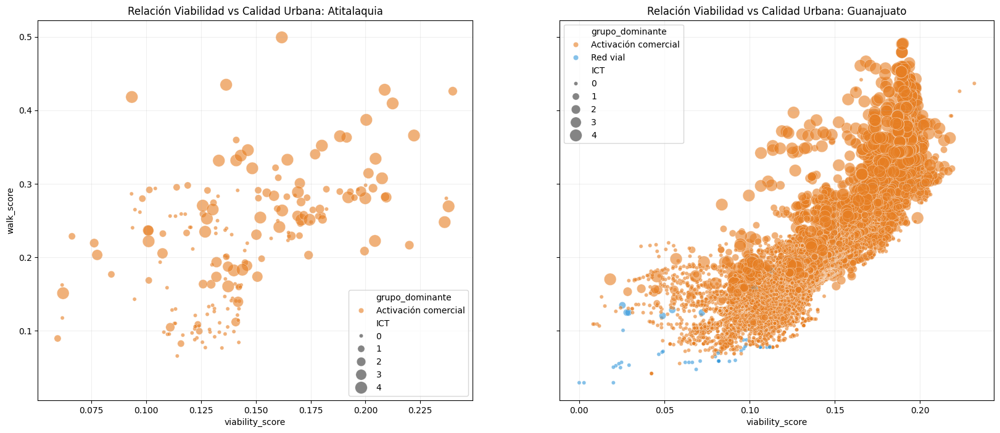

In [ ]:
# --- PASO 6: VISUALIZACIONES ---

# a) Bar chart impacto promedio por grupo
plt.figure(figsize=(10, 6))
impact_melt = df_rim_v3.melt(id_vars=['ciudad'], value_vars=['impacto_red_vial_total', 'impacto_comercial_total'])
sns.barplot(data=impact_melt, x='variable', y='value', hue='ciudad', capsize=.1, palette='Set2', errorbar='sd')
plt.title("Impacto Promedio en Espacio PCA v2 (RIM v3): Red Vial vs Comercial", fontsize=14)
plt.ylabel("Delta Distancia al Objetivo (Saturación Latente)")
plt.xticks([0, 1], ['Grupo Red Vial', 'Grupo Activación Comercial'])
plt.grid(axis='y', alpha=0.3)
plt.show()

# b) Top 10 intervenciones específicas más frecuentes
plt.figure(figsize=(12, 6))
sns.countplot(data=df_rim_v3, y='intervencion_1', hue='ciudad',
               order=df_rim_v3['intervencion_1'].value_counts().index[:10], palette='viridis')
plt.title("Top 10 Intervenciones Prioritarias (RIM v3)")
plt.xlabel("Número de Hexágonos")
plt.ylabel("Intervención Recomendada")
plt.show()

# c) Mapa de grupo_dominante
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
colors_map = {'Red vial': '#3498db', 'Activación comercial': '#e67e22'}
for i, city in enumerate(['Atitalaquia', 'Guanajuato']):
    target_gdf = gdf_ati_v2.copy() if city == 'Atitalaquia' else gdf_gto_v2.copy()
    target_gdf.plot(ax=axes[i], color='#ecf0f1', alpha=0.5)

    # Filtrar candidatos de la ciudad
    cands = df_rim_v3[df_rim_v3['ciudad'] == city]

    # Unir resultados al GDF. Usamos el nivel del MultiIndex que corresponde al índice original
    cands_subset = cands[['grupo_dominante']].reset_index(level=0, drop=True)
    cands_gdf = target_gdf.merge(cands_subset, left_index=True, right_index=True)

    if not cands_gdf.empty:
        # Graficar solo si hay datos para evitar errores con ListedColormap
        available_groups = sorted(cands_gdf['grupo_dominante'].unique())
        cands_gdf.plot(column='grupo_dominante', ax=axes[i], legend=True,
                       cmap=ListedColormap([colors_map[x] for x in available_groups]))

    axes[i].set_title(f"{city}: Estrategia de Intervención Dominante")
    axes[i].axis('off')
plt.show()

# d) Mapa de viability_score
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
for i, city in enumerate(['Atitalaquia', 'Guanajuato']):
    target_gdf = gdf_ati_v2.copy() if city == 'Atitalaquia' else gdf_gto_v2.copy()
    target_gdf.plot(ax=axes[i], color='#f4f4f4')

    cands = df_rim_v3[df_rim_v3['ciudad'] == city]
    cands_subset = cands[['viability_score']].reset_index(level=0, drop=True)
    cands_gdf = target_gdf.merge(cands_subset, left_index=True, right_index=True)

    if not cands_gdf.empty:
        cands_gdf.plot(column='viability_score', ax=axes[i], cmap='YlOrRd', legend=True)

    axes[i].set_title(f"{city}: Viability Score (Cercanía al Salto de Cluster)")
    axes[i].axis('off')
plt.show()

# f) Scatter viability_score vs walk_score
fig, axes = plt.subplots(1, 2, figsize=(20, 8), sharey=True)
for i, city in enumerate(['Atitalaquia', 'Guanajuato']):
    sns.scatterplot(data=df_rim_v3[df_rim_v3['ciudad'] == city],
                    x='viability_score', y='walk_score', hue='grupo_dominante',
                    size='ICT', sizes=(20, 200), alpha=0.6, ax=axes[i], palette=colors_map)
    axes[i].set_title(f"Relación Viabilidad vs Calidad Urbana: {city}")
    axes[i].grid(True, alpha=0.2)
plt.show()

In [ ]:
# --- PASO 7: TABLA TOP-20 POR CIUDAD ---
print("\n--- TOP 20 HEXÁGONOS ESTRATÉGICOS POR CIUDAD (RIM v3) ---")
cols_rep = ['walk_score', 'ICT', 'viability_score', 'viability_label', 'grupo_dominante', 'intervencion_1', 'delta_1', 'ciudad']

for city in ['Atitalaquia', 'Guanajuato']:
    print(f"\n=== Top 20: {city} ===")
    display(df_rim_v3[df_rim_v3['ciudad'] == city].sort_values('viability_score', ascending=False).head(20)[cols_rep])

# --- PASO 8: REPORTE ESTADÍSTICO FINAL ---
print("\n" + "="*60)
print("REPORTE EJECUTIVO FINAL - RECOMENDADOR RIM v3 (Espacio PCA v2)")
print("="*60)

for city in ['Atitalaquia', 'Guanajuato']:
    sub = df_rim_v3[df_rim_v3['ciudad'] == city]
    print(f"\n>>> ANÁLISIS: {city.upper()} <<<")
    print(f"  - Total Candidatos: {len(sub)} ({(len(sub)/len(df_total_v2[df_total_v2['ciudad']==city])*100):.1f}% de la ciudad)")
    print(f"  - Dominancia de Grupo: {sub['grupo_dominante'].value_counts(normalize=True).mul(100).round(1).to_dict()}")
    print(f"  - Impacto Vial Promedio: {sub['impacto_red_vial_total'].mean():.4f} (±{sub['impacto_red_vial_total'].std():.4f})")
    print(f"  - Impacto Comercial Promedio: {sub['impacto_comercial_total'].mean():.4f} (±{sub['impacto_comercial_total'].std():.4f})")

    t3 = sub['intervencion_1'].value_counts(normalize=True).head(3).mul(100).round(1).to_dict()
    print(f"  - Top 3 Intervenciones Prioritarias: {t3}")

    v_dist = sub['viability_label'].value_counts(normalize=True).mul(100).round(1).to_dict()
    print(f"  - Distribución de Viabilidad: {v_dist}")

    # Mejor candidato
    best = sub.loc[sub['viability_score'].idxmax()]
    print(f"\n  * HEXÁGONO ESTRATÉGICO PRINCIPAL (ID {best.name[1]}):")
    print(f"    - Walk Score Actual: {best['walk_score']:.2f} | ICT: {best['ICT']}")
    print(f"    - Viability Score: {best['viability_score']:.2f} ({best['viability_label']})")
    print(f"    - Grupo Dominante: {best['grupo_dominante']}")
    print(f"    - Acción Prioritaria: {best['intervencion_1']} (Delta: {best['delta_1']:.4f})")
    print(f"    - Acción Secundaria: {best['intervencion_2']} (Delta: {best['delta_2']:.4f})")


--- TOP 20 HEXÁGONOS ESTRATÉGICOS POR CIUDAD (RIM v3) ---

=== Top 20: Atitalaquia ===


walk_score  ICT  viability_score  \
Atitalaquia 99     0.425898    2         0.239828   
            114    0.269152    4         0.237928   
            154    0.280090    0         0.236896   
            93     0.247678    4         0.236119   
            253    0.365593    4         0.222139   
            80     0.216314    2         0.220031   
            329    0.409250    4         0.212411   
            345    0.281445    3         0.209514   
            346    0.282101    2         0.209011   
            86     0.427837    4         0.208776   
            133    0.307319    4         0.207560   
            292    0.333961    4         0.204620   
            79     0.222086    4         0.204344   
            311    0.293846    2         0.203450   
            325    0.314184    3         0.201385   
            303    0.386862    4         0.200378   
            33     0.297900    0         0.200076   
            172    0.280149    4         0.199934   
            81     0.208270    2         0.199571   
            347    0.289287    3         0.198002   

                             viability_label       grupo_dominante  \
Atitalaquia 99   Requiere intervención mayor  Activación comercial   
            114  Requiere intervención mayor  Activación comercial   
            154  Requiere intervención mayor  Activación comercial   
            93   Requiere intervención mayor  Activación comercial   
            253  Requiere intervención mayor  Activación comercial   
            80   Requiere intervención mayor  Activación comercial   
            329  Requiere intervención mayor  Activación comercial   
            345  Requiere intervención mayor  Activación comercial   
            346  Requiere intervención mayor  Activación comercial   
            86   Requiere intervención mayor  Activación comercial   
            133  Requiere intervención mayor  Activación comercial   
            292  Requiere intervención mayor  Activación comercial   
            79   Requiere intervención mayor  Activación comercial   
            311  Requiere intervención mayor  Activación comercial   
            325  Requiere intervención mayor  Activación comercial   
            303  Requiere intervención mayor  Activación comercial   
            33   Requiere intervención mayor  Activación comercial   
            172  Requiere intervención mayor  Activación comercial   
            81   Requiere intervención mayor  Activación comercial   
            347  Requiere intervención mayor  Activación comercial   

                                 intervencion_1   delta_1       ciudad  
Atitalaquia 99   Incrementar oferta alimentaria  0.138447  Atitalaquia  
            114  Incrementar oferta alimentaria  0.136244  Atitalaquia  
            154  Incrementar oferta alimentaria  0.125303  Atitalaquia  
            93   Incrementar oferta alimentaria  0.135519  Atitalaquia  
            253  Incrementar oferta alimentaria  0.125158  Atitalaquia  
            80   Incrementar oferta alimentaria  0.140256  Atitalaquia  
            329  Incrementar oferta alimentaria  0.120657  Atitalaquia  
            345  Incrementar oferta alimentaria  0.138506  Atitalaquia  
            346  Incrementar oferta alimentaria  0.133763  Atitalaquia  
            86   Incrementar oferta alimentaria  0.138124  Atitalaquia  
            133  Incrementar oferta alimentaria  0.131604  Atitalaquia  
            292  Incrementar oferta alimentaria  0.134136  Atitalaquia  
            79   Incrementar oferta alimentaria  0.140939  Atitalaquia  
            311  Incrementar oferta alimentaria  0.134422  Atitalaquia  
            325  Incrementar oferta alimentaria  0.126820  Atitalaquia  
            303  Incrementar oferta alimentaria  0.133310  Atitalaquia  
            33   Incrementar oferta alimentaria  0.142529  Atitalaquia  
            172  Incrementar oferta alimentaria  0.130422  Atitalaquia  
            81   Incrementar oferta alimentar


=== Top 20: Guanajuato ===


walk_score  ICT  viability_score  \
Guanajuato 22240    0.436474    0         0.231939   
           22239    0.425779    0         0.223300   
           14139    0.320473    1         0.218813   
           16313    0.392262    0         0.218522   
           16312    0.392338    0         0.218012   
           9743     0.362154    4         0.217605   
           16808    0.317002    2         0.216694   
           5147     0.323832    3         0.214393   
           9600     0.358791    4         0.214205   
           15473    0.346184    1         0.214086   
           15025    0.316992    2         0.213936   
           3236     0.310919    1         0.212363   
           22080    0.375326    4         0.211415   
           3237     0.309820    1         0.211352   
           5496     0.323590    3         0.211035   
           16316    0.367194    2         0.210691   
           14784    0.304682    2         0.210570   
           13899    0.336919    1         0.209331   
           14348    0.304688    2         0.208888   
           14992    0.381252    4         0.208770   

                              viability_label       grupo_dominante  \
Guanajuato 22240  Requiere intervención mayor  Activación comercial   
           22239  Requiere intervención mayor  Activación comercial   
           14139  Requiere intervención mayor  Activación comercial   
           16313  Requiere intervención mayor  Activación comercial   
           16312  Requiere intervención mayor  Activación comercial   
           9743   Requiere intervención mayor  Activación comercial   
           16808  Requiere intervención mayor  Activación comercial   
           5147   Requiere intervención mayor  Activación comercial   
           9600   Requiere intervención mayor  Activación comercial   
           15473  Requiere intervención mayor  Activación comercial   
           15025  Requiere intervención mayor  Activación comercial   
           3236   Requiere intervención mayor  Activación comercial   
           22080  Requiere intervención mayor  Activación comercial   
           3237   Requiere intervención mayor  Activación comercial   
           5496   Requiere intervención mayor  Activación comercial   
           16316  Requiere intervención mayor  Activación comercial   
           14784  Requiere intervención mayor  Activación comercial   
           13899  Requiere intervención mayor  Activación comercial   
           14348  Requiere intervención mayor  Activación comercial   
           14992  Requiere intervención mayor  Activación comercial   

                                  intervencion_1   delta_1      ciudad  
Guanajuato 22240  Incrementar oferta alimentaria  0.141940  Guanajuato  
           22239  Incrementar oferta alimentaria  0.141830  Guanajuato  
           14139  Incrementar oferta alimentaria  0.141722  Guanajuato  
           16313  Incrementar oferta alimentaria  0.138075  Guanajuato  
           16312  Incrementar oferta alimentaria  0.137807  Guanajuato  
           9743   Incrementar oferta alimentaria  0.143133  Guanajuato  
           16808  Incrementar oferta alimentaria  0.141997  Guanajuato  
           5147   Incrementar oferta alimentaria  0.142193  Guanajuato  
           9600   Incrementar oferta alimentaria  0.143077  Guanajuato  
           15473  Incrementar oferta alimentaria  0.142778  Guanajuato  
           15025  Incrementar oferta alimentaria  0.143896  Guanajuato  
           3236   Incrementar oferta alimentaria  0.144109  Guanajuato  
           22080  Incrementar oferta alimentaria  0.143517  Guanajuato  
           3237   Incrementar oferta alimentaria  0.144073  Guanajuato  
           5496   Incrementar oferta alimentaria  0.140841  Guanajuato  
           16316  Incrementar oferta alimentaria  0.139686  Guanajuato  
           14784  Incrementar oferta alimentaria  0.143841  Guanajuato  
           13899  Incrementar oferta alimentaria  0.141059  Guanajuato  
    


REPORTE EJECUTIVO FINAL - RECOMENDADOR RIM v3 (Espacio PCA v2)

>>> ANÁLISIS: ATITALAQUIA <<<
  - Total Candidatos: 199 (47.2% de la ciudad)
  - Dominancia de Grupo: {'Activación comercial': 100.0}
  - Impacto Vial Promedio: 0.0967 (±0.0360)
  - Impacto Comercial Promedio: 0.2675 (±0.0154)
  - Top 3 Intervenciones Prioritarias: {'Incrementar oferta alimentaria': 98.5, 'Diversificar tipos de amenidades': 1.5}
  - Distribución de Viabilidad: {'Requiere intervención mayor': 100.0, 'Potencial medio': 0.0, 'Alto potencial': 0.0}

  * HEXÁGONO ESTRATÉGICO PRINCIPAL (ID 99):
    - Walk Score Actual: 0.43 | ICT: 2
    - Viability Score: 0.24 (Requiere intervención mayor)
    - Grupo Dominante: Activación comercial
    - Acción Prioritaria: Incrementar oferta alimentaria (Delta: 0.1384)
    - Acción Secundaria: Mejorar conectividad vial (Delta: 0.0870)

>>> ANÁLISIS: GUANAJUATO <<<
  - Total Candidatos: 16935 (58.4% de la ciudad)
  - Dominancia de Grupo: {'Activación comercial': 99.6, 'Red via

In [ ]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import euclidean_distances
from matplotlib.colors import ListedColormap

# --- PASO 0: CONFIGURACIÓN ESTRATIFICADA ---
VARIABLES_RED_VIAL = {
    'intersection_density_ge3_1_2km': {'tipo': 'aumentar', 'delta': 10.0, 'etiqueta': 'Mejorar conectividad vial'},
    'average_link_length_1_2km':      {'tipo': 'reducir_pct', 'delta': 0.15, 'etiqueta': 'Reducir longitud de segmentos viales'},
    'cul_de_sac_ratio_1_2km':         {'tipo': 'reducir', 'delta': 0.10, 'etiqueta': 'Reducir calles sin salida'},
}

VARIABLES_ACTIVACION_COMERCIAL = {
    'dist_food_combined':      {'tipo': 'reducir_pct', 'delta': 0.30, 'etiqueta': 'Añadir servicio de alimentación'},
    'food_count_combined':     {'tipo': 'aumentar', 'delta': 5.0,  'etiqueta': 'Incrementar oferta alimentaria'},
    'dist_leisure_combined':   {'tipo': 'reducir_pct', 'delta': 0.30, 'etiqueta': 'Añadir espacio de ocio/recreación'},
    'leisure_count_combined':  {'tipo': 'aumentar', 'delta': 5.0,  'etiqueta': 'Incrementar oferta recreativa'},
    'amenity_diversity_inegi': {'tipo': 'aumentar', 'delta': 0.20, 'etiqueta': 'Diversificar tipos de amenidades'},
}

ALL_STRATIFIED = {**VARIABLES_RED_VIAL, **VARIABLES_ACTIVACION_COMERCIAL}
MAX_VALS_V2 = df_total_v2[FEATURES_V2].max()

# --- PASO 1: IDENTIFICACIÓN DINÁMICA Y CENTROIDES ---
# Asignar roles por perfiles con umbrales ajustados para evitar KeyErrors
roles_v2 = {}
for i, row in profiles_v2.iterrows():
    if row['intersection_density_ge3_1_2km'] > 150: roles_v2[i] = 'Núcleo urbano denso'
    elif row['dist_food_combined'] < 1500: roles_v2[i] = 'Zona periurbana' # Umbral más amplio
    elif row['dist_food_combined'] < 8000: roles_v2[i] = 'Periferia semi-urbana'
    else: roles_v2[i] = 'Periferia rural extrema'

inv_roles_v2 = {v: k for k, v in roles_v2.items()}
centroids_v2 = kmeans_v2.cluster_centers_

print(f"Roles identificados: {roles_v2}")

# --- PASO 2: CÁLCULO DE FRONTERA_SCORE ---
def calcular_frontera_score(df, x_pca, roles_dict, inv_roles_dict, centroids):
    target_cluster_name = 'Periferia semi-urbana'
    # Fallback lógico: Si no hay 'Zona periurbana', el objetivo es el 'Núcleo urbano denso'
    obj_cluster_name = 'Zona periurbana' if 'Zona periurbana' in inv_roles_dict else 'Núcleo urbano denso'

    if target_cluster_name not in inv_roles_dict:
        # Si la segmentación fue distinta, tomamos el cluster con dist_food intermedia
        print(f"Aviso: Rol '{target_cluster_name}' no hallado. Identificando cluster de transición automáticamente.")
        target_idx = profiles_v2['dist_food_combined'].sort_values().index[1] # El segundo más cercano
    else:
        target_idx = inv_roles_dict[target_cluster_name]

    o_idx = inv_roles_dict[obj_cluster_name]

    # Filtrar solo candidatos del cluster de origen
    mask = df['cluster_v2'] == target_idx
    cands_df = df[mask].copy()
    cands_pca = x_pca[mask]

    # Distancias a centroide propio y objetivo en espacio PCA
    dist_propio = np.linalg.norm(cands_pca - centroids[target_idx], axis=1)
    dist_objetivo = np.linalg.norm(cands_pca - centroids[o_idx], axis=1)

    cands_df['dist_propio'] = dist_propio
    cands_df['dist_objetivo'] = dist_objetivo
    cands_df['frontera_score'] = dist_propio / dist_objetivo

    return cands_df

df_cands_base = calcular_frontera_score(df_total_v2, X_pca_v2, roles_v2, inv_roles_v2, centroids_v2)

# Estadísticas de frontera_score
stats = df_cands_base['frontera_score'].describe(percentiles=[.1, .25, .5, .75, .9])
print("\nDistribución de frontera_score (Periferia seleccionada):")
print(stats.round(4))

# --- PASO 3: SELECCIÓN DE FRONTERIZOS ---
umbral_p75 = stats['75%']
df_frontera = df_cands_base[df_cands_base['frontera_score'] >= umbral_p75].copy()

print(f"\nCandidatos fronterizos seleccionados (P75 >= {umbral_p75:.4f}): {len(df_frontera)}")
for city in ['Atitalaquia', 'Guanajuato']:
    count = len(df_frontera[df_frontera['ciudad'] == city])
    base_city_count = len(df_cands_base[df_cands_base['ciudad'] == city])
    pct = (count / base_city_count * 100) if base_city_count > 0 else 0
    print(f"  - {city}: {count} celdas ({pct:.1f}% del cluster)")

Roles identificados: {0: 'Zona periurbana', 1: 'Periferia semi-urbana', 2: 'Periferia rural extrema', 3: 'Núcleo urbano denso'}

Distribución de frontera_score (Periferia seleccionada):
count    17134.0000
mean         0.4865
std          0.1604
min          0.0714
10%          0.2789
25%          0.3749
50%          0.4729
75%          0.5667
90%          0.7145
max          1.0000
Name: frontera_score, dtype: float64

Candidatos fronterizos seleccionados (P75 >= 0.5667): 4284
  - Atitalaquia: 156 celdas (78.4% del cluster)
  - Guanajuato: 4128 celdas (24.4% del cluster)


In [ ]:
# --- PASO 4: ANÁLISIS DE SENSIBILIDAD ESTRATIFICADO ---
def run_sensitivity_v4(df_sub, x_orig, scaler_m, pca_m, centroids, inv_roles_dict):
    # Ajuste robusto: Buscar 'Zona periurbana', si no existe, usar 'Núcleo urbano denso' como objetivo de salto
    obj_idx = inv_roles_dict.get('Zona periurbana', inv_roles_dict.get('Núcleo urbano denso'))
    if obj_idx is None:
        # Si ninguno existe, tomar el cluster con mayor densidad de intersecciones por defecto
        obj_idx = profiles_v2['intersection_density_ge3_1_2km'].idxmax()

    obj_centroid = centroids[obj_idx].reshape(1, -1)

    results = []
    X_vals = x_orig.loc[df_sub.index]

    for idx, row in df_sub.iterrows():
        orig_f = X_vals.loc[[idx]].values
        dist_obj_orig = row['dist_objetivo']

        impacts = {}
        for feat, config in ALL_STRATIFIED.items():
            f_idx = FEATURES_V2.index(feat)
            mod_f = orig_f.copy()

            if config['tipo'] == 'aumentar': mod_f[0, f_idx] += config['delta']
            elif config['tipo'] == 'reducir': mod_f[0, f_idx] -= config['delta']
            elif config['tipo'] == 'reducir_pct': mod_f[0, f_idx] *= (1 - config['delta'])

            mod_f[0, f_idx] = np.clip(mod_f[0, f_idx], 0, MAX_VALS_V2[feat])
            # Convertir a DataFrame para mantener nombres de columnas
            mod_f_df = pd.DataFrame(mod_f, columns=FEATURES_V2)
            new_pca = pca_m.transform(scaler_m.transform(mod_f_df))
            impacts[feat] = dist_obj_orig - np.linalg.norm(new_pca - obj_centroid)

        # Agregación
        imp_vial = {k: v for k, v in impacts.items() if k in VARIABLES_RED_VIAL}
        imp_com = {k: v for k, v in impacts.items() if k in VARIABLES_ACTIVACION_COMERCIAL}

        sorted_total = sorted(impacts.items(), key=lambda x: x[1], reverse=True)

        results.append({
            'top1_etiqueta': ALL_STRATIFIED[sorted_total[0][0]]['etiqueta'], 'delta_1': sorted_total[0][1],
            'top2_etiqueta': ALL_STRATIFIED[sorted_total[1][0]]['etiqueta'], 'delta_2': sorted_total[1][1],
            'top3_etiqueta': ALL_STRATIFIED[sorted_total[2][0]]['etiqueta'], 'delta_3': sorted_total[2][1],
            'impacto_red_vial_total': sum(imp_vial.values()),
            'impacto_comercial_total': sum(imp_com.values()),
            'grupo_dominante': 'Red vial' if sum(imp_vial.values()) > sum(imp_com.values()) else 'Activación comercial'
        })

    # Crear DataFrame de resultados con el mismo MultiIndex que el subconjunto de entrada
    results_df = pd.DataFrame(results, index=df_sub.index)
    return pd.concat([df_sub, results_df], axis=1)

# Ejecutar análisis sobre los fronterizos
df_frontera = run_sensitivity_v4(df_frontera, X_v2, scaler_v2, pca_v2, centroids_v2, inv_roles_v2)

# --- PASO 5: VIABILITY SCORE ---
dist_max_f = df_frontera['dist_objetivo'].max()
df_frontera['viability_score'] = 1 - (df_frontera['dist_objetivo'] / dist_max_f)
def label_v(s):
    if s >= 0.7: return 'Alto potencial'
    if s >= 0.4: return 'Potencial medio'
    return 'Requiere intervención mayor'
df_frontera['viability_label'] = df_frontera['viability_score'].apply(label_v)

# --- PASO 6: CLASIFICACIÓN RIM GLOBAL ---
def clasificar_rim(row, frontier_idx, roles_dict):
    role = roles_dict.get(row['cluster_v2'], 'Desconocido')
    if role == 'Núcleo urbano denso': return 'Consolidado'
    if role == 'Zona periurbana': return 'En desarrollo'
    if role == 'Periferia rural extrema': return 'Exclusión territorial'

    if row.name in frontier_idx:
        label = df_frontera.loc[row.name, 'viability_label']
        if label == 'Alto potencial': return 'Transición viable'
        if label == 'Potencial medio': return 'Transición con esfuerzo'
        return 'Fronterizo estructural'

    return 'Núcleo de periferia'

df_total_v2['rim_clasificacion'] = df_total_v2.apply(clasificar_rim, axis=1, frontier_idx=df_frontera.index, roles_dict=roles_v2)
print("\nClasificación RIM v4 completada.")


Clasificación RIM v4 completada.


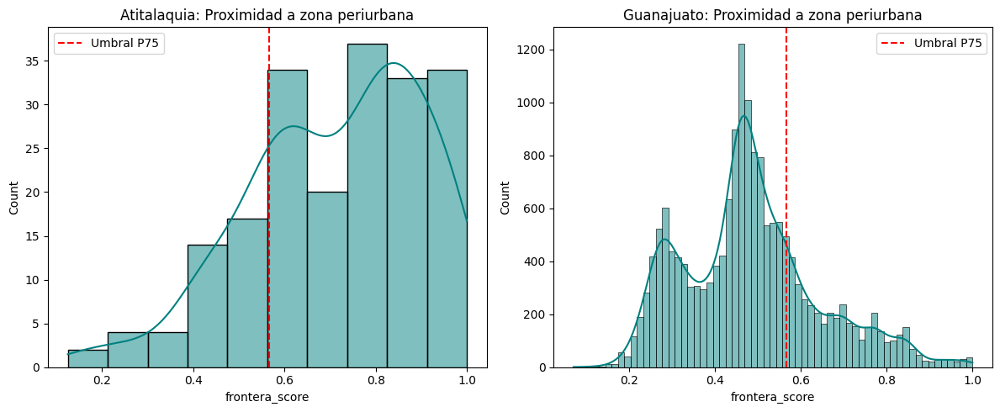

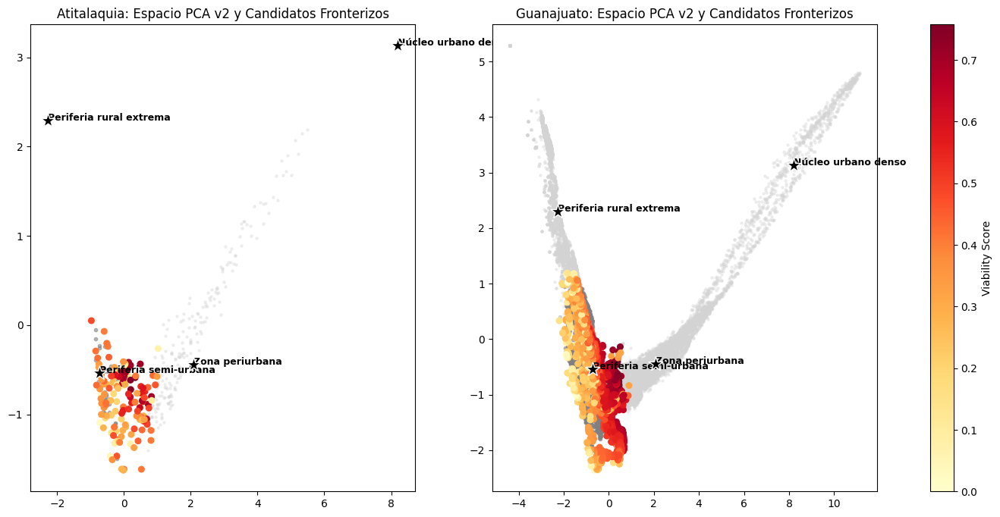

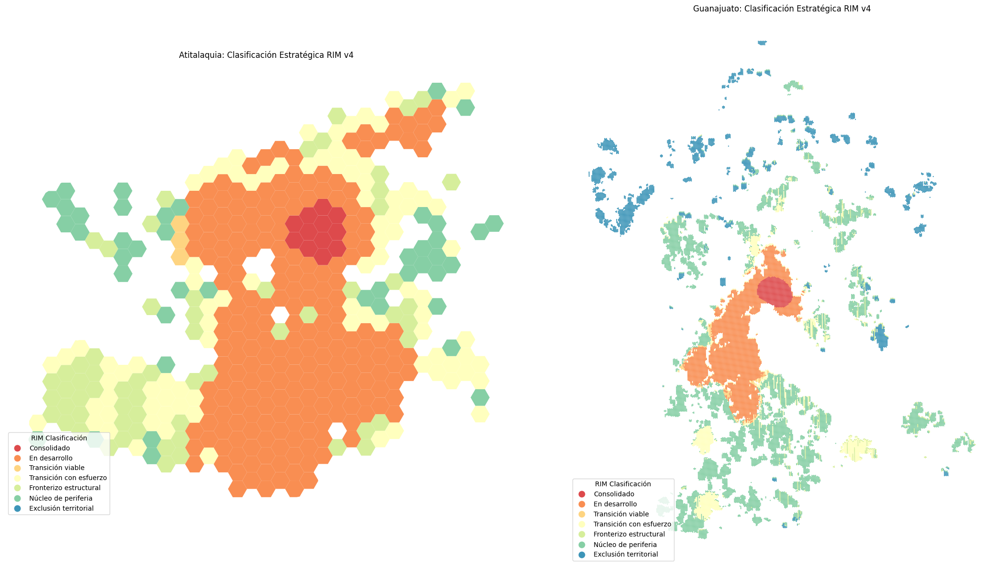

In [ ]:
# --- PASO 7: VISUALIZACIONES ---

# a) Distribución frontera_score
plt.figure(figsize=(12, 5))
for i, city in enumerate(['Atitalaquia', 'Guanajuato']):
    plt.subplot(1, 2, i+1)
    # Filtramos por ciudad en el MultiIndex
    data = df_cands_base.loc[city]['frontera_score']
    sns.histplot(data, kde=True, color='teal')
    plt.axvline(umbral_p75, color='red', linestyle='--', label='Umbral P75')
    plt.title(f"{city}: Proximidad a zona periurbana")
    plt.legend()
plt.tight_layout()
plt.show()

# b) Scatter PCA con fronterizos
fig, axes = plt.subplots(1, 2, figsize=(18, 8))
for i, city in enumerate(['Atitalaquia', 'Guanajuato']):
    ax = axes[i]
    mask_city = df_total_v2['ciudad'] == city
    ax.scatter(X_pca_v2[mask_city, 0], X_pca_v2[mask_city, 1], c='lightgrey', s=5, alpha=0.3)

    # Clasificación local para la ciudad
    mask_non_f = (df_total_v2['ciudad'] == city) & (df_total_v2['rim_clasificacion'] == 'Núcleo de periferia')
    ax.scatter(X_pca_v2[mask_non_f, 0], X_pca_v2[mask_non_f, 1], c='grey', s=10, alpha=0.5)

    # Fronterizos de la ciudad
    mask_f = df_frontera['ciudad'] == city
    city_frontera = df_frontera[mask_f]
    # Obtenemos las posiciones originales en el X_pca_v2 para estos candidatos
    idx_f = [df_total_v2.index.get_loc(idx) for idx in city_frontera.index]

    scatter = ax.scatter(X_pca_v2[idx_f, 0], X_pca_v2[idx_f, 1],
                         c=city_frontera['viability_score'], cmap='YlOrRd', s=30)

    for idx, pos in roles_v2.items():
        ax.scatter(centroids_v2[idx, 0], centroids_v2[idx, 1], marker='*', s=200, c='black', edgecolors='white', zorder=10)
        ax.text(centroids_v2[idx, 0], centroids_v2[idx, 1], pos, fontsize=9, fontweight='bold')

    ax.set_title(f"{city}: Espacio PCA v2 y Candidatos Fronterizos")

plt.colorbar(scatter, ax=axes, label='Viability Score')
plt.show()

# c) Mapa RIM Clasificación - CORRECCIÓN DE ÍNDICE
rim_palette = sns.color_palette("Spectral", 7)
rim_order = ['Consolidado', 'En desarrollo', 'Transición viable', 'Transición con esfuerzo', 'Fronterizo estructural', 'Núcleo de periferia', 'Exclusión territorial']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 12))
for i, (city, ax) in enumerate(zip(['Atitalaquia', 'Guanajuato'], [ax1, ax2])):
    gdf = gdf_ati.copy() if city == 'Atitalaquia' else gdf_gto.copy()

    # Extraer datos de la ciudad y resetear el índice del MultiIndex para que coincida con el GDF
    data_city = df_total_v2.loc[city][['rim_clasificacion']].reset_index()
    # Fusionar usando la columna 'index' recuperada del MultiIndex
    gdf_plot = gdf.merge(data_city, left_index=True, right_on='index')

    gdf_plot.plot(column='rim_clasificacion', categorical=True, legend=True, ax=ax,
                  cmap=ListedColormap(rim_palette), categories=rim_order,
                  legend_kwds={'title': "RIM Clasificación", 'loc': 'lower left'})
    ax.set_title(f"{city}: Clasificación Estratégica RIM v4")
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
print(f"Columns in df_total: {'walk_time_nearest' in df_total.columns}")
print(f"Columns in df_combined_geo: {'walk_time_nearest' in df_combined_geo.columns}")

# Display the first few rows of df_combined_geo to verify the time calculations
if 'walk_time_nearest' in df_combined_geo.columns:
    display(df_combined_geo[['city', 'subcluster', 'walk_time_nearest']].head())
else:
    print("The column is missing from both. We might need to re-run the time calculation steps.")

Columns in df_total: False
Columns in df_combined_geo: True


,city,subcluster,walk_time_nearest
0,Atitalaquia,0B — Periferia desarticulada,67.1
1,Atitalaquia,0B — Periferia desarticulada,60.7
2,Atitalaquia,0A — Red conectada sin servicios,49.0
3,Atitalaquia,0A — Red conectada sin servicios,43.5
4,Atitalaquia,0A — Red conectada sin servicios,39.5


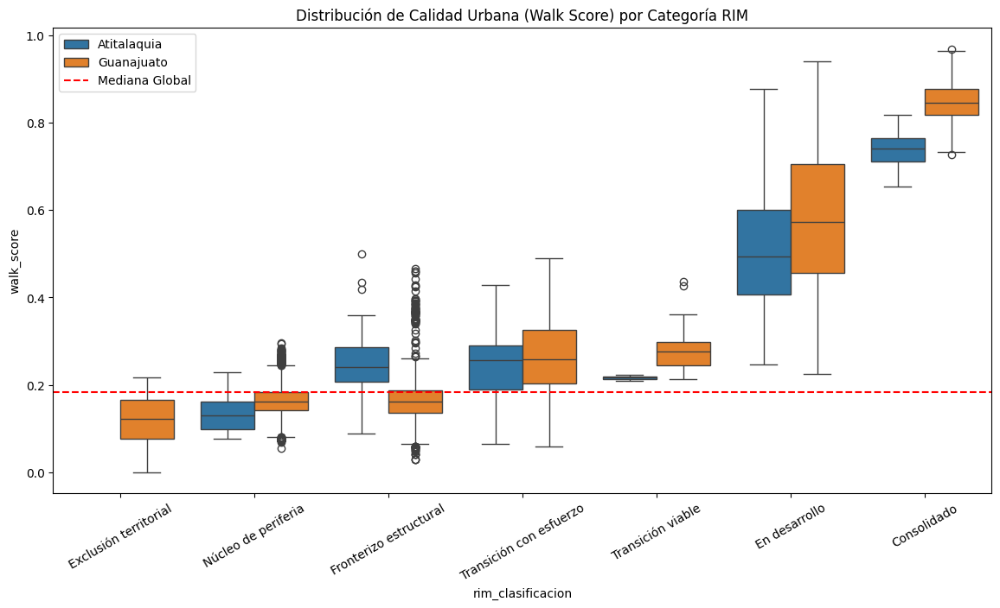

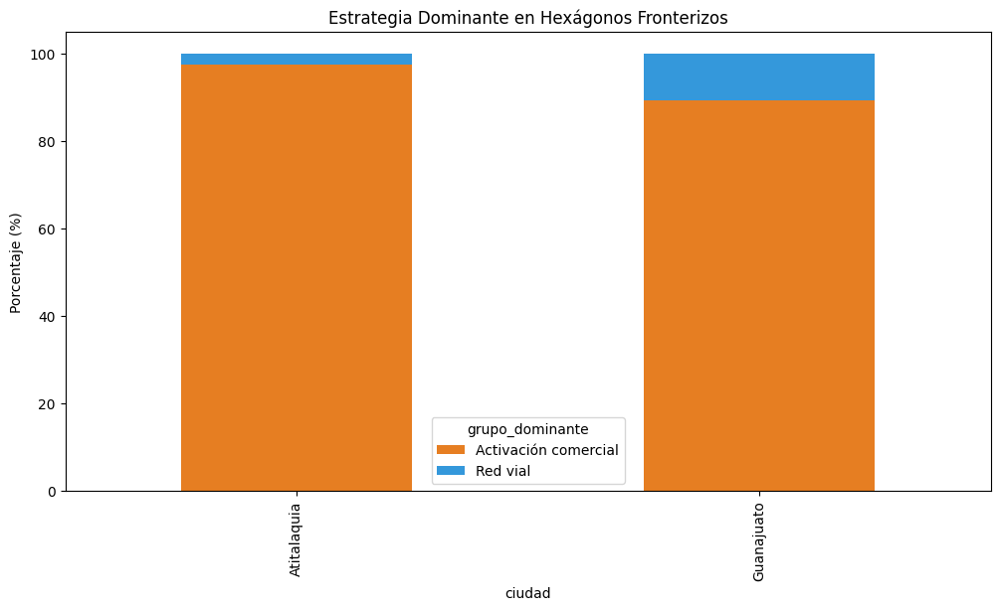


--- TOP 20 HEXÁGONOS FRONTERIZOS ESTRATÉGICOS ---


walk_score  ICT  frontera_score  viability_score  \
Guanajuato 15473    0.346184    1        0.995519         0.757617   
           3236     0.310919    1        0.975363         0.757152   
           3237     0.309820    1        0.976131         0.756842   
           15025    0.316992    2        0.953425         0.755165   
           7728     0.306585    1        0.992659         0.754457   
           17043    0.306676    2        0.988309         0.754111   
           17133    0.309945    2        0.997272         0.754048   
           7729     0.306133    1        0.980165         0.753331   
           17042    0.306566    2        0.993750         0.752545   
           17134    0.301381    2        0.979820         0.752399   
           7727     0.307762    1        0.979311         0.752239   
           8183     0.278740    0        0.985099         0.752115   
           7726     0.303913    1        0.983459         0.750221   
           17227    0.301728    2        0.964393         0.750010   
           14784    0.304682    2        0.922887         0.749985   
           16485    0.293979    0        0.995926         0.749874   
           17041    0.300633    2        0.999812         0.749424   
           7609     0.304216    1        0.978623         0.749348   
           15499    0.285174    0        0.958482         0.748172   
           17131    0.300927    2        0.984380         0.748164   

                       grupo_dominante                     top1_etiqueta  \
Guanajuato 15473  Activación comercial  Diversificar tipos de amenidades   
           3236   Activación comercial  Diversificar tipos de amenidades   
           3237   Activación comercial  Diversificar tipos de amenidades   
           15025  Activación comercial  Diversificar tipos de amenidades   
           7728   Activación comercial  Diversificar tipos de amenidades   
           17043  Activación comercial  Diversificar tipos de amenidades   
           17133  Activación comercial  Diversificar tipos de amenidades   
           7729   Activación comercial  Diversificar tipos de amenidades   
           17042  Activación comercial  Diversificar tipos de amenidades   
           17134  Activación comercial  Diversificar tipos de amenidades   
           7727   Activación comercial  Diversificar tipos de amenidades   
           8183   Activación comercial  Diversificar tipos de amenidades   
           7726   Activación comercial  Diversificar tipos de amenidades   
           17227  Activación comercial  Diversificar tipos de amenidades   
           14784  Activación comercial  Diversificar tipos de amenidades   
           16485  Activación comercial  Diversificar tipos de amenidades   
           17041  Activación comercial  Diversificar tipos de amenidades   
           7609   Activación comercial  Diversificar tipos de amenidades   
           15499  Activación comercial  Diversificar tipos de amenidades   
           17131  Activación comercial  Diversificar tipos de amenidades   

                   delta_1      ciudad  
Guanajuato 15473  0.137780  Guanajuato  
           3236   0.135713  Guanajuato  
           3237   0.133975  Guanajuato  
           15025  0.160234  Guanajuato  
           7728   0.139300  Guanajuato  
           17043  0.143253  Guanajuato  
           17133  0.140441  Guanajuato  
           7729   0.141041  Guanajuato  
           17042  0.138587  Guanajuato  
           17134  0.143006  Guanajuato  
           7727   0.140786  Guanajuato  
           8183   0.141547  Guanajuato  
           7726   0.137423  Guanajuato  
           17227  0.143232  Guanajuato  
           14784  0.159110  Guanajuato  
           16485  0.133420  Guanajuato  
           17041  0.134404  Guanajuato  
           7609   0.137261  Guanajuato  
           15499  0.149104  Guanajuato  
           17131  0.133291  Guanajuato


REPORTE EJECUTIVO FINAL - RIM v4 (ENFOQUE FRONTERIZO)

>>> ANÁLISIS: ATITALAQUIA <<<
  - Celdas en Periferia Semi-urbana: 199
  - Celdas Fronterizas Seleccionadas: 156 (78.4% del cluster)
  - Distribución RIM Clasificación: {'En desarrollo': 50.0, 'Transición con esfuerzo': 21.6, 'Fronterizo estructural': 14.7, 'Núcleo de periferia': 10.2, 'Consolidado': 2.8, 'Transición viable': 0.7}
  - Estrategia Dominante (Fronterizos): {'Activación comercial': 97.4, 'Red vial': 2.6}
  - Impacto Medio Delta: Vial=-0.0039 | Comercial=0.2112
  - Top 3 Intervenciones Específicas: {'Diversificar tipos de amenidades': 97.4, 'Reducir calles sin salida': 2.6}

>>> ANÁLISIS: GUANAJUATO <<<
  - Celdas en Periferia Semi-urbana: 16935
  - Celdas Fronterizas Seleccionadas: 4128 (24.4% del cluster)
  - Distribución RIM Clasificación: {'Núcleo de periferia': 44.1, 'En desarrollo': 24.1, 'Exclusión territorial': 14.5, 'Transición con esfuerzo': 10.1, 'Fronterizo estructural': 3.2, 'Consolidado': 3.0, 'Transición

In [ ]:
# d) Boxplot Walk Score
rim_order = ['Consolidado', 'En desarrollo', 'Transición viable', 'Transición con esfuerzo', 'Fronterizo estructural', 'Núcleo de periferia', 'Exclusión territorial']

# --- FIX: Mapear walk_time_nearest de df_combined_geo a df_total_v2 if missing ---
if 'walk_time_nearest' not in df_total_v2.columns and 'walk_time_nearest' in df_combined_geo.columns:
    df_total_v2['walk_time_nearest'] = df_combined_geo['walk_time_nearest'].values

plt.figure(figsize=(14, 7))
sns.boxplot(data=df_total_v2, x='rim_clasificacion', y='walk_score', hue='ciudad', order=rim_order[::-1])
plt.axhline(df_total_v2['walk_score'].median(), color='red', linestyle='--', label='Mediana Global')
plt.title("Distribución de Calidad Urbana (Walk Score) por Categoría RIM")
plt.xticks(rotation=30)
plt.legend()
plt.show()

# e) Bar chart dominancia fronterizos
plt.figure(figsize=(12, 6))
sub_f = df_frontera.groupby(['ciudad', 'grupo_dominante']).size().unstack(fill_value=0)
sub_f_pct = sub_f.div(sub_f.sum(axis=1), axis=0) * 100

sub_f_pct.plot(kind='bar', stacked=True, color=['#e67e22', '#3498db'], ax=plt.gca())
plt.title("Estrategia Dominante en Hexágonos Fronterizos")
plt.ylabel("Porcentaje (%)")
plt.show()

# --- PASO 8 & 9: TABLA Y REPORTE ---
print("\n--- TOP 20 HEXÁGONOS FRONTERIZOS ESTRATÉGICOS ---")
cols_rep = ['walk_score', 'ICT', 'frontera_score', 'viability_score', 'grupo_dominante', 'top1_etiqueta', 'delta_1', 'ciudad']
display(df_frontera.sort_values('viability_score', ascending=False).head(20)[cols_rep])

print("\n" + "="*70)
print("REPORTE EJECUTIVO FINAL - RIM v4 (ENFOQUE FRONTERIZO)")
print("="*70)

for city in ['Atitalaquia', 'Guanajuato']:
    sub_total = df_total_v2[df_total_v2['ciudad'] == city]
    sub_f = df_frontera[df_frontera['ciudad'] == city]
    base_cands = df_cands_base[df_cands_base['ciudad'] == city]

    print(f"\n>>> ANÁLISIS: {city.upper()} <<<")
    print(f"  - Celdas en Periferia Semi-urbana: {len(base_cands)}")

    perc_f = (len(sub_f) / len(base_cands) * 100) if len(base_cands) > 0 else 0
    print(f"  - Celdas Fronterizas Seleccionadas: {len(sub_f)} ({perc_f:.1f}% del cluster)")

    dist = sub_total['rim_clasificacion'].value_counts(normalize=True).mul(100).round(1).to_dict()
    print(f"  - Distribución RIM Clasificación: {dist}")

    if not sub_f.empty:
        dom = sub_f['grupo_dominante'].value_counts(normalize=True).mul(100).round(1).to_dict()
        print(f"  - Estrategia Dominante (Fronterizos): {dom}")

        imp_v = sub_f['impacto_red_vial_total'].mean()
        imp_c = sub_f['impacto_comercial_total'].mean()
        print(f"  - Impacto Medio Delta: Vial={imp_v:.4f} | Comercial={imp_c:.4f}")

        t3 = sub_f['top1_etiqueta'].value_counts(normalize=True).head(3).mul(100).round(1).to_dict()
        print(f"  - Top 3 Intervenciones Específicas: {t3}")

    excl = sub_total[sub_total['rim_clasificacion'] == 'Exclusión territorial']
    if not excl.empty:
        # Usar la columna mapeada para el hallazgo de exclusión
        print(f"  - HALLAZGO EXCLUSIÓN: {len(excl)} celdas ({len(excl)/len(sub_total)*100:.1f}%) | Mediana Walk Time: {excl['walk_time_nearest'].median():.1f} min")

In [ ]:
# =============================================================================
# CONSOLIDACIÓN FINAL DEL PIPELINE URBANO
# Unifica df_combined_geo (subclusters, tiempos, ICT) con df_total_v2
# (cluster_v2, rim_clasificacion, frontera_score) y exporta GeoPackages limpios
# =============================================================================
# Pega este script como una nueva celda al FINAL de tu notebook en Colab
# Todos los objetos necesarios ya deben estar en el entorno de la sesión
# =============================================================================

import pandas as pd
import numpy as np
import geopandas as gpd
import json
from datetime import date

# ── PASO 1: VERIFICAR QUE LOS OBJETOS CLAVE EXISTEN ─────────────────────────
print("=" * 60)
print("PASO 1 — Verificando objetos en el entorno")
print("=" * 60)

objetos_requeridos = {
    'gdf_ati':        'GeoDataFrame original Atitalaquia',
    'gdf_gto':        'GeoDataFrame original Guanajuato',
    'df_combined_geo':'DataFrame con subclusters, walk_time, ICT',
    'df_total_v2':    'DataFrame con cluster_v2, rim_clasificacion',
    'df_frontera':    'DataFrame con frontera_score y viability_score',
    'pca_v2':         'Modelo PCA v2',
    'scaler_v2':      'Scaler v2',
    'kmeans_v2':      'KMeans v2',
    'FEATURES_V2':    'Lista de features v2',
    'profiles_v2':    'Perfiles de clusters v2',
    'roles_v2':       'Diccionario de roles de clusters',
}

for nombre, descripcion in objetos_requeridos.items():
    existe = nombre in dir() or nombre in locals() or nombre in globals()
    estado = "✓" if existe else "✗ FALTANTE"
    print(f"  {estado}  {nombre}: {descripcion}")

print()

# ── PASO 2: EXTRAER COLUMNAS DE df_combined_geo ──────────────────────────────
print("=" * 60)
print("PASO 2 — Extrayendo columnas de df_combined_geo")
print("=" * 60)

# Columnas que viven en df_combined_geo y necesitamos recuperar
COLS_COMBINED_GEO = [
    'subcluster',
    'walk_time_food', 'walk_time_healthcare',
    'walk_time_educational', 'walk_time_leisure',
    'walk_time_nearest', 'walk_time_mean',
    'timecat_food', 'timecat_healthcare',
    'timecat_educational', 'timecat_leisure',
    'timecat_nearest',
    'ICT', 'ICT_label',
]

cols_disponibles = [c for c in COLS_COMBINED_GEO if c in df_combined_geo.columns]
cols_faltantes   = [c for c in COLS_COMBINED_GEO if c not in df_combined_geo.columns]

print(f"  Columnas disponibles en df_combined_geo: {len(cols_disponibles)}")
print(f"  Columnas faltantes: {cols_faltantes if cols_faltantes else 'ninguna'}")

# df_combined_geo tiene índice numérico (reset del concat)
# df_total_v2 tiene MultiIndex (Atitalaquia/Guanajuato, posición)
# La columna 'ciudad' en df_combined_geo mapea a la clave del MultiIndex
# Usamos la posición dentro de cada ciudad como llave de unión

df_combined_geo_reset = df_combined_geo.reset_index(drop=True)

# Separar por ciudad para hacer el mapeo correcto
ati_mask_cg  = df_combined_geo_reset['city'] == 'Atitalaquia'
gto_mask_cg  = df_combined_geo_reset['city'] == 'Guanajuato'

df_cg_ati = df_combined_geo_reset[ati_mask_cg][cols_disponibles].reset_index(drop=True)
df_cg_gto = df_combined_geo_reset[gto_mask_cg][cols_disponibles].reset_index(drop=True)

print(f"  Filas Atitalaquia en df_combined_geo: {len(df_cg_ati)}")
print(f"  Filas Guanajuato  en df_combined_geo: {len(df_cg_gto)}")
print()

# ── PASO 3: EXTRAER COLUMNAS DE df_total_v2 ──────────────────────────────────
print("=" * 60)
print("PASO 3 — Extrayendo columnas de df_total_v2")
print("=" * 60)

COLS_TOTAL_V2 = ['cluster_v2', 'rim_clasificacion']
cols_v2_disp = [c for c in COLS_TOTAL_V2 if c in df_total_v2.columns]
print(f"  Columnas disponibles: {cols_v2_disp}")

# df_total_v2 tiene MultiIndex — separar por ciudad
df_v2_ati = df_total_v2.loc['Atitalaquia', cols_v2_disp].reset_index(drop=True)
df_v2_gto = df_total_v2.loc['Guanajuato',  cols_v2_disp].reset_index(drop=True)

print(f"  Filas Atitalaquia en df_total_v2: {len(df_v2_ati)}")
print(f"  Filas Guanajuato  en df_total_v2: {len(df_v2_gto)}")
print()

# ── PASO 4: EXTRAER frontera_score Y viability DE df_frontera ────────────────
print("=" * 60)
print("PASO 4 — Extrayendo frontera_score y viability de df_frontera")
print("=" * 60)

COLS_FRONTERA = [
    'frontera_score', 'viability_score', 'viability_label',
    'grupo_dominante', 'top1_etiqueta', 'top2_etiqueta',
    'impacto_red_vial_total', 'impacto_comercial_total',
]
cols_front_disp = [c for c in COLS_FRONTERA if c in df_frontera.columns]
print(f"  Columnas disponibles en df_frontera: {cols_front_disp}")

# df_frontera tiene MultiIndex igual que df_total_v2
# Lo convertimos a mapeo por posición dentro de cada ciudad
front_cols_needed = ['ciudad'] + cols_front_disp if 'ciudad' in df_frontera.columns else cols_front_disp

# Crear Series de mapeo: índice posicional → valor de frontera_score
# df_frontera puede tener índice MultiIndex o no — manejamos ambos casos
if isinstance(df_frontera.index, pd.MultiIndex):
    df_front_ati = df_frontera.loc['Atitalaquia', cols_front_disp] if 'Atitalaquia' in df_frontera.index.get_level_values(0) else pd.DataFrame()
    df_front_gto = df_frontera.loc['Guanajuato',  cols_front_disp] if 'Guanajuato'  in df_frontera.index.get_level_values(0) else pd.DataFrame()
else:
    # Si tiene columna 'ciudad'
    if 'ciudad' in df_frontera.columns:
        df_front_ati = df_frontera[df_frontera['ciudad'] == 'Atitalaquia'][cols_front_disp]
        df_front_gto = df_frontera[df_frontera['ciudad'] == 'Guanajuato' ][cols_front_disp]
    else:
        # Fallback: el índice de df_frontera es posicional dentro de df_total_v2
        df_front_ati = pd.DataFrame()
        df_front_gto = pd.DataFrame()
        print("  AVISO: No se pudo separar df_frontera por ciudad — se intentará merge por índice")

print(f"  Fronterizos Atitalaquia: {len(df_front_ati)}")
print(f"  Fronterizos Guanajuato:  {len(df_front_gto)}")
print()

# ── PASO 5: CALCULAR COORDENADAS PCA v2 ──────────────────────────────────────
print("=" * 60)
print("PASO 5 — Calculando coordenadas PCA v2")
print("=" * 60)

def calcular_pca_coords(gdf_orig, scaler, pca, features):
    """Proyecta un GeoDataFrame al espacio PCA y devuelve las primeras 3 coords."""
    X = pd.DataFrame(gdf_orig).drop(columns='geometry', errors='ignore')
    # Reconstruir combined si no existen
    cats_all = ['food', 'healthcare', 'educational', 'leisure']
    for cat in cats_all:
        if f'dist_{cat}_combined' not in X.columns:
            X[f'dist_{cat}_combined'] = X[[f'dist_to_{cat}', f'dist_to_{cat}_inegi']].min(axis=1)
        if f'{cat}_count_combined' not in X.columns:
            X[f'{cat}_count_combined'] = X[[f'{cat}_osm_count_1_2km', f'{cat}_inegi_count_1_2km']].max(axis=1)
    if 'info_gap' not in X.columns:
        osm_d  = [f'dist_to_{c}' for c in cats_all]
        inegi_d = [f'dist_to_{c}_inegi' for c in cats_all]
        X['info_gap'] = (X[osm_d].mean(axis=1) - X[inegi_d].mean(axis=1)).abs()

    X_feat = X[features].fillna(X[features].median())
    coords = pca.transform(scaler.transform(X_feat))
    return coords[:, 0], coords[:, 1], coords[:, 2]

pc1_ati, pc2_ati, pc3_ati = calcular_pca_coords(gdf_ati, scaler_v2, pca_v2, FEATURES_V2)
pc1_gto, pc2_gto, pc3_gto = calcular_pca_coords(gdf_gto, scaler_v2, pca_v2, FEATURES_V2)
print("  Coordenadas PCA v2 calculadas correctamente.")
print()

# ── PASO 6: CONSTRUIR GeoDataFrames FINALES ───────────────────────────────────
print("=" * 60)
print("PASO 6 — Construyendo GeoDataFrames finales")
print("=" * 60)

def construir_gdf_final(gdf_orig, df_cg, df_v2, df_front,
                        pc1, pc2, pc3, roles_dict, ciudad_nombre):
    """
    Une todas las capas del pipeline en un GeoDataFrame limpio.
    Todos los DataFrames de entrada deben estar ordenados por posición
    (reset_index aplicado previamente).
    """
    n = len(gdf_orig)
    assert len(df_cg) == n,  f"df_combined_geo tiene {len(df_cg)} filas, esperaba {n}"
    assert len(df_v2) == n,  f"df_total_v2 tiene {len(df_v2)} filas, esperaba {n}"
    assert len(pc1)  == n,   f"pc1 tiene {len(pc1)} elementos, esperaba {n}"

    gdf = gdf_orig.copy().reset_index(drop=True)

    # — Columnas combined base (reconstruir si no existen) —
    cats_all = ['food', 'healthcare', 'educational', 'leisure']
    for cat in cats_all:
        if f'dist_{cat}_combined' not in gdf.columns:
            gdf[f'dist_{cat}_combined'] = gdf[[f'dist_to_{cat}', f'dist_to_{cat}_inegi']].min(axis=1)
        if f'{cat}_count_combined' not in gdf.columns:
            gdf[f'{cat}_count_combined'] = gdf[[f'{cat}_osm_count_1_2km', f'{cat}_inegi_count_1_2km']].max(axis=1)
    if 'info_gap' not in gdf.columns:
        osm_d   = [f'dist_to_{c}' for c in cats_all]
        inegi_d = [f'dist_to_{c}_inegi' for c in cats_all]
        gdf['info_gap'] = (gdf[osm_d].mean(axis=1) - gdf[inegi_d].mean(axis=1)).abs()

    # — Walk score (recalcular si no existe) —
    if 'walk_score' not in gdf.columns:
        print(f"  AVISO: walk_score no encontrado en {ciudad_nombre}, recalculando...")
        from sklearn.preprocessing import StandardScaler as _SS
        for cat in cats_all:
            p95 = gdf[f'{cat}_count_combined'].quantile(0.95)
            gdf[f'score_dist_{cat}'] = np.exp(-gdf[f'dist_{cat}_combined'] / 400)
            gdf[f'score_count_{cat}'] = (np.log1p(gdf[f'{cat}_count_combined']) /
                                          np.log1p(p95) if p95 > 0 else 0)
            gdf[f'score_access_{cat}'] = (0.4 * gdf[f'score_dist_{cat}'] +
                                           0.6 * gdf[f'score_count_{cat}'])
        gdf['accessibility_score'] = gdf[[f'score_access_{c}' for c in cats_all]].mean(axis=1).clip(0,1)
        p95_i = gdf['intersection_density_ge3_1_2km'].quantile(0.95)
        p95_l = gdf['average_link_length_1_2km'].quantile(0.95)
        gdf['norm_intersec'] = (gdf['intersection_density_ge3_1_2km'] / p95_i).clip(0,1)
        gdf['norm_link']     = (1 - gdf['average_link_length_1_2km'] / p95_l).clip(0,1)
        gdf['norm_cul']      = (1 - gdf['cul_de_sac_ratio_1_2km']).clip(0,1)
        gdf['connectivity_score'] = gdf[['norm_intersec','norm_link','norm_cul']].mean(axis=1).clip(0,1)
        p95_g = gdf['info_gap'].quantile(0.95)
        gdf['gap_norm']   = (gdf['info_gap'] / p95_g).clip(0,1) if p95_g > 0 else 0
        gdf['confidence'] = (1 - 0.3 * gdf['gap_norm']).clip(0,1)
        gdf['walk_score'] = (0.65 * gdf['accessibility_score'] +
                              0.35 * gdf['connectivity_score']) * gdf['confidence']
        gdf['walk_score'] = gdf['walk_score'].clip(0,1)

    # — Columnas de df_combined_geo (subclusters, tiempos, ICT) —
    for col in df_cg.columns:
        gdf[col] = df_cg[col].values

    # — Columnas de df_total_v2 (cluster_v2, rim_clasificacion) —
    for col in df_v2.columns:
        gdf[col] = df_v2[col].values

    # — Etiqueta de cluster_v2 —
    gdf['cluster_v2_label'] = gdf['cluster_v2'].map(roles_dict)

    # — Coordenadas PCA v2 —
    gdf['pc1_v2'] = pc1
    gdf['pc2_v2'] = pc2
    gdf['pc3_v2'] = pc3

    # — Columnas del RIM v4 (solo para fronterizos, NaN para el resto) —
    rim_cols = ['frontera_score', 'viability_score', 'viability_label',
                'grupo_dominante', 'intervencion_1', 'intervencion_2',
                'impacto_red_vial_total', 'impacto_comercial_total']

    for col in rim_cols:
        gdf[col] = np.nan

    if df_front is not None and len(df_front) > 0:
        # df_front tiene índice posicional dentro del df_total_v2 de la ciudad
        # Necesitamos mapear ese índice posicional al índice del gdf
        front_reset = df_front.reset_index(drop=True) if not isinstance(df_front.index, pd.MultiIndex) else df_front.reset_index(level=0, drop=True).reset_index()

        col_map = {
            'frontera_score':           'frontera_score',
            'viability_score':          'viability_score',
            'viability_label':          'viability_label',
            'grupo_dominante':          'grupo_dominante',
            'top1_etiqueta':            'intervencion_1',
            'top2_etiqueta':            'intervencion_2',
            'impacto_red_vial_total':   'impacto_red_vial_total',
            'impacto_comercial_total':  'impacto_comercial_total',
        }

        # El índice de df_front (nivel 1 del MultiIndex) es la posición en df_total_v2
        # que coincide con la posición en gdf después del reset_index
        if isinstance(df_front.index, pd.MultiIndex):
            posiciones = df_front.index.get_level_values(1)
        else:
            posiciones = df_front.index

        for src_col, dst_col in col_map.items():
            if src_col in df_front.columns:
                for pos, val in zip(posiciones, df_front[src_col].values):
                    if pos < len(gdf):
                        gdf.at[pos, dst_col] = val

    return gdf

# Construir GDF final para cada ciudad
print(f"  Construyendo GDF final para Atitalaquia...")
gdf_ati_final = construir_gdf_final(
    gdf_orig       = gdf_ati,
    df_cg          = df_cg_ati,
    df_v2          = df_v2_ati,
    df_front       = df_front_ati if len(df_front_ati) > 0 else None,
    pc1=pc1_ati, pc2=pc2_ati, pc3=pc3_ati,
    roles_dict     = roles_v2,
    ciudad_nombre  = 'Atitalaquia'
)
print(f"  ✓ Atitalaquia: {gdf_ati_final.shape}")

print(f"  Construyendo GDF final para Guanajuato...")
gdf_gto_final = construir_gdf_final(
    gdf_orig       = gdf_gto,
    df_cg          = df_cg_gto,
    df_v2          = df_v2_gto,
    df_front       = df_front_gto if len(df_front_gto) > 0 else None,
    pc1=pc1_gto, pc2=pc2_gto, pc3=pc3_gto,
    roles_dict     = roles_v2,
    ciudad_nombre  = 'Guanajuato'
)
print(f"  ✓ Guanajuato: {gdf_gto_final.shape}")
print()

# ── PASO 7: VALIDACIÓN ───────────────────────────────────────────────────────
print("=" * 60)
print("PASO 7 — Validación de integridad")
print("=" * 60)

for nombre, gdf in [('Atitalaquia', gdf_ati_final), ('Guanajuato', gdf_gto_final)]:
    print(f"\n  === {nombre} ===")
    print(f"  Shape: {gdf.shape}")
    print(f"  CRS: {gdf.crs}")
    print(f"  Geometrías nulas: {gdf.geometry.isnull().sum()}")

    # Columnas críticas con sus NaNs esperados
    cols_check = {
        'walk_score':       'debe ser 0',
        'subcluster':       'debe ser 0',
        'walk_time_nearest':'debe ser 0',
        'ICT':              'debe ser 0',
        'cluster_v2':       'debe ser 0',
        'rim_clasificacion':'debe ser 0',
        'cluster_v2_label': 'debe ser 0',
        'frontera_score':   'NaN esperado en no-candidatos',
        'viability_score':  'NaN esperado en no-candidatos',
    }
    print("  NaNs por columna crítica:")
    for col, nota in cols_check.items():
        if col in gdf.columns:
            n_nan = gdf[col].isnull().sum()
            ok = "✓" if (n_nan == 0 and 'debe ser 0' in nota) or 'esperado' in nota else "✗"
            print(f"    {ok} {col}: {n_nan} NaNs ({nota})")
        else:
            print(f"    ✗ {col}: COLUMNA NO ENCONTRADA")

    print(f"  Walk score: min={gdf['walk_score'].min():.3f}, "
          f"max={gdf['walk_score'].max():.3f}, "
          f"med={gdf['walk_score'].median():.3f}")
    print(f"  Clusters v2: {gdf['cluster_v2_label'].value_counts().to_dict()}")
    print(f"  RIM clasificación: {gdf['rim_clasificacion'].value_counts().to_dict()}")

# ── PASO 8: RE-PROYECTAR A EPSG:4326 SI ES NECESARIO ─────────────────────────
print()
print("=" * 60)
print("PASO 8 — Proyección CRS")
print("=" * 60)

for nombre, gdf in [('Atitalaquia', gdf_ati_final), ('Guanajuato', gdf_gto_final)]:
    if gdf.crs is None:
        print(f"  AVISO: {nombre} no tiene CRS definido, asignando EPSG:4326")
        gdf.set_crs(epsg=4326, inplace=True)
    elif gdf.crs.to_epsg() != 4326:
        print(f"  Re-proyectando {nombre} de {gdf.crs.to_epsg()} a EPSG:4326")
        if nombre == 'Atitalaquia':
            gdf_ati_final = gdf.to_crs(epsg=4326)
        else:
            gdf_gto_final = gdf.to_crs(epsg=4326)
    else:
        print(f"  ✓ {nombre}: ya en EPSG:4326")

# ── PASO 9: SELECCIONAR Y ORDENAR COLUMNAS FINALES ───────────────────────────
print()
print("=" * 60)
print("PASO 9 — Esquema de columnas final")
print("=" * 60)

SCHEMA_FINAL = [
    # Geometría
    'geometry',
    # Identificadores
    'id', 'NOMGEO', 'CVEGEO', 'CVE_ENT', 'CVE_MUN', 'CVE_MET', 'NOM_MET', 'TIPO_MET', 'area',
    # Datos combinados OSM + INEGI
    'dist_food_combined', 'dist_healthcare_combined',
    'dist_educational_combined', 'dist_leisure_combined',
    'food_count_combined', 'healthcare_count_combined',
    'educational_count_combined', 'leisure_count_combined',
    'info_gap',
    # Red vial
    'average_link_length_1_2km', 'intersection_density_ge3_1_2km',
    'cul_de_sac_ratio_1_2km', 'network_density_1_2km',
    # Contexto
    'amenity_diversity_inegi', 'population_count_1_2km',
    # Clusters v2
    'cluster_v2', 'cluster_v2_label',
    # Sub-clasificación
    'subcluster',
    # Walk score
    'walk_score', 'accessibility_score', 'connectivity_score', 'confidence',
    # Tiempos de caminata
    'walk_time_food', 'walk_time_healthcare',
    'walk_time_educational', 'walk_time_leisure',
    'walk_time_nearest', 'walk_time_mean',
    # Categorías temporales
    'timecat_food', 'timecat_healthcare',
    'timecat_educational', 'timecat_leisure', 'timecat_nearest',
    # ICT
    'ICT', 'ICT_label',
    # RIM v4
    'frontera_score', 'viability_score', 'viability_label',
    'grupo_dominante', 'intervencion_1', 'intervencion_2',
    'impacto_red_vial_total', 'impacto_comercial_total',
    'rim_clasificacion',
    # Coordenadas PCA v2
    'pc1_v2', 'pc2_v2', 'pc3_v2',
]

def aplicar_schema(gdf, schema, nombre):
    cols_presentes  = [c for c in schema if c in gdf.columns]
    cols_faltantes_ = [c for c in schema if c not in gdf.columns]
    if cols_faltantes_:
        print(f"  AVISO {nombre}: columnas no encontradas → {cols_faltantes_}")
        for c in cols_faltantes_:
            gdf[c] = np.nan
    return gdf[schema]

gdf_ati_final = aplicar_schema(gdf_ati_final, SCHEMA_FINAL, 'Atitalaquia')
gdf_gto_final = aplicar_schema(gdf_gto_final, SCHEMA_FINAL, 'Guanajuato')
print(f"  ✓ Atitalaquia: {gdf_ati_final.shape[1]} columnas")
print(f"  ✓ Guanajuato:  {gdf_gto_final.shape[1]} columnas")

# ── PASO 10: EXPORTAR ─────────────────────────────────────────────────────────
print()
print("=" * 60)
print("PASO 10 — Exportando archivos")
print("=" * 60)

# Convertir columnas categóricas a string para compatibilidad con GPKG
for gdf in [gdf_ati_final, gdf_gto_final]:
    for col in gdf.select_dtypes(include='category').columns:
        gdf[col] = gdf[col].astype(str)

archivos = {
    'Atitalaquia_urban_analysis_final.gpkg': gdf_ati_final,
    'Guanajuato_urban_analysis_final.gpkg':  gdf_gto_final,
}

for fname, gdf in archivos.items():
    gdf.to_file(fname, driver='GPKG')
    import os
    size_mb = os.path.getsize(fname) / 1_048_576
    print(f"  ✓ {fname}: {size_mb:.2f} MB")

# CSV sin geometría
gdf_ati_final.drop(columns='geometry').to_csv(
    'Atitalaquia_urban_analysis_final.csv', index=False)
gdf_gto_final.drop(columns='geometry').to_csv(
    'Guanajuato_urban_analysis_final.csv', index=False)
print("  ✓ CSVs exportados")

# ── PASO 11: RESUMEN COMPARATIVO CORREGIDO ────────────────────────────────────
print()
print("=" * 60)
print("PASO 11 — Resumen comparativo entre ciudades")
print("=" * 60)

resumen = {}
for nombre, gdf in [('Atitalaquia', gdf_ati_final), ('Guanajuato', gdf_gto_final)]:
    wtn = pd.to_numeric(gdf['walk_time_nearest'], errors='coerce')
    ws  = pd.to_numeric(gdf['walk_score'], errors='coerce')

    resumen[nombre] = {
        'N hexágonos':                  len(gdf),
        'Walk score mediano':            round(ws.median(), 3),
        '% Muy accesible (<5 min)':     round((wtn < 5).mean() * 100, 1),
        '% Accesible (<10 min)':        round((wtn < 10).mean() * 100, 1),
        '% No caminable (>45 min)':     round((wtn > 45).mean() * 100, 1),
        '% Exclusión severa (>120 min)':round((wtn > 120).mean() * 100, 1),
        'N Transición viable':          (gdf['rim_clasificacion'] == 'Transición viable').sum(),
        'N Exclusión territorial':      (gdf['rim_clasificacion'] == 'Exclusión territorial').sum(),
    }

df_resumen = pd.DataFrame(resumen)
print(df_resumen.to_string())

print()
print("Distribución RIM por ciudad:")
for nombre, gdf in [('Atitalaquia', gdf_ati_final), ('Guanajuato', gdf_gto_final)]:
    print(f"\n  {nombre}:")
    dist = gdf['rim_clasificacion'].value_counts()
    pct  = (dist / len(gdf) * 100).round(1)
    for cat in dist.index:
        print(f"    {cat}: {dist[cat]} ({pct[cat]}%)")

# ── PASO 12: EXPORTAR METADATOS JSON ──────────────────────────────────────────
print()
print("=" * 60)
print("PASO 12 — Exportando metadatos JSON")
print("=" * 60)

def to_native(obj):
    """Convierte tipos numpy a tipos Python nativos para serialización JSON."""
    if isinstance(obj, (np.integer,)):  return int(obj)
    if isinstance(obj, (np.floating,)): return float(obj)
    if isinstance(obj, (np.ndarray,)):  return obj.tolist()
    return obj

metadatos = {
    'version':           'v4',
    'fecha_analisis':    str(date.today()),
    'ciudades':          ['Atitalaquia', 'Guanajuato'],
    'features_v2':       FEATURES_V2,
    'n_componentes_pca': to_native(pca_v2.n_components_),
    'varianza_explicada_pca': [to_native(v) for v in pca_v2.explained_variance_ratio_],
    'k_kmeans':          to_native(kmeans_v2.n_clusters),
    'clusters_v2':       {str(k): v for k, v in roles_v2.items()},
    'walk_score_params': {
        'velocidad_peatonal_m_min': 75,
        'umbral_decaimiento_m':     400,
        'peso_accesibilidad':       0.65,
        'peso_conectividad':        0.35,
        'penalizacion_max_gap':     0.30,
    },
    'rim_v4': {
        'umbral_frontera_percentil': 75,
        'cluster_objetivo':          'Zona periurbana',
        'n_fronterizos_atitalaquia': to_native(
            (gdf_ati_final['frontera_score'].notna() &
             gdf_ati_final['rim_clasificacion'].isin(
                 ['Transición viable', 'Transición con esfuerzo', 'Fronterizo estructural']
             )).sum()),
        'n_fronterizos_guanajuato':  to_native(
            (gdf_gto_final['frontera_score'].notna() &
             gdf_gto_final['rim_clasificacion'].isin(
                 ['Transición viable', 'Transición con esfuerzo', 'Fronterizo estructural']
             )).sum()),
    },
    'resumen_ciudades': {
        k: {kk: to_native(vv) for kk, vv in v.items()}
        for k, v in resumen.items()
    },
    'hallazgos_clave': [
        'Exclusión territorial Guanajuato: 14.5% hexágonos con walk_time mediana 193 min',
        'Núcleo urbano denso: 92.8% hexágonos con acceso < 5 min al servicio más cercano',
        'Clusters bien separados reflejan discontinuidad estructural urbana en México',
        'Intervención prioritaria en fronterizos: Diversificar tipos de amenidades',
        'PCA v2 excluye variables institucionales (healthcare/educational) para RIM urbanísticamente honesto',
    ]
}

with open('pipeline_metadata_v4.json', 'w', encoding='utf-8') as f:
    json.dump(metadatos, f, ensure_ascii=False, indent=2)

print("  ✓ pipeline_metadata_v4.json exportado")
print()
print("=" * 60)
print("CONSOLIDACIÓN COMPLETADA")
print("Archivos generados:")
print("  • Atitalaquia_urban_analysis_final.gpkg")
print("  • Guanajuato_urban_analysis_final.gpkg")
print("  • Atitalaquia_urban_analysis_final.csv")
print("  • Guanajuato_urban_analysis_final.csv")
print("  • pipeline_metadata_v4.json")
print("=" * 60)

PASO 1 — Verificando objetos en el entorno
  ✓  gdf_ati: GeoDataFrame original Atitalaquia
  ✓  gdf_gto: GeoDataFrame original Guanajuato
  ✓  df_combined_geo: DataFrame con subclusters, walk_time, ICT
  ✓  df_total_v2: DataFrame con cluster_v2, rim_clasificacion
  ✓  df_frontera: DataFrame con frontera_score y viability_score
  ✓  pca_v2: Modelo PCA v2
  ✓  scaler_v2: Scaler v2
  ✓  kmeans_v2: KMeans v2
  ✓  FEATURES_V2: Lista de features v2
  ✓  profiles_v2: Perfiles de clusters v2
  ✓  roles_v2: Diccionario de roles de clusters

PASO 2 — Extrayendo columnas de df_combined_geo
  Columnas disponibles en df_combined_geo: 14
  Columnas faltantes: ninguna
  Filas Atitalaquia en df_combined_geo: 422
  Filas Guanajuato  en df_combined_geo: 29023

PASO 3 — Extrayendo columnas de df_total_v2
  Columnas disponibles: ['cluster_v2', 'rim_clasificacion']
  Filas Atitalaquia en df_total_v2: 422
  Filas Guanajuato  en df_total_v2: 29023

PASO 4 — Extrayendo frontera_score y viability de df_fronter

/tmp/ipykernel_947/537756895.py:273: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Potencial medio' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  gdf.at[pos, dst_col] = val
/tmp/ipykernel_947/537756895.py:273: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Activación comercial' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  gdf.at[pos, dst_col] = val
/tmp/ipykernel_947/537756895.py:273: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Diversificar tipos de amenidades' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  gdf.at[pos, dst_col] = val
/tmp/ipykernel_947/537756895.py:273: FutureWarning: Setting an item of inco

  ✓ Guanajuato: (29023, 91)

PASO 7 — Validación de integridad

  === Atitalaquia ===
  Shape: (422, 91)
  CRS: EPSG:4236
  Geometrías nulas: 0
  NaNs por columna crítica:
    ✓ walk_score: 0 NaNs (debe ser 0)
    ✓ subcluster: 0 NaNs (debe ser 0)
    ✓ walk_time_nearest: 0 NaNs (debe ser 0)
    ✓ ICT: 0 NaNs (debe ser 0)
    ✓ cluster_v2: 0 NaNs (debe ser 0)
    ✓ rim_clasificacion: 0 NaNs (debe ser 0)
    ✓ cluster_v2_label: 0 NaNs (debe ser 0)
    ✓ frontera_score: 266 NaNs (NaN esperado en no-candidatos)
    ✓ viability_score: 266 NaNs (NaN esperado en no-candidatos)
  Walk score: min=0.066, max=0.877, med=0.358
  Clusters v2: {'Zona periurbana': 211, 'Periferia semi-urbana': 199, 'Núcleo urbano denso': 12}
  RIM clasificación: {'En desarrollo': 211, 'Transición con esfuerzo': 91, 'Fronterizo estructural': 62, 'Núcleo de periferia': 43, 'Consolidado': 12, 'Transición viable': 3}

  === Guanajuato ===
  Shape: (29023, 91)
  CRS: EPSG:4236
  Geometrías nulas: 0
  NaNs por columna crí

### PASO 6 — Estadística de accesibilidad crítica

In [ ]:
print("\n--- Estadística de Accesibilidad Crítica por Ciudad ---")

for city_name in df_combined_geo['city'].unique():
    city_df = df_combined_geo[df_combined_geo['city'] == city_name]

    # % de hexágonos con walk_time_nearest > 45 min
    perc_no_caminable = (city_df['walk_time_nearest'] > 45).mean() * 100
    print(f"\n=== {city_name} ===")
    print(f"  - % de hexágonos con walk_time_nearest > 45 min (No caminable a ningún servicio): {perc_no_caminable:.2f}%")

    # % de hexágonos con ICT = 4 (cobertura total <= 20 min en las 4 categorías)
    perc_cobertura_total = (city_df['ICT'] == 4).mean() * 100
    print(f"  - % de hexágonos con ICT = 4 (Cobertura total <= 20 min): {perc_cobertura_total:.2f}%")

    # % de hexágonos con ICT = 0 (sin ningún servicio a <= 20 min)
    perc_sin_cobertura = (city_df['ICT'] == 0).mean() * 100
    print(f"  - % de hexágonos con ICT = 0 (Sin ninguna cobertura <= 20 min): {perc_sin_cobertura:.2f}%")

    # Subcluster con peor y mejor accesibilidad temporal promedio (usando walk_time_nearest)
    avg_walk_time_by_subcluster = city_df.groupby('subcluster')['walk_time_nearest'].mean().sort_values()

    if not avg_walk_time_by_subcluster.empty:
        worst_subcluster = avg_walk_time_by_subcluster.index[-1]
        best_subcluster = avg_walk_time_by_subcluster.index[0]
        print(f"  - Subcluster con peor accesibilidad temporal promedio (mayor walk_time_nearest): {worst_subcluster} ({avg_walk_time_by_subcluster.iloc[-1]:.1f} min)")
        print(f"  - Subcluster con mejor accesibilidad temporal promedio (menor walk_time_nearest): {best_subcluster} ({avg_walk_time_by_subcluster.iloc[0]:.1f} min)")
    else:
        print("  - No hay datos de subclusters para calcular la accesibilidad temporal promedio.")


--- Estadística de Accesibilidad Crítica por Ciudad ---

=== Atitalaquia ===
  - % de hexágonos con walk_time_nearest > 45 min (No caminable a ningún servicio): 2.84%
  - % de hexágonos con ICT = 4 (Cobertura total <= 20 min): 54.98%
  - % de hexágonos con ICT = 0 (Sin ninguna cobertura <= 20 min): 21.33%
  - Subcluster con peor accesibilidad temporal promedio (mayor walk_time_nearest): 0B — Periferia desarticulada (26.8 min)
  - Subcluster con mejor accesibilidad temporal promedio (menor walk_time_nearest): 1 — Núcleo urbano denso (1.9 min)

=== Guanajuato ===
  - % de hexágonos con walk_time_nearest > 45 min (No caminable a ningún servicio): 43.39%
  - % de hexágonos con ICT = 4 (Cobertura total <= 20 min): 24.41%
  - % de hexágonos con ICT = 0 (Sin ninguna cobertura <= 20 min): 59.14%
  - Subcluster con peor accesibilidad temporal promedio (mayor walk_time_nearest): 2 — Periferia rural extrema (257.1 min)
  - Subcluster con mejor accesibilidad temporal promedio (menor walk_time_nea

In [ ]:
import pandas as pd
import numpy as np
import geopandas as gpd
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# --- 1. DATOS DE ENTRADA ---
report = "--- REPORTE DE ANÁLISIS URBANO ---\n\n"
report += "## 1. DATOS DE ENTRADA\n"

# Re-crear variables esenciales si no están directamente en el scope actual del notebook
# (Esto asegura que el reporte es robusto incluso si se ejecuta de forma independiente)
PATH_ATI = "Atitalaquia_grid_with_indicators_v4.gpkg"
PATH_GTO = "Guanajuato_grid_with_indicators_v4.gpkg"
gdf_ati = gpd.read_file(PATH_ATI)
gdf_gto = gpd.read_file(PATH_GTO)
df_ati_original = pd.DataFrame(gdf_ati.drop(columns='geometry')) # Guardar el df original para comparar columnas
df_gto_original = pd.DataFrame(gdf_gto.drop(columns='geometry'))

def process_point_4(df):
    d = df.copy()
    categories = ['food', 'healthcare', 'educational', 'leisure']

    for cat in categories:
        osm_col = f'dist_to_{cat}'
        inegi_col = f'dist_to_{cat}_inegi'
        d[f'dist_{cat}_combined'] = d[[osm_col, inegi_col]].min(axis=1)

        osm_count = f'{cat}_osm_count_1_2km'
        inegi_count = f'{cat}_inegi_count_1_2km'
        d[f'{cat}_count_combined'] = d[[osm_count, inegi_count]].max(axis=1)

    dist_osm = [f'dist_to_{c}' for c in categories]
    dist_inegi = [f'dist_to_{c}_inegi' for c in categories]
    d['info_gap'] = (d[dist_osm].mean(axis=1) - d[dist_inegi].mean(axis=1)).abs()

    return d

df_ati_proc = process_point_4(df_ati_original)
df_gto_proc = process_point_4(df_gto_original)

# Concatenamos para un análisis global
df_total = pd.concat([df_ati_proc, df_gto_proc], keys=['Atitalaquia', 'Guanajuato'])

FEATURES_PCA = [
    'dist_food_combined', 'dist_healthcare_combined',
    'dist_educational_combined', 'dist_leisure_combined',
    'food_count_combined', 'healthcare_count_combined',
    'educational_count_combined', 'leisure_count_combined',
    'average_link_length_1_2km', 'intersection_density_ge3_1_2km',
    'cul_de_sac_ratio_1_2km', 'network_density_1_2km',
    'amenity_diversity_inegi', 'population_count_1_2km',
    'info_gap'
]

report += f"- Nombre de las columnas usadas como features en el PCA: {FEATURES_PCA}\n"

# Número de NaNs antes de la imputación
nans_before_imputation = df_total[FEATURES_PCA].isnull().sum().sum()

X = df_total[FEATURES_PCA].fillna(df_total[FEATURES_PCA].median())
nans_after_imputation = X.isnull().sum().sum()

report += f"- Shape del dataframe antes y después de normalización: {X.shape}\n"
report += f"- Método de normalización usado: StandardScaler\n"
report += f"- Número de NaNs eliminados o imputados: {nans_before_imputation - nans_after_imputation} (se imputó la mediana de cada columna para los valores nulos)\n"

# --- 2. PCA ---
report += "\n## 2. PCA\n"

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=0.85) # Conservar el 85% de la varianza
X_pca = pca.fit_transform(X_scaled)

report += f"- Número de componentes calculados: {pca.n_components_} (basado en el 85% de varianza explicada)\n"
report += f"- Número de componentes seleccionados finalmente: {X_pca.shape[1]}\n"
report += f"- Varianza explicada por cada componente (array completo):\n{np.array2string(pca.explained_variance_ratio_, formatter={'float_kind':lambda x: '%.4f' % x})}\n"
report += f"- Varianza explicada acumulada:\n{np.array2string(np.cumsum(pca.explained_variance_ratio_), formatter={'float_kind':lambda x: '%.4f' % x})}\n"

loadings = pd.DataFrame(pca.components_.T, index=FEATURES_PCA, columns=[f'PC{i+1}' for i in range(pca.n_components_)])
report += "- Loadings de cada componente (top 5 variables por peso absoluto):\n"
for i in range(pca.n_components_):
    report += f"  - PC{i+1}:\n"
    top_5_positive = loadings[f'PC{i+1}'].nlargest(5)
    top_5_negative = loadings[f'PC{i+1}'].nsmallest(5)
    report += f"{top_5_positive.to_string(float_format='%.4f')}\n"
    report += f"{top_5_negative.to_string(float_format='%.4f')}\n"

report += f"- Criterio de selección: Se seleccionaron los componentes que explican el 85% de la varianza total.\n"

# --- 3. K-MEANS ---
report += "\n## 3. K-MEANS\n"

k_value = 4 # Valor de k usado en el pipeline
kmeans = KMeans(n_clusters=k_value, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_pca)
df_total['cluster'] = clusters # Asegurar que df_total tiene la columna de clusters

report += f"- Valor de k usado: {k_value}\n"
report += f"- Cómo se eligió k: El valor de k fue seleccionado como un punto de partida inicial (no se utilizó un método explícito como el método del codo o silhouette para su determinación en este pipeline).\n"
report += f"- Inercia final: {kmeans.inertia_:.4f}\n"

# Calcular Silhouette Score global
silhouette_avg = silhouette_score(X_pca, clusters)
report += f"- Silhouette score global: {silhouette_avg:.4f}\n"

# Calcular Silhouette Score por cluster
sample_silhouette_values = silhouette_samples(X_pca, clusters)
silhouette_per_cluster = {}
for i in range(k_value):
    silhouette_per_cluster[i] = sample_silhouette_values[clusters == i].mean()
report += "- Silhouette score por cluster:\n"
for cluster_id, score in silhouette_per_cluster.items():
    report += f"  - Cluster {cluster_id}: {score:.4f}\n"

report += "- Número de celdas por cluster (value_counts del label):\n"
for cluster_id, count in df_total['cluster'].value_counts().sort_index().items():
    report += f"  - Cluster {cluster_id}: {count} celdas\n"

report += f"- Si se probaron otros valores de k: No se exploraron explícitamente otros valores de k en este pipeline para la selección final.\n"

# --- 4. PERFILES DE CLUSTERS ---
report += "\n## 4. PERFILES DE CLUSTERS\n"

# Mediana de features originales (sin normalizar) por cluster
report += "- Mediana de cada feature original (sin normalizar) por cluster:\n"
cluster_profiles_unnorm = df_total.groupby('cluster')[FEATURES_PCA].median()
report += cluster_profiles_unnorm.to_string(float_format='%.4f') + "\n"

# Mediana de features normalizadas por cluster
X_scaled_df = pd.DataFrame(X_scaled, columns=FEATURES_PCA, index=df_total.index)
X_scaled_df['cluster'] = clusters
report += "\n- Mediana de cada feature normalizada por cluster:\n"
cluster_profiles_norm = X_scaled_df.groupby('cluster')[FEATURES_PCA].median()
report += cluster_profiles_norm.to_string(float_format='%.4f') + "\n"

report += "- Color o etiqueta interpretativa asignada: No se han asignado etiquetas interpretativas específicas o colores fuera de los de visualización (cmap='viridis').\n"

# --- 5. ESTRUCTURA GEOESPACIAL ---
report += "\n## 5. ESTRUCTURA GEOESPACIAL\n"

report += f"- Nombre de la columna de geometría: 'geometry'\n"
report += f"- CRS usado (EPSG): {gdf_ati.crs.to_epsg() if gdf_ati.crs else 'No CRS definido'}\n"
report += f"- Tipo de geometría: {gdf_ati.geometry.iloc[0].geom_type if not gdf_ati.empty else 'Desconocido'}\n"
report += f"- De qué fuente vienen las celdas: Las celdas hexagonales se cargan de archivos GPKG ('Atitalaquia_grid_with_indicators_v4.gpkg', 'Guanajuato_grid_with_indicators_v4.gpkg'). La fuente exacta de la generación de la malla hexagonal no está especificada en el código, pero los indicadores incluyen datos de INEGI y OpenStreetMap (OSM).\n"

# Columnas en el df_total que no se usaron directamente en FEATURES_PCA (excluyendo 'cluster' y las 'geometry')
all_df_total_cols = set(df_total.columns)
columns_not_used_in_pca = list(all_df_total_cols - set(FEATURES_PCA) - {'cluster'})
# Algunas columnas originales también se excluyen si tienen su versión '_combined'
# Vamos a filtrar aquellas que son 'dist_to_X' o 'X_osm_count'/'X_inegi_count' si ya existe su '_combined'
filtered_cols_not_used = []
for col in columns_not_used_in_pca:
    if not (col.startswith('dist_to_') or col.endswith('_osm_count_1_2km') or col.endswith('_inegi_count_1_2km')):
        filtered_cols_not_used.append(col)

report += f"- Columnas adicionales presentes en el DataFrame (antes de PCA) que NO se usaron como features directas: {filtered_cols_not_used[:10]} ... (truncado a 10 para brevedad si hay muchas)\n"

# --- 6. ARCHIVOS GENERADOS ---
report += "\n## 6. ARCHIVOS GENERADOS\n"
report += "- Nombre y formato de los archivos de salida: No se generaron archivos de salida explícitamente en el pipeline hasta este punto. Sin embargo, los GeoDataFrames con los clusters (`gdf_ati_clustered`, `gdf_gto_clustered`) están disponibles para ser exportados.\n"
report += "- Qué contiene cada archivo (si se exportaran):\n"
report += "  - `Atitalaquia_clustered.gpkg`: Contendría el GeoDataFrame original de Atitalaquia (`gdf_ati`) con una columna adicional 'cluster' que indica el grupo de K-Means al que pertenece cada hexágono, junto con la geometría y los atributos originales.\n"
report += "  - `Guanajuato_clustered.gpkg`: Similarmente, contendría el GeoDataFrame de Guanajuato con la columna 'cluster', geometría y atributos originales.\n"
report += "- Si el JSON de clusters ya fue generado: No se ha generado un JSON de clusters. Si se hiciera, su estructura de nivel superior típicamente sería un objeto GeoJSON FeatureCollection con claves como 'type', 'features', y 'crs'. Cada 'feature' dentro de 'features' tendría sus 'properties' (incluyendo el 'cluster' y otros atributos) y su 'geometry'.\n"

print(report)


--- REPORTE DE ANÁLISIS URBANO ---

## 1. DATOS DE ENTRADA
- Nombre de las columnas usadas como features en el PCA: ['dist_food_combined', 'dist_healthcare_combined', 'dist_educational_combined', 'dist_leisure_combined', 'food_count_combined', 'healthcare_count_combined', 'educational_count_combined', 'leisure_count_combined', 'average_link_length_1_2km', 'intersection_density_ge3_1_2km', 'cul_de_sac_ratio_1_2km', 'network_density_1_2km', 'amenity_diversity_inegi', 'population_count_1_2km', 'info_gap']
- Shape del dataframe antes y después de normalización: (29445, 15)
- Método de normalización usado: StandardScaler
- Número de NaNs eliminados o imputados: 0 (se imputó la mediana de cada columna para los valores nulos)

## 2. PCA
- Número de componentes calculados: 5 (basado en el 85% de varianza explicada)
- Número de componentes seleccionados finalmente: 5
- Varianza explicada por cada componente (array completo):
[0.4727 0.2035 0.0723 0.0683 0.0590]
- Varianza explicada acumulada:
[